#### Import necessary packages and datasets

In [1]:
# Necessary libraries are imported here
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# The generated data form Aspen Hysys is read here
df = pd.read_excel("data\\data.xlsx")
print("Number of instance in the dataset is :{}".format(len(df)))

Number of instance in the dataset is :9720


In [3]:
# Data with less than or equal to zero LMTD are dropped here
df = df[df["LMTD"] > 0]
print("Number of instance in the dataset is :{}".format(len(df)))

Number of instance in the dataset is :8480


In [4]:
# Data with non positive chilling Duty are dropped here
df = df[df["LA Chilling Duty"] >= 0]
print("Number of instance in the dataset is :{}".format(len(df)))

Number of instance in the dataset is :5704


In [5]:
# The Specific Lean Amine cooling Duty is calculated here
df["SLAD (MJ/kg)"] = (0.001 * df["LA Chilling Duty"]) / df["Captured CO2 (kg/h)"]

## Exploring the data

In [6]:
df.columns

Index(['State', 'FG Massflow (kg/h)', 'Flue gas CO2 cons', 'FG Temperature',
       'Lean Amine Mass flow (kg/h)', 'Lean Amine Temperature',
       'WWT Flow rate', 'WWB Flow rate', 'RA2Reg-Temperature',
       'Reboiler Duty (kJ/h)', 'LA Chilling Duty', 'WWT Cooling Duty',
       'WWT Cooling Duty2', 'MEA Emission PPM', 'CO2 Mass Flow @ Off Gas',
       'MEA Emission', 'FG Flue Rate (Sm3/h)', 'L/G (kg/kg)', 'L/G (kg/Sm3)',
       'Lean Loading', 'Captured CO2 (kg/h)', 'CO2 Capture Efficiency',
       'Rich Loading', 'RA Flow Rate', 'RA Temp after Abs', 'Reboiler Duty',
       'Condensor Duty (kJ/h)', 'SRD (MJ/kg CO2)', 'Condensor Specific Duty',
       'CO2 Product purity', 'CO2 Production Mass Flow', 'Reg Bttm Temp',
       'Reg Bttm Flow Rate', 'LA after HE', 'Left Min Apprch',
       'Right Min Appr', 'LMTD', 'MEA Makeup', 'Abs Height', 'SLAD (MJ/kg)'],
      dtype='object')

In [7]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
FG Massflow (kg/h),5704.0,7.207411e+04,1.031939e+01,7.207000e+04,7.207000e+04,7.207000e+04,7.207000e+04,7.210000e+04
Flue gas CO2 cons,5704.0,8.359599e-02,3.298276e-02,3.600000e-02,5.950000e-02,9.050000e-02,1.088000e-01,1.324000e-01
FG Temperature,5704.0,3.695126e+01,1.178362e+01,2.000000e+01,2.000000e+01,3.500000e+01,5.000000e+01,5.000000e+01
Lean Amine Mass flow (kg/h),5704.0,1.351625e+05,8.233373e+04,4.160000e+04,8.120000e+04,1.010000e+05,1.670000e+05,3.000000e+05
Lean Amine Temperature,5704.0,3.728787e+01,7.417124e+00,3.000000e+01,3.000000e+01,4.000000e+01,4.000000e+01,5.000000e+01
WWT Flow rate,5704.0,5.500000e+04,0.000000e+00,5.500000e+04,5.500000e+04,5.500000e+04,5.500000e+04,5.500000e+04
WWB Flow rate,5704.0,5.500863e+04,3.439796e+00,5.500000e+04,5.501000e+04,5.501000e+04,5.501000e+04,5.501000e+04
RA2Reg-Temperature,5704.0,1.043051e+02,1.206691e+00,1.030000e+02,1.030000e+02,1.045000e+02,1.060000e+02,1.060000e+02
Reboiler Duty (kJ/h),5704.0,3.078945e+07,1.236984e+07,1.000000e+07,2.000000e+07,3.000000e+07,4.400000e+07,5.200000e+07
LA Chilling Duty,5704.0,6.601097e+06,6.968066e+06,1.936000e+03,1.786000e+06,3.944500e+06,8.888750e+06,3.744000e+07


In [8]:
# An initial assessment about how SRD is effected by Flue gas CO2 cons
df.groupby(["Flue gas CO2 cons"]).mean()["SRD (MJ/kg CO2)"]

Flue gas CO2 cons
0.0360    5.918239
0.0595    4.781794
0.0838    4.705801
0.0905    4.611641
0.1088    4.251134
0.1324    4.023896
Name: SRD (MJ/kg CO2), dtype: float64

In [9]:
# An initial assessment about how SRD is effected by L/G
df.groupby(['L/G (kg/kg)']).mean()["SRD (MJ/kg CO2)"]

L/G (kg/kg)
0.5772    5.989826
0.8519    5.181022
1.1270    4.957204
1.3880    4.934932
1.4010    4.861929
2.3130    4.145416
3.2380    4.077921
4.1630    4.058419
Name: SRD (MJ/kg CO2), dtype: float64

In [10]:
# An initial assessment about how SRD is effected by Flue gas CO2 cons and Abs Height
df.groupby(["Flue gas CO2 cons", "Abs Height"]).mean()["SRD (MJ/kg CO2)"]

Flue gas CO2 cons  Abs Height
0.0360             12            6.007116
                   18            5.863601
                   24            5.872174
0.0595             12            4.809409
                   18            4.770784
                   24            4.760532
0.0838             12            4.691938
                   18            4.702836
                   24            4.725310
0.0905             12            4.706252
                   18            4.546398
                   24            4.547103
0.1088             12            4.368716
                   18            4.198486
                   24            4.166482
0.1324             12            4.121771
                   18            3.989288
                   24            3.934756
Name: SRD (MJ/kg CO2), dtype: float64

In [11]:
# An initial assessment about how SRD is effected by L/G (kg/kg) and Abs Height
df.groupby([ 'L/G (kg/kg)', "Abs Height"]).mean()["SRD (MJ/kg CO2)"]

L/G (kg/kg)  Abs Height
0.5772       12            6.056396
             18            5.959155
             24            5.949458
0.8519       12            5.248815
             18            5.149104
             24            5.135199
1.1270       12            4.997382
             18            4.935604
             24            4.931164
1.3880       12            5.050829
             18            4.876832
             24            4.848038
1.4010       12            4.901602
             18            4.827603
             24            4.849940
2.3130       12            4.269415
             18            4.094960
             24            4.031709
3.2380       12            4.200606
             18            4.036273
             24            3.954699
4.1630       12            4.138173
             18            4.085486
             24            3.904413
Name: SRD (MJ/kg CO2), dtype: float64

### Visualization

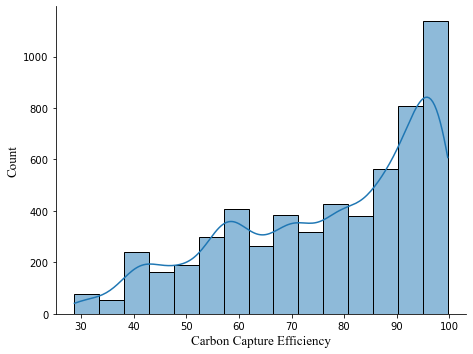

In [12]:
viz = sns.displot(df["CO2 Capture Efficiency"], bins=15, kde=True, height=5, aspect=1.33)
viz.ax.set_xlabel(xlabel= 'Carbon Capture Efficiency',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Capture Efficiency Distribution.png", dpi=600)

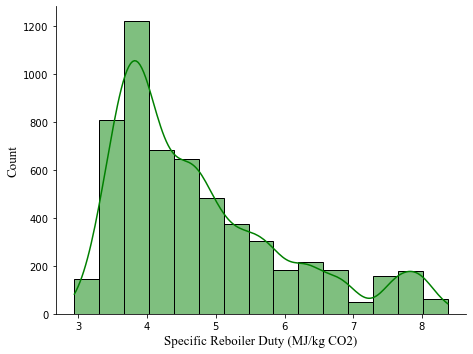

In [13]:
viz = sns.displot(df["SRD (MJ/kg CO2)"], bins=15, kde=True, height=5, aspect=1.33, color='green')
viz.ax.set_xlabel(xlabel= 'Specific Reboiler Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Reboiler Duty Distribution.png", dpi=600)

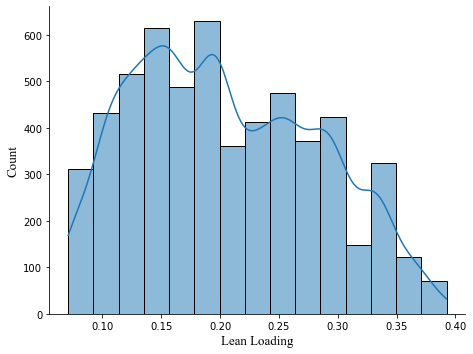

In [14]:
viz = sns.displot(df["Lean Loading"], bins=15, kde=True, height=5, aspect=1.33)
viz.ax.set_xlabel(xlabel= 'Lean Loading',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Lean Loading Distribution.png", dpi=600)

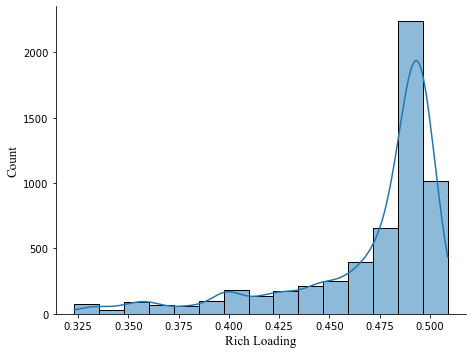

In [15]:
viz = sns.displot(df["Rich Loading"], bins=15, kde=True, height=5, aspect=1.33)
viz.ax.set_xlabel(xlabel= 'Rich Loading',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Rich Loading Distribution.png", dpi=600)

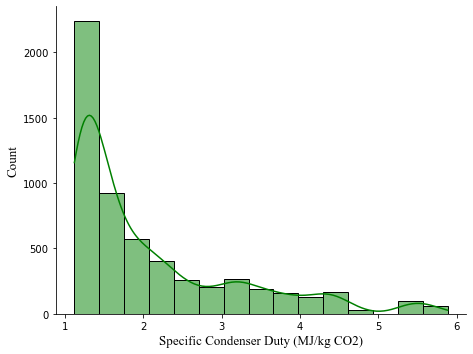

In [16]:
viz = sns.displot(df["Condensor Specific Duty"], bins=15, kde=True, height=5, aspect=1.33, color='green')
viz.ax.set_xlabel(xlabel= 'Specific Condenser Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Condenser Duty Distribution.png", dpi=600)

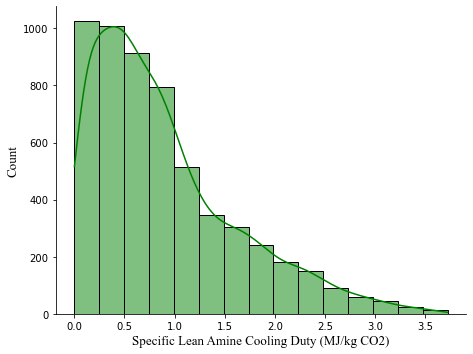

In [17]:
viz = sns.displot(df["SLAD (MJ/kg)"], bins=15, kde=True, height=5, aspect=1.33, color='green')
viz.ax.set_xlabel(xlabel= 'Specific Lean Amine Cooling Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Lean Amine Cooling Duty Distribution.png", dpi=600)

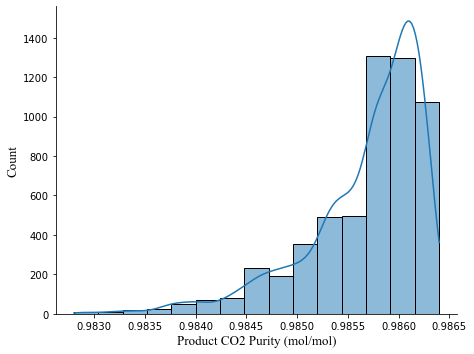

In [18]:
viz = sns.displot(df["CO2 Product purity"], bins=15, kde=True, height=5, aspect=1.33)
viz.ax.set_xlabel(xlabel= 'Product CO2 Purity (mol/mol)',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\Product CO2 Purity Distribution.png", dpi=600)

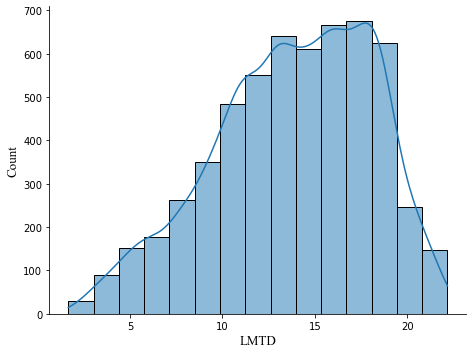

In [19]:
viz = sns.displot(df["LMTD"], bins=15, kde=True, height=5, aspect=1.33)
viz.ax.set_xlabel(xlabel= 'LMTD',fontname="Times New Roman", fontsize=13)
viz.ax.set_ylabel(ylabel= 'Count',fontname="Times New Roman", fontsize=13)
viz.savefig("Figures\\LMTD Distribution.png", dpi=600)

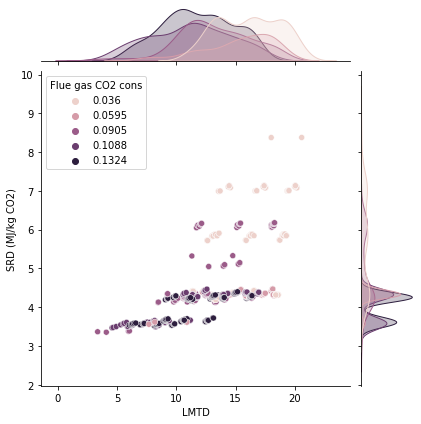

In [20]:
sns.jointplot(data= df[ (df["CO2 Capture Efficiency"] >= 85) & (df["CO2 Capture Efficiency"] <= 90)] , 
              x= "LMTD", 
              y="SRD (MJ/kg CO2)",
              hue="Flue gas CO2 cons",
              cmap="Blues"
             )

# Machine Learning

#### Import common Machine Learning Packages

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from joblib import dump, load

#### Define the inputs & outputs (Features and Targets)

In [22]:
input_columnsA = ["FG Temperature", "Lean Loading",'Lean Amine Temperature','L/G (kg/kg)','Flue gas CO2 cons','CO2 Capture Efficiency','LMTD','Abs Height']
input_columnsN = ["FG Temperature", "Lean Loading",'Lean Amine Temperature','L/G (kg/kg)','Flue gas CO2 cons','CO2 Capture Efficiency']

In [23]:
output_columns = ["SRD (MJ/kg CO2)", "Condensor Specific Duty", "SLAD (MJ/kg)"] 

In [24]:
# XA Represents the data for Advanced Feature Set
XA = df[input_columnsA]

In [25]:
# XN Represents the data for Normal Feature Set
XN = df[input_columnsN]

In [26]:
y = df[output_columns]

In [27]:
# 70% & 30% train / test split
XA_train, XA_test, y_train, y_test = train_test_split(XA, y, test_size=0.30, random_state=211)
XN_train, XN_test, y_train, y_test = train_test_split(XN, y, test_size=0.30, random_state=211)

#### Define the dataframe function for performance evaluation

In [28]:
# Here the dataframes that are supposed to store the ML model performance metrics are initiated

metric_columns = ["name","R^2_A", "MAE_A", "MAPE_A", "RMSE_A", "R^2_N", "MAE_N", "MAPE_N", "RMSE_N"]

performance_SRD = pd.DataFrame(columns=metric_columns)
performance_ConSD = pd.DataFrame(columns=metric_columns)
performance_SLAD = pd.DataFrame(columns=metric_columns)

In [29]:
# The next 3 Cells take the ML model and calculate its performance metrics (one for each of the target values)

In [30]:
def evaldf_SRD(A_pred, N_pred, model_name, performance_SRD):
    
    row = pd.DataFrame(
                        {
                         "name": str(str(model_name) + '_SRD'),
                         "R^2_A": r2_score(y_test["SRD (MJ/kg CO2)"], A_pred[: , 0]),
                         "MAE_A": mean_absolute_error(y_test["SRD (MJ/kg CO2)"], A_pred[: , 0]),
                         "MAPE_A": mean_absolute_percentage_error(y_test["SRD (MJ/kg CO2)"], A_pred[: , 0]),
                         "RMSE_A": np.sqrt(mean_squared_error(y_test["SRD (MJ/kg CO2)"], A_pred[: , 0])),
                         "R^2_N": r2_score(y_test["SRD (MJ/kg CO2)"], N_pred[: , 0]),
                         "MAE_N": mean_absolute_error(y_test["SRD (MJ/kg CO2)"], N_pred[: , 0]),
                         "MAPE_N": mean_absolute_percentage_error(y_test["SRD (MJ/kg CO2)"], N_pred[: , 0]),
                         "RMSE_N": np.sqrt(mean_squared_error(y_test["SRD (MJ/kg CO2)"], N_pred[: , 0]))
                        }
            , index=[0])
    
    performance_SRD = pd.concat([performance_SRD, row], ignore_index=True)        
    
    return performance_SRD
    

In [31]:
def evaldf_ConSD(A_pred, N_pred, model_name, performance_ConSD):
    
    row = pd.DataFrame(
                        {
                         "name": str(str(model_name) + '_ConsSD'),
                         "R^2_A": r2_score(y_test["Condensor Specific Duty"], A_pred[: , 1]),
                         "MAE_A": mean_absolute_error(y_test["Condensor Specific Duty"], A_pred[: , 1]),
                         "MAPE_A": mean_absolute_percentage_error(y_test["Condensor Specific Duty"], A_pred[: , 1]),
                         "RMSE_A": np.sqrt(mean_squared_error(y_test["Condensor Specific Duty"], A_pred[: , 1])),
                         "R^2_N": r2_score(y_test["Condensor Specific Duty"], N_pred[: , 1]),
                         "MAE_N": mean_absolute_error(y_test["Condensor Specific Duty"], N_pred[: , 1]),
                         "MAPE_N": mean_absolute_percentage_error(y_test["Condensor Specific Duty"], N_pred[: , 1]),
                         "RMSE_N": np.sqrt(mean_squared_error(y_test["Condensor Specific Duty"], N_pred[: , 1]))
                        }
            , index=[0])

    
    performance_ConSD = pd.concat([performance_ConSD, row], ignore_index=True) 
    
    return performance_ConSD
    

In [32]:
def evaldf_SLAD(A_pred, N_pred, model_name, performance_SLAD):
    
    row = pd.DataFrame(
                        {
                         "name": str(str(model_name) + '_SLAD'),
                         "R^2_A": r2_score(y_test["SLAD (MJ/kg)"], A_pred[: , 2]),
                         "MAE_A": mean_absolute_error(y_test["SLAD (MJ/kg)"], A_pred[: , 2]),
                         "MAPE_A": mean_absolute_percentage_error(y_test["SLAD (MJ/kg)"], A_pred[: , 2]),
                         "RMSE_A": np.sqrt(mean_squared_error(y_test["SLAD (MJ/kg)"], A_pred[: , 2])),
                         "R^2_N": r2_score(y_test["SLAD (MJ/kg)"], N_pred[: , 2]),
                         "MAE_N": mean_absolute_error(y_test["SLAD (MJ/kg)"], N_pred[: , 2]),
                         "MAPE_N": mean_absolute_percentage_error(y_test["SLAD (MJ/kg)"], N_pred[: , 2]),
                         "RMSE_N": np.sqrt(mean_squared_error(y_test["SLAD (MJ/kg)"], N_pred[: , 2]))
                        }
            , index=[0])

    performance_SLAD = pd.concat([performance_SLAD, row], ignore_index=True)       

    return performance_SLAD
     
 

#### Define the ploting function

In [33]:
# Here the plot configuration for graphic evaluation of the ML models are defined


def plot_result(A_pred, N_pred, name):
    figs, axes = plt.subplots(nrows=3, ncols=2, figsize=(15,15), dpi=300)
    

    axes[0,0].plot(np.arange(2,10), np.arange(2,10), color = "red")
    axes[0,0].scatter(y_test["SRD (MJ/kg CO2)"], A_pred[: , 0], alpha=0.1)
    axes[0,0].set_xlabel('Actual Specific Reboiler Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[0,0].set_ylabel('Predicted Specific Reboiler Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[0,0].set_title('Plots for advanced feature set',fontname="Times New Roman", fontsize=18)
    
    
    axes[0,1].plot(np.arange(2,10), np.arange(2,10), color = "red")
    axes[0,1].scatter(y_test["SRD (MJ/kg CO2)"], N_pred[: , 0], alpha=0.1)
    axes[0,1].set_xlabel('Actual Specific Reboiler Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[0,1].set_ylabel('Predicted Specific Reboiler Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[0,1].set_title('Plots for normal feature set',fontname="Times New Roman", fontsize=18)
    
    
    

    axes[1,0].plot(np.arange(0,7), np.arange(0,7), color = "red")
    axes[1,0].scatter(y_test['Condensor Specific Duty'], A_pred[: , 1], alpha=0.1)
    axes[1,0].set_xlabel('Actual Specific Condenser Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[1,0].set_ylabel('Predicted Specific Condenser Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)

    
    axes[1,1].plot(np.arange(0,7), np.arange(0,7), color = "red")
    axes[1,1].scatter(y_test['Condensor Specific Duty'], N_pred[: , 1], alpha=0.1)
    axes[1,1].set_xlabel('Actual Specific Condenser Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[1,1].set_ylabel('Predicted Specific Condenser Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)

    
    axes[2,0].plot(np.arange(0,5), np.arange(0,5), color = "red")
    axes[2,0].scatter(y_test['SLAD (MJ/kg)'], A_pred[: , 2], alpha=0.1)
    axes[2,0].set_xlabel('Actual Specific Lean Amine Cooling Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[2,0].set_ylabel('Predicted Specific Lean Amine Cooling Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    
    
    axes[2,1].plot(np.arange(0,5), np.arange(0,5), color = "red")
    axes[2,1].scatter(y_test['SLAD (MJ/kg)'], N_pred[: , 2], alpha=0.1)
    axes[2,1].set_xlabel('Actual Specific Lean Amine Cooling Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    axes[2,1].set_ylabel('Predicted Specific Lean Amine Cooling Duty (MJ/kg CO2)',fontname="Times New Roman", fontsize=10)
    
    
    plt.savefig('Figures\\' + name + ' model performance.png', dpi=600, bbox_inches='tight')
    

In [34]:
# Defining a random state

rs = 211

## Decision Tree

In [35]:
from sklearn.tree import DecisionTreeRegressor

In [36]:
DTmodelA = MultiOutputRegressor(DecisionTreeRegressor(max_depth=None,
                                                      max_features=1.0,
                                                      max_leaf_nodes=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      splitter='best',
                                                      random_state=rs)
                                ).fit(XA_train, y_train)

DTmodelN = MultiOutputRegressor(DecisionTreeRegressor(max_depth=None,
                                                      max_features=1.0,
                                                      max_leaf_nodes=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      splitter='best',
                                                      random_state=rs)
                               ).fit(XN_train, y_train)

In [37]:
DTmodelA_pred = DTmodelA.predict(XA_test)
DTmodelN_pred = DTmodelN.predict(XN_test)

In [38]:
performance_SRD = evaldf_SRD(DTmodelA_pred, DTmodelN_pred, 'DT', performance_SRD)
performance_ConSD = evaldf_ConSD(DTmodelA_pred, DTmodelN_pred, 'DT', performance_ConSD)
performance_SLAD = evaldf_SLAD(DTmodelA_pred, DTmodelN_pred, 'DT', performance_SLAD)

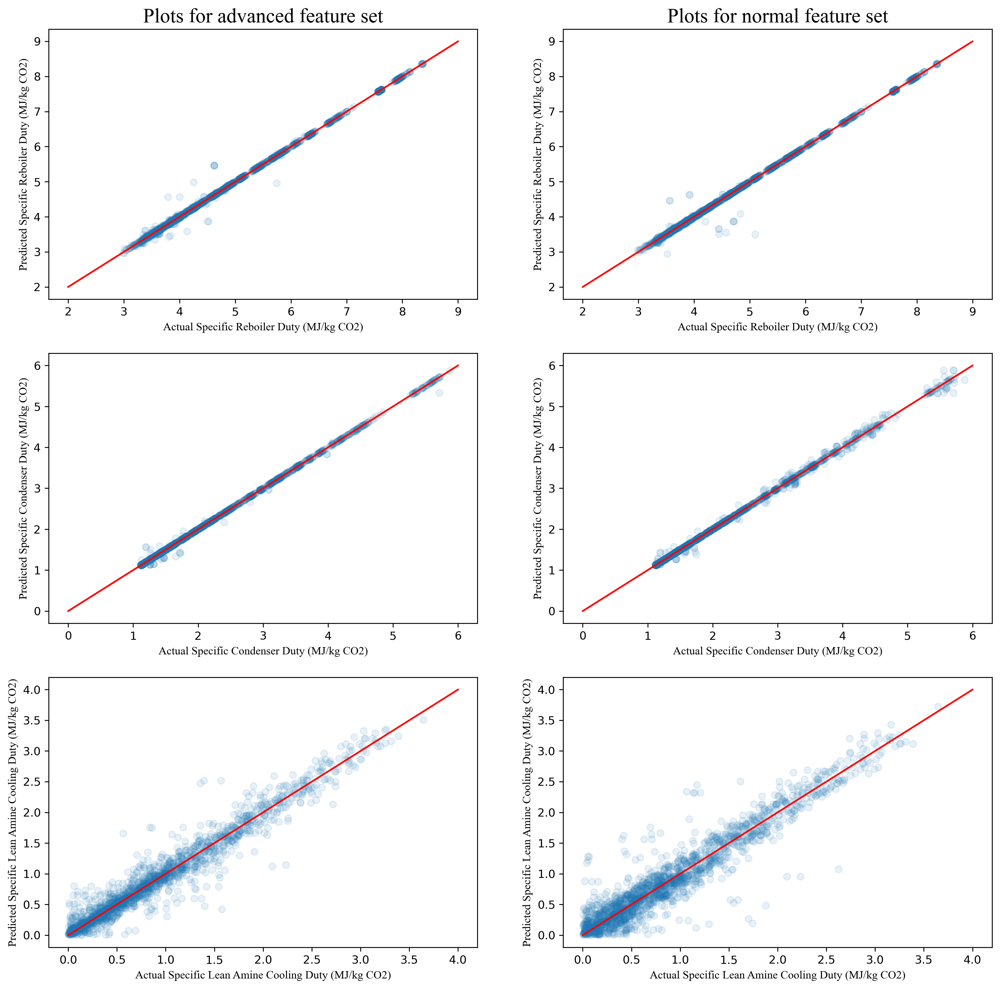

In [39]:
plot_result(DTmodelA_pred, DTmodelN_pred, 'DT')

## Random Forest

In [40]:
from sklearn.ensemble import RandomForestRegressor

In [41]:
RFmodelA = MultiOutputRegressor(RandomForestRegressor(max_depth=20,
                                                      max_features=6,
                                                      n_estimators=600,
                                                      n_jobs=-1,
                                                      random_state=rs)
                                ).fit(XA_train, y_train)

RFmodelN = MultiOutputRegressor(RandomForestRegressor(max_depth=20,
                                                      max_features=6,
                                                      n_estimators=600,
                                                      n_jobs=-1,
                                                      random_state=rs)
                               ).fit(XN_train, y_train)

In [42]:
RFmodelA_pred = RFmodelA.predict(XA_test)
RFmodelN_pred = RFmodelN.predict(XN_test)

In [43]:
performance_SRD = evaldf_SRD(RFmodelA_pred, RFmodelN_pred, 'RF', performance_SRD)
performance_ConSD = evaldf_ConSD(RFmodelA_pred, RFmodelN_pred, 'RF', performance_ConSD)
performance_SLAD = evaldf_SLAD(RFmodelA_pred, RFmodelN_pred, 'RF', performance_SLAD)

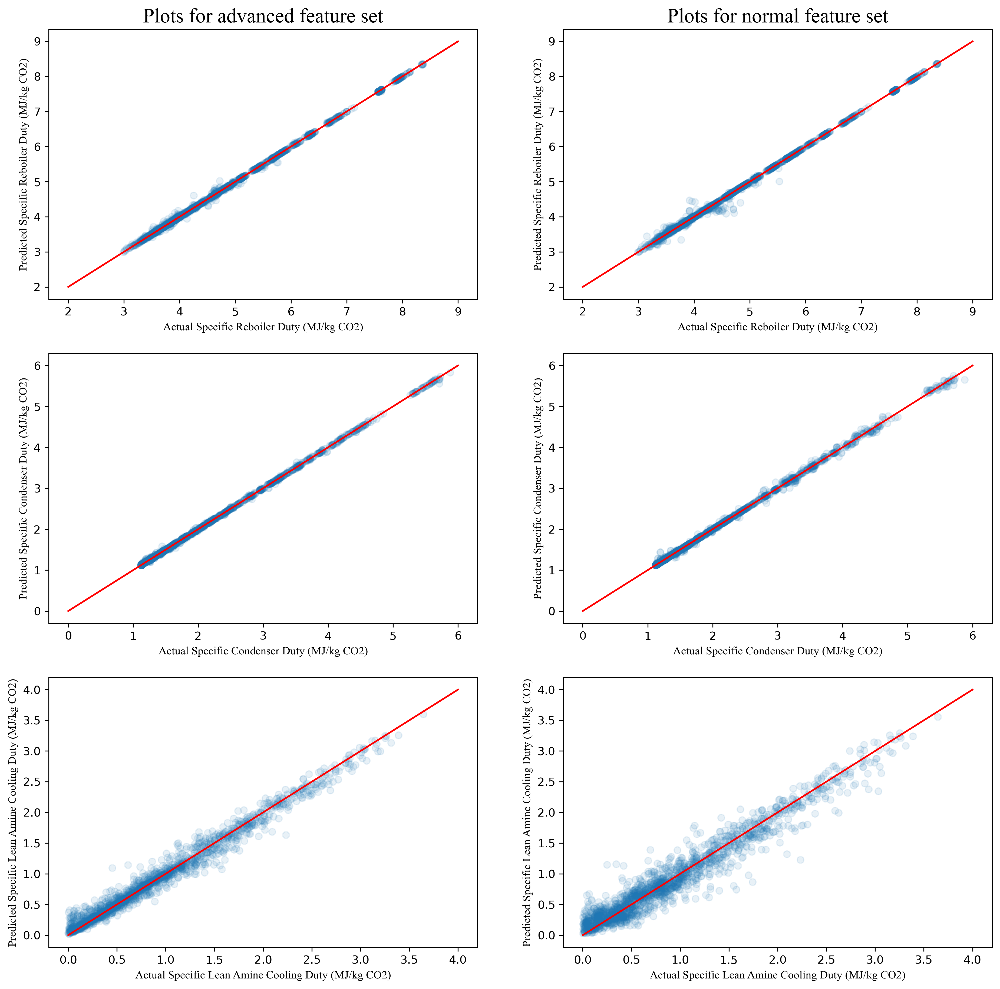

In [44]:
plot_result(RFmodelA_pred, RFmodelN_pred, 'RF')

## XGBoost

In [45]:
from xgboost import XGBRegressor

In [46]:
import warnings
warnings.filterwarnings('ignore')

In [47]:
XGmodelA = MultiOutputRegressor(XGBRegressor(max_depth=10,
                                             learnin_rate=0.05,
                                             subsample=0.8,
                                             n_estimators=250,
                                             n_jobs=-1,
                                             verbosity=0,
                                             random_state=rs)
                               ).fit(XA_train, y_train)

XGmodelN = MultiOutputRegressor(XGBRegressor(max_depth=10,
                                             learnin_rate=0.05,
                                             subsample=0.8,
                                             n_estimators=250,
                                             n_jobs=-1,
                                             verbosity=0,
                                             random_state=rs)
                               ).fit(XN_train, y_train)

In [48]:
XGmodelA_pred = XGmodelA.predict(XA_test)
XGmodelN_pred = XGmodelN.predict(XN_test)

In [49]:
performance_SRD = evaldf_SRD(XGmodelA_pred, XGmodelN_pred, 'XG', performance_SRD)
performance_ConSD = evaldf_ConSD(XGmodelA_pred, XGmodelN_pred, 'XG', performance_ConSD)
performance_SLAD = evaldf_SLAD(XGmodelA_pred, XGmodelN_pred, 'XG', performance_SLAD)

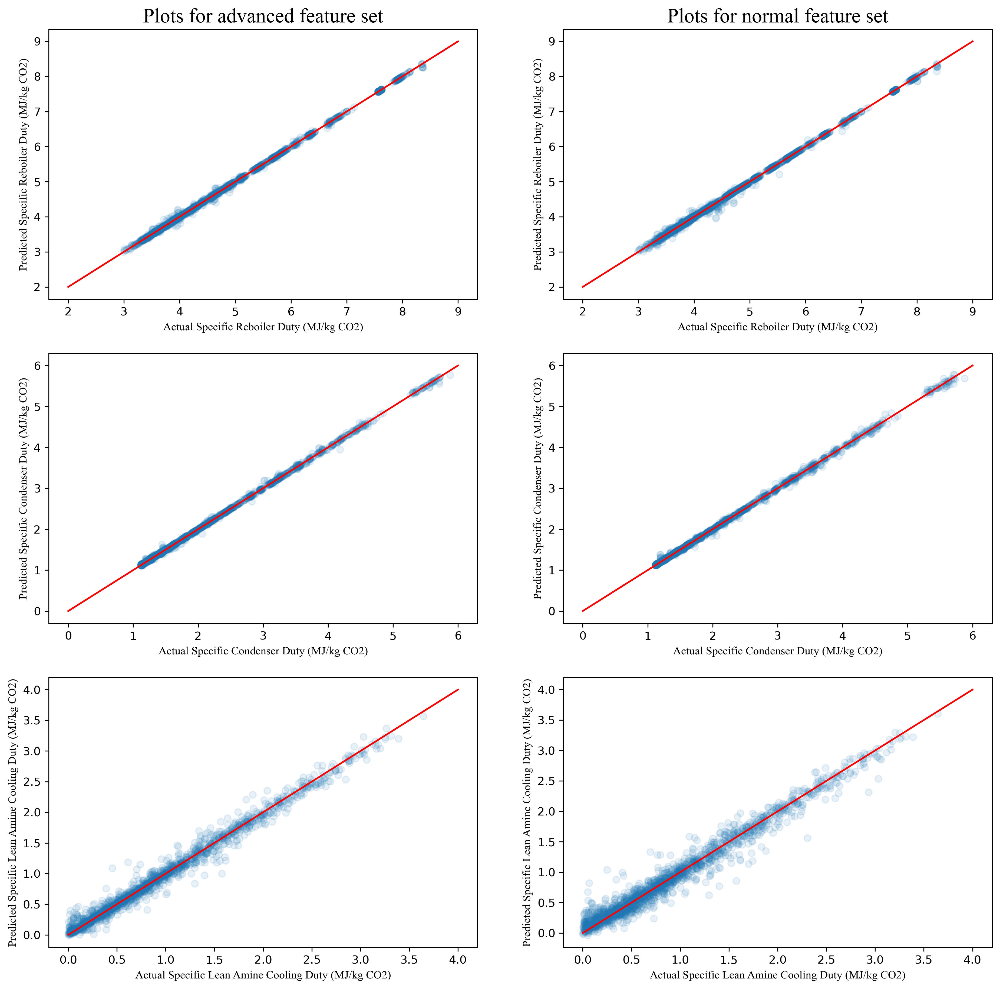

In [50]:
plot_result(XGmodelA_pred, XGmodelN_pred, 'XG')

## SVM

In [51]:
from sklearn.svm import SVR

In [52]:
SVmodelA = MultiOutputRegressor(Pipeline([('scaler', StandardScaler()),
                                          ('svrA', SVR(C=100, degree=2, gamma= 'auto', kernel ='rbf'))])
                               ).fit(XA_train, y_train)

SVmodelN = MultiOutputRegressor(Pipeline([('scaler', StandardScaler()),
                                          ('svrN', SVR(C=100, degree=2, gamma= 'auto', kernel ='rbf'))])
                               ).fit(XN_train, y_train)

In [53]:
SVmodelA_pred = SVmodelA.predict(XA_test)
SVmodelN_pred = SVmodelN.predict(XN_test)

In [54]:
performance_SRD = evaldf_SRD(SVmodelA_pred, SVmodelN_pred, 'SV', performance_SRD)
performance_ConSD = evaldf_ConSD(SVmodelA_pred, SVmodelN_pred, 'SV', performance_ConSD)
performance_SLAD = evaldf_SLAD(SVmodelA_pred, SVmodelN_pred, 'SV', performance_SLAD)

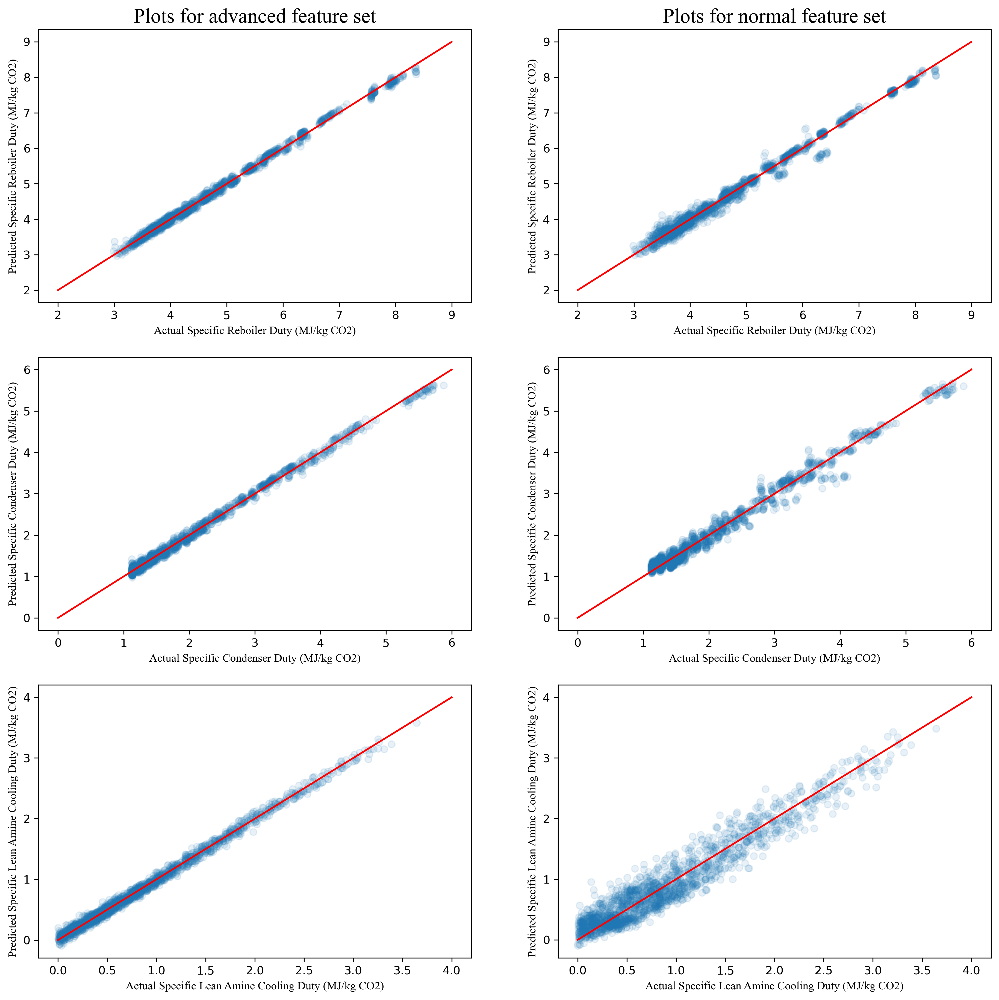

In [55]:
plot_result(SVmodelA_pred, SVmodelN_pred, 'SV')

## DL

In [56]:
import tensorflow as tf

In [57]:
scalerA = StandardScaler()
scalerA.fit(XA_train)
XA_train_s = pd.DataFrame(scalerA.transform(XA_train), columns=XA_train.columns)
XA_test_s = pd.DataFrame(scalerA.transform(XA_test), columns=XA_test.columns)

In [58]:
scalerN = StandardScaler()
scalerN.fit(XN_train)
XN_train_s = pd.DataFrame(scalerN.transform(XN_train), columns=XN_train.columns)
XN_test_s = pd.DataFrame(scalerN.transform(XN_test), columns=XN_test.columns)

In [59]:
np.random.seed(rs)
tf.random.set_seed(rs)

In [60]:
DLmodelA = tf.keras.Sequential()

DLmodelA.add(tf.keras.layers.Dense(22, input_dim=XA_train_s.shape[1], activation='tanh'))
DLmodelA.add(tf.keras.layers.Dense(26, activation='tanh'))
DLmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelA.add(tf.keras.layers.Dense(3))

DLmodelA.compile(loss="mean_squared_error", optimizer="adam")

DLmodelA.fit(XA_train_s, y_train, epochs= 150)

Epoch 1/150
125/125 [==============================] - 1s 3ms/step - loss: 3.2238
Epoch 2/150
125/125 [==============================] - 0s 3ms/step - loss: 0.4089
Epoch 3/150
125/125 [==============================] - 0s 3ms/step - loss: 0.2881
Epoch 4/150
125/125 [==============================] - 0s 3ms/step - loss: 0.1931
Epoch 5/150
125/125 [==============================] - 0s 3ms/step - loss: 0.1259
Epoch 6/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0831
Epoch 7/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0623
Epoch 8/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0507
Epoch 9/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0416
Epoch 10/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0339
Epoch 11/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0292
Epoch 12/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0255
Epoch 13/150


125/125 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 100/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 101/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 102/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 103/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 104/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 105/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 106/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 107/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 108/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 109/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 110/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 

In [61]:
DLmodelN = tf.keras.Sequential()

DLmodelN.add(tf.keras.layers.Dense(22, input_dim=XN_train_s.shape[1], activation='tanh'))
DLmodelN.add(tf.keras.layers.Dense(26, activation='tanh'))
DLmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
DLmodelN.add(tf.keras.layers.Dense(3))

DLmodelN.compile(loss="mean_squared_error", optimizer="adam")

DLmodelN.fit(XN_train_s, y_train, epochs= 150)

Epoch 1/150
125/125 [==============================] - 1s 3ms/step - loss: 3.5316
Epoch 2/150
125/125 [==============================] - 0s 3ms/step - loss: 0.4777
Epoch 3/150
125/125 [==============================] - 0s 3ms/step - loss: 0.3459
Epoch 4/150
125/125 [==============================] - 0s 4ms/step - loss: 0.2366
Epoch 5/150
125/125 [==============================] - 0s 4ms/step - loss: 0.1528
Epoch 6/150
125/125 [==============================] - 0s 4ms/step - loss: 0.1008
Epoch 7/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0734
Epoch 8/150
125/125 [==============================] - 0s 4ms/step - loss: 0.0618
Epoch 9/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0524
Epoch 10/150
125/125 [==============================] - 0s 4ms/step - loss: 0.0475
Epoch 11/150
125/125 [==============================] - 0s 4ms/step - loss: 0.0431
Epoch 12/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0416
Epoch 13/150


125/125 [==============================] - 0s 3ms/step - loss: 0.0258
Epoch 100/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0248
Epoch 101/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0251
Epoch 102/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0250
Epoch 103/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0252
Epoch 104/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0263
Epoch 105/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0248
Epoch 106/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0245
Epoch 107/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0255
Epoch 108/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0247
Epoch 109/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0261
Epoch 110/150
125/125 [==============================] - 0s 3ms/step - loss: 0.0245
Epoch 

In [62]:
DLmodelA_pred = DLmodelA.predict(XA_test_s)
DLmodelN_pred = DLmodelN.predict(XN_test_s)

54/54 [==============================] - 0s 1ms/step


In [63]:
performance_SRD = evaldf_SRD(DLmodelA_pred, DLmodelN_pred, 'DL', performance_SRD)
performance_ConSD = evaldf_ConSD(DLmodelA_pred, DLmodelN_pred, 'DL', performance_ConSD)
performance_SLAD = evaldf_SLAD(DLmodelA_pred, DLmodelN_pred, 'DL', performance_SLAD)

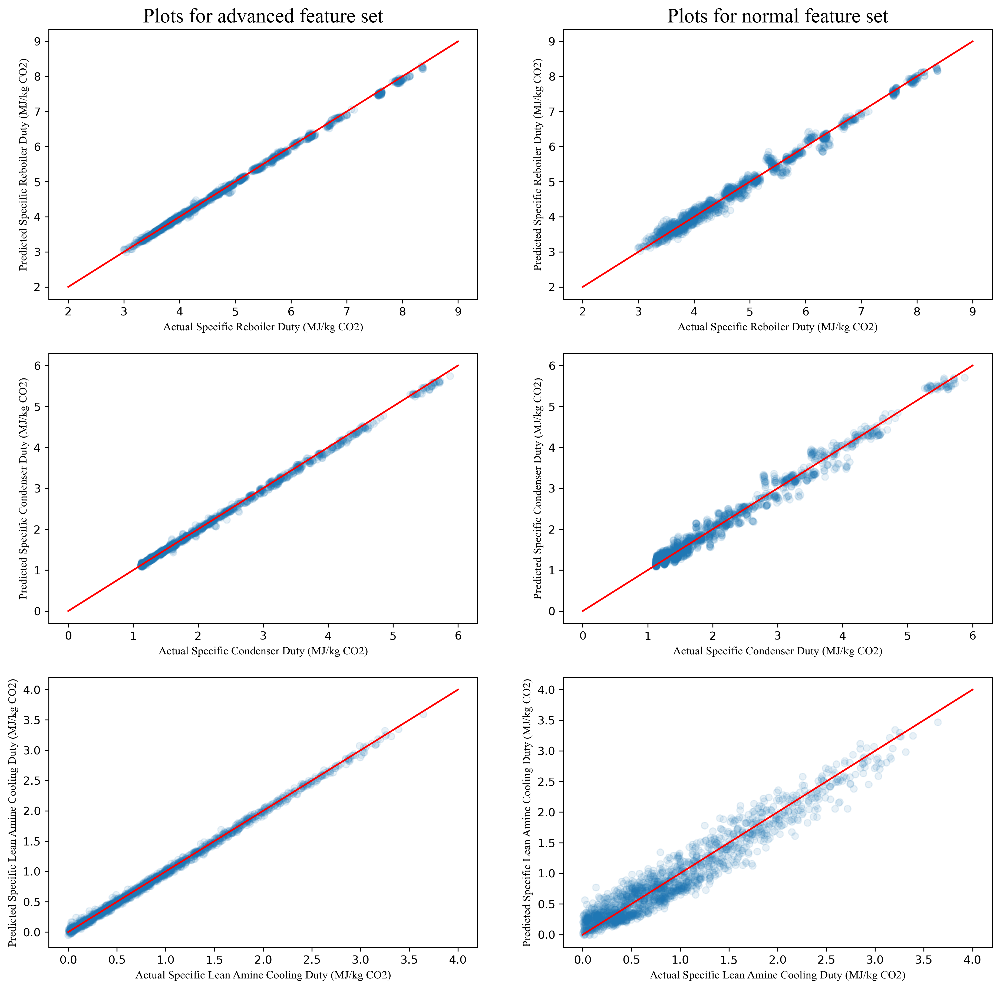

In [64]:
plot_result(DLmodelA_pred, DLmodelN_pred, 'DL')

### Performance Table

In [65]:
performance_SRD.to_excel('Tables\\Specific Reboiler Duty performance.xlsx', index=False )
performance_SRD 

,name,R^2_A,MAE_A,MAPE_A,RMSE_A,R^2_N,MAE_N,MAPE_N,RMSE_N
0,DT_SRD,0.997294,0.015638,0.003795,0.064721,0.99551,0.015158,0.003674,0.083377
1,RF_SRD,0.999386,0.014781,0.003459,0.030843,0.998094,0.018596,0.004585,0.054328
2,XG_SRD,0.999342,0.01648,0.003778,0.031924,0.99878,0.021415,0.005133,0.043466
3,SV_SRD,0.996522,0.060836,0.01311,0.073376,0.988253,0.096567,0.021752,0.134859
4,DL_SRD,0.99862,0.033606,0.006771,0.046225,0.988691,0.101462,0.022632,0.132323


In [66]:
performance_ConSD.to_excel('Tables\\Specific Condenser Duty performance.xlsx', index=False )
performance_ConSD

,name,R^2_A,MAE_A,MAPE_A,RMSE_A,R^2_N,MAE_N,MAPE_N,RMSE_N
0,DT_ConsSD,0.999265,0.007175,0.003853,0.029584,0.99845,0.014649,0.005433,0.042966
1,RF_ConsSD,0.999776,0.008564,0.004428,0.016345,0.99911,0.014963,0.006244,0.032561
2,XG_ConsSD,0.999552,0.011423,0.0056,0.023105,0.999243,0.014771,0.006311,0.030037
3,SV_ConsSD,0.995443,0.061178,0.033704,0.073682,0.982607,0.110182,0.059599,0.143944
4,DL_ConsSD,0.998279,0.031618,0.014681,0.045283,0.981887,0.112858,0.060602,0.146893


In [67]:
performance_SLAD.to_excel('Tables\\Specific LA Cooling Duty performance.xlsx', index=False )
performance_SLAD 

,name,R^2_A,MAE_A,MAPE_A,RMSE_A,R^2_N,MAE_N,MAPE_N,RMSE_N
0,DT_SLAD,0.941458,0.109687,0.379711,0.174496,0.892017,0.157863,0.636279,0.236989
1,RF_SLAD,0.978656,0.07095,0.46501,0.105364,0.939603,0.130061,0.678397,0.177239
2,XG_SLAD,0.984334,0.057258,0.308705,0.090266,0.967092,0.089376,0.420662,0.130828
3,SV_SLAD,0.993737,0.047019,0.275767,0.057075,0.919221,0.168389,0.756183,0.204975
4,DL_SLAD,0.997717,0.026684,0.155865,0.034459,0.928654,0.156755,0.659426,0.192636


### Out of Range evaluations (outer scope)

In [68]:
ds = pd.read_excel('data/ds_data.xlsx')

In [69]:
ds = ds[ds["LMTD"] > 0]

In [70]:
ds = ds[ds["LA Chilling Duty"] >= 0]

In [71]:
ds["SLAD (MJ/kg)"] = (0.001 * ds["LA Chilling Duty"]) / ds["Captured CO2 (kg/h)"]

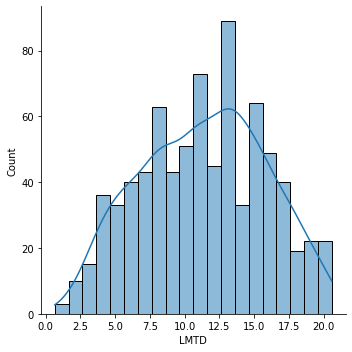

In [72]:
sns.displot(ds["LMTD"], bins=20, kde=True)

In [73]:
ds_inp_A = ds[input_columnsA]
ds_inp_N = ds[input_columnsN]

In [74]:
ds_out = ds[output_columns]

In [75]:
DTmodelA_dspred = DTmodelA.predict(ds_inp_A)
RFmodelA_dspred = RFmodelA.predict(ds_inp_A)
XGmodelA_dspred = XGmodelA.predict(ds_inp_A)
SVmodelA_dspred = SVmodelA.predict(ds_inp_A)
DLmodelA_dspred = DLmodelA.predict(scalerA.transform(ds_inp_A))

25/25 [==============================] - 0s 3ms/step


In [76]:
DTmodelN_dspred = DTmodelN.predict(ds_inp_N)
RFmodelN_dspred = RFmodelN.predict(ds_inp_N)
XGmodelN_dspred = XGmodelN.predict(ds_inp_N)
SVmodelN_dspred = SVmodelN.predict(ds_inp_N)
DLmodelN_dspred = DLmodelN.predict(scalerN.transform(ds_inp_N))

25/25 [==============================] - 0s 3ms/step


In [77]:
def ds_plot(Y1, Y2, plot_name):
    
    AB = ['DT', 'RF', 'XG', 'SV', 'DL']
    AB_ax = np.arange(len(AB))
    plt.bar(AB_ax - 0.2, Y1, 0.4, label = 'Adv')
    plt.bar(AB_ax + 0.2, Y2, 0.4, label = 'Nor')
    
    plt.xticks(AB_ax, AB)
    plt.xlabel("ML Models", fontname="Times New Roman", fontsize=10)
    plt.ylabel("% MAPE", fontname="Times New Roman", fontsize=10)
    plt.legend()
    
    plt.savefig('Figures\\' + plot_name + ' DS MAPE.jpg', dpi=600, bbox_inches='tight')
    
    plt.show()

In [78]:
Y_0_A = [mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], DTmodelA_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], RFmodelA_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], XGmodelA_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], SVmodelA_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], DLmodelA_dspred[: , 0]) * 100 ]

In [79]:
Y_0_N = [mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], DTmodelN_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], RFmodelN_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], XGmodelN_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], SVmodelN_dspred[: , 0]) * 100 ,
         mean_absolute_percentage_error(ds_out["SRD (MJ/kg CO2)"], DLmodelN_dspred[: , 0]) * 100 ]

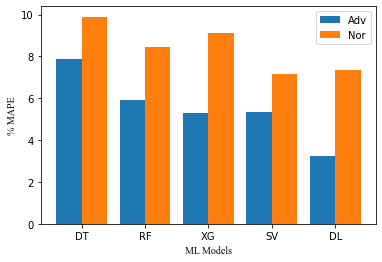

In [80]:
ds_plot(Y_0_A, Y_0_N, 'Specific Reboiler Duty Predictions')

In [81]:
Y_1_A = [mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], DTmodelA_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], RFmodelA_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], XGmodelA_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], SVmodelA_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], DLmodelA_dspred[: , 1]) * 100]

In [82]:
Y_1_N = [mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], DTmodelN_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], RFmodelN_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], XGmodelN_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], SVmodelN_dspred[: , 1]) * 100 ,
         mean_absolute_percentage_error(ds_out["Condensor Specific Duty"], DLmodelN_dspred[: , 1]) * 100]

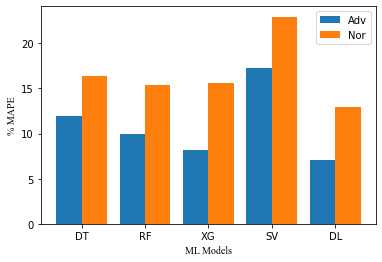

In [83]:
ds_plot(Y_1_A, Y_1_N, 'Specific Condenser Duty Predictions')

In [84]:
Y_2_A = [mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], DTmodelA_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], RFmodelA_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], XGmodelA_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], SVmodelA_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], DLmodelA_dspred[: , 2]) * 100 ]

In [85]:
Y_2_N = [mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], DTmodelN_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], RFmodelN_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], XGmodelN_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], SVmodelN_dspred[: , 2]) * 100 ,
         mean_absolute_percentage_error(ds_out["SLAD (MJ/kg)"], DLmodelN_dspred[: , 2]) * 100 ]

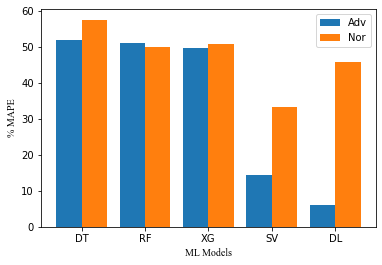

In [86]:
ds_plot(Y_2_A, Y_2_N, 'Specific LA Cooling Duty Predictions')

### Deploy The best models with all data

In [87]:
all_inputA = pd.concat( [XA , ds_inp_A] )
all_inputN = pd.concat( [XN , ds_inp_N] )

In [88]:
all_output = pd.concat( [y , ds_out] )

In [89]:
all_scalerA = StandardScaler()
all_scalerA.fit(all_inputA)
All_XA = pd.DataFrame(all_scalerA.transform(all_inputA), columns=all_inputA.columns)

In [90]:
all_scalerN = StandardScaler()
all_scalerN.fit(all_inputN)
All_XN = pd.DataFrame(all_scalerN.transform(all_inputN), columns=all_inputN.columns)

In [91]:
BmodelA = tf.keras.Sequential()

BmodelA.add(tf.keras.layers.Dense(22, input_dim=All_XA.shape[1], activation='tanh'))
BmodelA.add(tf.keras.layers.Dense(26, activation='tanh'))
BmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelA.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelA.add(tf.keras.layers.Dense(3))

BmodelA.compile(loss="mean_squared_error", optimizer="adam")

In [92]:
BmodelA.fit(All_XA, all_output, epochs= 200)

Epoch 1/200
204/204 [==============================] - 1s 4ms/step - loss: 2.1942
Epoch 2/200
204/204 [==============================] - 1s 3ms/step - loss: 0.3067
Epoch 3/200
204/204 [==============================] - 1s 3ms/step - loss: 0.1801
Epoch 4/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0915
Epoch 5/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0592
Epoch 6/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0418
Epoch 7/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0311
Epoch 8/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0254
Epoch 9/200
204/204 [==============================] - 1s 4ms/step - loss: 0.0218
Epoch 10/200
204/204 [==============================] - 1s 4ms/step - loss: 0.0191
Epoch 11/200
204/204 [==============================] - 1s 4ms/step - loss: 0.0171
Epoch 12/200
204/204 [==============================] - 1s 4ms/step - loss: 0.0156
Epoch 13/200


204/204 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 100/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 101/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 102/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 103/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 104/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0057
Epoch 105/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 106/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 107/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 108/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 109/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 110/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 

204/204 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 197/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 198/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0025
Epoch 199/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 200/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0011


In [93]:
BmodelN = tf.keras.Sequential()

BmodelN.add(tf.keras.layers.Dense(22, input_dim=All_XN.shape[1], activation='tanh'))
BmodelN.add(tf.keras.layers.Dense(26, activation='tanh'))
BmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelN.add(tf.keras.layers.Dense(30, activation='tanh'))
BmodelN.add(tf.keras.layers.Dense(3))

BmodelN.compile(loss="mean_squared_error", optimizer="adam")

In [94]:
BmodelN.fit(All_XN, all_output, epochs= 200)

Epoch 1/200
204/204 [==============================] - 1s 3ms/step - loss: 2.3821
Epoch 2/200
204/204 [==============================] - 1s 3ms/step - loss: 0.3364
Epoch 3/200
204/204 [==============================] - 1s 3ms/step - loss: 0.1894
Epoch 4/200
204/204 [==============================] - 1s 3ms/step - loss: 0.1009
Epoch 5/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0702
Epoch 6/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0609
Epoch 7/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0573
Epoch 8/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0523
Epoch 9/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0496
Epoch 10/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0468
Epoch 11/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0452
Epoch 12/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0440
Epoch 13/200


204/204 [==============================] - 1s 3ms/step - loss: 0.0322
Epoch 100/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0311
Epoch 101/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0317
Epoch 102/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0319
Epoch 103/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0315
Epoch 104/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0321
Epoch 105/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0316
Epoch 106/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0315
Epoch 107/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0321
Epoch 108/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0313
Epoch 109/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0346
Epoch 110/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0311
Epoch 

204/204 [==============================] - 1s 3ms/step - loss: 0.0294
Epoch 197/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0289
Epoch 198/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0302
Epoch 199/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0294
Epoch 200/200
204/204 [==============================] - 1s 3ms/step - loss: 0.0288


In [95]:
BmodelA.save('Finalized_Models\\BmodelA')

INFO:tensorflow:Assets written to: Finalized_Models\BmodelA\assets


In [96]:
BmodelN.save('Finalized_Models\\BmodelN')

INFO:tensorflow:Assets written to: Finalized_Models\BmodelN\assets


### Feature importance evaluation

In [97]:
import shap

In [98]:
explainer = shap.Explainer(BmodelA.predict, All_XA)

In [99]:
shap_values = explainer(All_XA)

28/28 [==============================] - 0s 2ms/step


Exact explainer:   0%|                                                                        | 9/6497 [00:00<?, ?it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   0%|                                                               | 11/6497 [00:11<48:31,  2.23it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   0%|                                                             | 12/6497 [00:12<1:08:20,  1.58it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   0%|                                                             | 13/6497 [00:13<1:18:52,  1.37it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   0%|▏                                                            | 14/6497 [00:14<1:25:19,  1.27it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 15/6497 [00:14<1:29:33,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 16/6497 [00:15<1:31:43,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 17/6497 [00:16<1:33:17,  1.16it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:   0%|▏                                                            | 18/6497 [00:17<1:34:06,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 19/6497 [00:18<1:35:17,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   0%|▏                                                            | 20/6497 [00:19<1:35:36,  1.13it/s]

27/27 [==============================] - 0s 833us/step


Exact explainer:   0%|▏                                                            | 21/6497 [00:20<1:35:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 22/6497 [00:21<1:35:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 23/6497 [00:22<1:36:23,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 24/6497 [00:22<1:36:03,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 25/6497 [00:23<1:36:00,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▏                                                            | 26/6497 [00:24<1:38:03,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   0%|▎                                                            | 27/6497 [00:25<1:38:44,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▎                                                            | 28/6497 [00:26<1:37:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▎                                                            | 29/6497 [00:27<1:37:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   0%|▎                                                            | 30/6497 [00:28<1:36:59,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   0%|▎                                                            | 31/6497 [00:29<1:36:39,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   0%|▎                                                            | 32/6497 [00:30<1:36:24,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▎                                                            | 33/6497 [00:31<1:36:01,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▎                                                            | 34/6497 [00:31<1:36:16,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▎                                                            | 35/6497 [00:32<1:36:32,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▎                                                            | 36/6497 [00:33<1:36:32,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▎                                                            | 37/6497 [00:34<1:36:21,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▎                                                            | 38/6497 [00:35<1:36:21,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▎                                                            | 39/6497 [00:36<1:36:27,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▍                                                            | 40/6497 [00:37<1:36:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 41/6497 [00:38<1:36:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 42/6497 [00:39<1:36:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 43/6497 [00:40<1:37:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 44/6497 [00:41<1:37:49,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 45/6497 [00:41<1:37:24,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 46/6497 [00:42<1:37:00,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 47/6497 [00:43<1:36:56,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 48/6497 [00:44<1:36:46,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▍                                                            | 49/6497 [00:45<1:36:16,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 50/6497 [00:46<1:36:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 51/6497 [00:47<1:36:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▍                                                            | 52/6497 [00:48<1:36:35,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▍                                                            | 53/6497 [00:49<1:36:45,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▌                                                            | 54/6497 [00:49<1:36:42,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 55/6497 [00:50<1:36:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 56/6497 [00:51<1:36:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 57/6497 [00:52<1:36:20,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 58/6497 [00:53<1:36:33,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 59/6497 [00:54<1:36:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 60/6497 [00:55<1:36:47,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 61/6497 [00:56<1:36:31,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 62/6497 [00:57<1:36:32,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 63/6497 [00:58<1:36:30,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 64/6497 [00:58<1:36:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▌                                                            | 65/6497 [00:59<1:36:28,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▌                                                            | 66/6497 [01:00<1:36:43,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 67/6497 [01:01<1:36:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 68/6497 [01:02<1:37:05,  1.10it/s]

28/28 [==============================] - 0s 950us/step


Exact explainer:   1%|▋                                                            | 69/6497 [01:03<1:37:01,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 70/6497 [01:04<1:36:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 71/6497 [01:05<1:36:25,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▋                                                            | 72/6497 [01:06<1:36:34,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 73/6497 [01:07<1:36:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 74/6497 [01:08<1:36:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 75/6497 [01:08<1:36:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 76/6497 [01:09<1:37:11,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 77/6497 [01:10<1:37:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 78/6497 [01:11<1:37:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▋                                                            | 79/6497 [01:12<1:37:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 80/6497 [01:13<1:37:00,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 81/6497 [01:14<1:36:52,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 82/6497 [01:15<1:36:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 83/6497 [01:16<1:36:52,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 84/6497 [01:17<1:36:53,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 85/6497 [01:18<1:36:57,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 86/6497 [01:18<1:36:39,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 87/6497 [01:19<1:36:16,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▊                                                            | 88/6497 [01:20<1:36:29,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 89/6497 [01:21<1:36:03,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▊                                                            | 90/6497 [01:22<1:36:00,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 91/6497 [01:23<1:36:00,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 92/6497 [01:24<1:36:30,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▊                                                            | 93/6497 [01:25<1:37:53,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▉                                                            | 94/6497 [01:26<1:37:22,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▉                                                            | 95/6497 [01:27<1:37:01,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   1%|▉                                                            | 96/6497 [01:27<1:37:08,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   1%|▉                                                            | 97/6497 [01:28<1:36:48,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                            | 98/6497 [01:29<1:36:31,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   2%|▉                                                            | 99/6497 [01:30<1:36:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 100/6497 [01:31<1:36:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 101/6497 [01:32<1:36:01,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 102/6497 [01:33<1:35:44,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|▉                                                           | 103/6497 [01:34<1:36:03,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 104/6497 [01:35<1:36:21,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 105/6497 [01:36<1:35:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 106/6497 [01:36<1:35:27,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|▉                                                           | 107/6497 [01:37<1:35:31,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|▉                                                           | 108/6497 [01:38<1:35:44,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 109/6497 [01:39<1:35:35,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 110/6497 [01:40<1:35:37,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█                                                           | 111/6497 [01:41<1:35:21,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 112/6497 [01:42<1:35:18,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 113/6497 [01:43<1:35:38,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 114/6497 [01:44<1:35:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 115/6497 [01:45<1:35:27,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 116/6497 [01:45<1:35:41,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 117/6497 [01:46<1:35:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 118/6497 [01:47<1:35:50,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 119/6497 [01:48<1:35:46,  1.11it/s]

28/28 [==============================] - 0s 709us/step


Exact explainer:   2%|█                                                           | 120/6497 [01:49<1:36:01,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█                                                           | 121/6497 [01:50<1:35:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 122/6497 [01:51<1:35:46,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▏                                                          | 123/6497 [01:52<1:35:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 124/6497 [01:53<1:36:08,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▏                                                          | 125/6497 [01:54<1:36:13,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 126/6497 [01:54<1:36:07,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 127/6497 [01:55<1:35:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 128/6497 [01:56<1:37:18,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 129/6497 [01:57<1:37:07,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 130/6497 [01:58<1:36:31,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 131/6497 [01:59<1:35:48,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 132/6497 [02:00<1:35:38,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 133/6497 [02:01<1:35:12,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 134/6497 [02:02<1:39:40,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▏                                                          | 135/6497 [02:03<1:38:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 136/6497 [02:04<1:37:14,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 137/6497 [02:05<1:36:09,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 138/6497 [02:05<1:35:31,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▎                                                          | 139/6497 [02:06<1:35:17,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 140/6497 [02:07<1:35:18,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 141/6497 [02:08<1:34:55,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 142/6497 [02:09<1:34:33,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▎                                                          | 143/6497 [02:10<1:34:29,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▎                                                          | 144/6497 [02:11<1:34:48,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 145/6497 [02:12<1:34:49,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 146/6497 [02:13<1:34:49,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▎                                                          | 147/6497 [02:13<1:34:43,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▎                                                          | 148/6497 [02:14<1:35:04,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 149/6497 [02:15<1:35:33,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 150/6497 [02:16<1:35:30,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 151/6497 [02:17<1:36:09,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▍                                                          | 152/6497 [02:18<1:36:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 153/6497 [02:19<1:35:49,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:   2%|█▍                                                          | 154/6497 [02:20<1:35:35,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 155/6497 [02:21<1:36:41,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   2%|█▍                                                          | 156/6497 [02:22<1:36:01,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 157/6497 [02:23<1:35:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 158/6497 [02:23<1:34:48,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 159/6497 [02:24<1:34:39,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 160/6497 [02:25<1:36:47,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 161/6497 [02:26<1:35:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   2%|█▍                                                          | 162/6497 [02:27<1:35:29,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▌                                                          | 163/6497 [02:28<1:35:35,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 164/6497 [02:29<1:35:23,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 165/6497 [02:30<1:35:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 166/6497 [02:31<1:34:58,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 167/6497 [02:32<1:34:39,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 168/6497 [02:32<1:34:33,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▌                                                          | 169/6497 [02:33<1:34:19,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▌                                                          | 170/6497 [02:34<1:34:19,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 171/6497 [02:35<1:34:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 172/6497 [02:36<1:35:53,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 173/6497 [02:37<1:35:24,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▌                                                          | 174/6497 [02:38<1:35:08,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▌                                                          | 175/6497 [02:39<1:35:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 176/6497 [02:40<1:35:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 177/6497 [02:41<1:34:42,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 178/6497 [02:41<1:35:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 179/6497 [02:42<1:34:52,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 180/6497 [02:43<1:34:56,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 181/6497 [02:44<1:34:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 182/6497 [02:45<1:34:13,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 183/6497 [02:46<1:34:18,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 184/6497 [02:47<1:34:49,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▋                                                          | 185/6497 [02:48<1:34:19,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 186/6497 [02:49<1:34:19,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 187/6497 [02:50<1:35:05,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 188/6497 [02:51<1:35:55,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▋                                                          | 189/6497 [02:51<1:36:45,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 190/6497 [02:52<1:36:55,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 191/6497 [02:53<1:37:09,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 192/6497 [02:54<1:38:02,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 193/6497 [02:55<1:36:55,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▊                                                          | 194/6497 [02:56<1:36:58,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▊                                                          | 195/6497 [02:57<1:36:55,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 196/6497 [02:58<1:36:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 197/6497 [02:59<1:36:13,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▊                                                          | 198/6497 [03:00<1:35:59,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▊                                                          | 199/6497 [03:01<1:37:13,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 200/6497 [03:02<1:36:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 201/6497 [03:02<1:35:56,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▊                                                          | 202/6497 [03:03<1:35:52,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▊                                                          | 203/6497 [03:04<1:35:36,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 204/6497 [03:05<1:35:43,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 205/6497 [03:06<1:35:37,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 206/6497 [03:07<1:36:03,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▉                                                          | 207/6497 [03:08<1:35:52,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 208/6497 [03:09<1:35:44,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|█▉                                                          | 209/6497 [03:10<1:35:32,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 210/6497 [03:11<1:35:15,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 211/6497 [03:12<1:35:06,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 212/6497 [03:12<1:34:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 213/6497 [03:13<1:34:44,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 214/6497 [03:14<1:34:26,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 215/6497 [03:15<1:34:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|█▉                                                          | 216/6497 [03:16<1:33:56,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 217/6497 [03:17<1:33:34,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   3%|██                                                          | 218/6497 [03:18<1:33:10,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 219/6497 [03:19<1:33:41,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 220/6497 [03:20<1:33:53,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 221/6497 [03:21<1:34:15,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 222/6497 [03:21<1:34:25,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 223/6497 [03:22<1:34:22,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 224/6497 [03:23<1:34:26,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   3%|██                                                          | 225/6497 [03:24<1:33:52,  1.11it/s]

28/28 [==============================] - 0s 716us/step


Exact explainer:   3%|██                                                          | 226/6497 [03:25<1:34:03,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   3%|██                                                          | 227/6497 [03:26<1:36:08,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██                                                          | 228/6497 [03:27<1:35:47,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██                                                          | 229/6497 [03:28<1:36:04,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██                                                          | 230/6497 [03:29<1:35:19,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 231/6497 [03:30<1:34:34,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 232/6497 [03:31<1:34:39,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 233/6497 [03:31<1:34:46,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 234/6497 [03:32<1:34:35,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▏                                                         | 235/6497 [03:33<1:34:10,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▏                                                         | 236/6497 [03:34<1:34:05,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 237/6497 [03:35<1:33:56,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 238/6497 [03:36<1:33:59,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 239/6497 [03:37<1:33:42,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 240/6497 [03:38<1:33:56,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 241/6497 [03:39<1:33:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 242/6497 [03:40<1:33:29,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▏                                                         | 243/6497 [03:40<1:33:41,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 244/6497 [03:41<1:33:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 245/6497 [03:42<1:33:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 246/6497 [03:43<1:33:47,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 247/6497 [03:44<1:33:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 248/6497 [03:45<1:34:30,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 249/6497 [03:46<1:33:51,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▎                                                         | 250/6497 [03:47<1:33:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 251/6497 [03:48<1:33:30,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▎                                                         | 252/6497 [03:49<1:33:48,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 253/6497 [03:49<1:33:47,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 254/6497 [03:50<1:33:34,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▎                                                         | 255/6497 [03:51<1:33:07,  1.12it/s]

28/28 [==============================] - 0s 749us/step


Exact explainer:   4%|██▎                                                         | 256/6497 [03:52<1:33:32,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▎                                                         | 257/6497 [03:53<1:33:28,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▍                                                         | 258/6497 [03:54<1:33:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 259/6497 [03:55<1:33:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 260/6497 [03:56<1:33:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 261/6497 [03:57<1:33:16,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 262/6497 [03:58<1:33:27,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 263/6497 [03:58<1:33:39,  1.11it/s]

28/28 [==============================] - 0s 756us/step


Exact explainer:   4%|██▍                                                         | 264/6497 [03:59<1:33:45,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 265/6497 [04:00<1:33:26,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 266/6497 [04:01<1:33:14,  1.11it/s]

28/28 [==============================] - 0s 840us/step


Exact explainer:   4%|██▍                                                         | 267/6497 [04:02<1:33:19,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 268/6497 [04:03<1:33:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 269/6497 [04:04<1:33:26,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▍                                                         | 270/6497 [04:05<1:33:19,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 271/6497 [04:06<1:33:34,  1.11it/s]

28/28 [==============================] - 0s 756us/step


Exact explainer:   4%|██▌                                                         | 272/6497 [04:07<1:33:48,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▌                                                         | 273/6497 [04:07<1:33:32,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 274/6497 [04:08<1:33:26,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 275/6497 [04:09<1:33:20,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 276/6497 [04:10<1:33:44,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 277/6497 [04:11<1:34:14,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 278/6497 [04:12<1:33:45,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 279/6497 [04:13<1:33:16,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 280/6497 [04:14<1:33:20,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 281/6497 [04:15<1:33:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 282/6497 [04:16<1:33:39,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   4%|██▌                                                         | 283/6497 [04:16<1:33:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▌                                                         | 284/6497 [04:17<1:34:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 285/6497 [04:18<1:34:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 286/6497 [04:19<1:33:58,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 287/6497 [04:20<1:33:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 288/6497 [04:21<1:33:48,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 289/6497 [04:22<1:33:30,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 290/6497 [04:23<1:33:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 291/6497 [04:24<1:33:38,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   4%|██▋                                                         | 292/6497 [04:25<1:34:09,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▋                                                         | 293/6497 [04:26<1:34:36,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▋                                                         | 294/6497 [04:27<1:35:44,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▋                                                         | 295/6497 [04:27<1:34:56,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▋                                                         | 296/6497 [04:28<1:34:56,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▋                                                         | 297/6497 [04:29<1:34:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 298/6497 [04:30<1:34:41,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 299/6497 [04:31<1:34:43,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 300/6497 [04:32<1:34:59,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 301/6497 [04:33<1:34:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 302/6497 [04:34<1:34:34,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 303/6497 [04:35<1:35:43,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 304/6497 [04:36<1:36:22,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 305/6497 [04:37<1:35:43,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 306/6497 [04:38<1:34:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 307/6497 [04:39<1:37:23,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 308/6497 [04:40<1:39:02,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 309/6497 [04:41<1:37:56,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 310/6497 [04:41<1:37:04,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▊                                                         | 311/6497 [04:42<1:36:36,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 312/6497 [04:43<1:36:08,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 313/6497 [04:44<1:34:57,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 314/6497 [04:45<1:34:28,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 315/6497 [04:46<1:35:00,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 316/6497 [04:47<1:35:14,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 317/6497 [04:48<1:37:35,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 318/6497 [04:49<1:36:19,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 319/6497 [04:50<1:35:58,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 320/6497 [04:51<1:35:37,  1.08it/s]

27/27 [==============================] - 0s 803us/step


Exact explainer:   5%|██▉                                                         | 321/6497 [04:52<1:35:15,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 322/6497 [04:53<1:34:54,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   5%|██▉                                                         | 323/6497 [04:53<1:34:16,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|██▉                                                         | 324/6497 [04:54<1:34:02,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 325/6497 [04:55<1:33:32,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 326/6497 [04:56<1:33:09,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 327/6497 [04:57<1:33:26,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 328/6497 [04:58<1:33:35,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 329/6497 [04:59<1:33:14,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 330/6497 [05:00<1:33:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 331/6497 [05:01<1:33:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 332/6497 [05:02<1:33:31,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 333/6497 [05:03<1:33:24,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 334/6497 [05:03<1:34:40,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 335/6497 [05:04<1:34:14,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 336/6497 [05:05<1:33:55,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   5%|███                                                         | 337/6497 [05:06<1:33:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███                                                         | 338/6497 [05:07<1:33:11,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 339/6497 [05:08<1:32:55,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 340/6497 [05:09<1:33:17,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 341/6497 [05:10<1:32:50,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 342/6497 [05:11<1:32:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 343/6497 [05:12<1:32:48,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 344/6497 [05:13<1:32:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 345/6497 [05:13<1:32:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 346/6497 [05:14<1:32:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 347/6497 [05:15<1:32:45,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 348/6497 [05:16<1:32:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 349/6497 [05:17<1:32:32,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   5%|███▏                                                        | 350/6497 [05:18<1:32:46,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▏                                                        | 351/6497 [05:19<1:32:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 352/6497 [05:20<1:33:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 353/6497 [05:21<1:32:39,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 354/6497 [05:22<1:32:30,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 355/6497 [05:22<1:32:35,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 356/6497 [05:23<1:32:51,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   5%|███▎                                                        | 357/6497 [05:24<1:33:28,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▎                                                        | 358/6497 [05:25<1:34:05,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 359/6497 [05:26<1:35:09,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 360/6497 [05:27<1:35:30,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 361/6497 [05:28<1:34:54,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 362/6497 [05:29<1:34:41,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 363/6497 [05:30<1:34:48,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 364/6497 [05:31<1:35:03,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▎                                                        | 365/6497 [05:32<1:34:34,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 366/6497 [05:33<1:34:07,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 367/6497 [05:34<1:34:04,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 368/6497 [05:35<1:34:11,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 369/6497 [05:35<1:33:11,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 370/6497 [05:36<1:32:58,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 371/6497 [05:37<1:32:42,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 372/6497 [05:38<1:32:39,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 373/6497 [05:39<1:32:18,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▍                                                        | 374/6497 [05:40<1:32:22,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▍                                                        | 375/6497 [05:41<1:32:14,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▍                                                        | 376/6497 [05:42<1:32:35,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 377/6497 [05:43<1:32:46,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▍                                                        | 378/6497 [05:44<1:33:03,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▌                                                        | 379/6497 [05:44<1:32:39,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 380/6497 [05:45<1:33:20,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▌                                                        | 381/6497 [05:46<1:33:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 382/6497 [05:47<1:34:27,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 383/6497 [05:48<1:34:20,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 384/6497 [05:49<1:34:20,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 385/6497 [05:50<1:33:30,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 386/6497 [05:51<1:32:51,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▌                                                        | 387/6497 [05:52<1:32:39,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 388/6497 [05:53<1:32:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 389/6497 [05:54<1:31:46,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 390/6497 [05:55<1:31:27,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▌                                                        | 391/6497 [05:55<1:31:36,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▌                                                        | 392/6497 [05:56<1:31:50,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▋                                                        | 393/6497 [05:57<1:31:40,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 394/6497 [05:58<1:31:12,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▋                                                        | 395/6497 [05:59<1:31:12,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 396/6497 [06:00<1:31:37,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 397/6497 [06:01<1:31:33,  1.11it/s]

27/27 [==============================] - 0s 858us/step


Exact explainer:   6%|███▋                                                        | 398/6497 [06:02<1:31:26,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 399/6497 [06:03<1:31:08,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▋                                                        | 400/6497 [06:04<1:31:29,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 401/6497 [06:04<1:32:00,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 402/6497 [06:05<1:31:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 403/6497 [06:06<1:31:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▋                                                        | 404/6497 [06:07<1:31:32,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▋                                                        | 405/6497 [06:08<1:31:18,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▋                                                        | 406/6497 [06:09<1:32:24,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▊                                                        | 407/6497 [06:10<1:32:30,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 408/6497 [06:11<1:32:21,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 409/6497 [06:12<1:31:35,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 410/6497 [06:13<1:31:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 411/6497 [06:13<1:31:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 412/6497 [06:14<1:31:18,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 413/6497 [06:15<1:30:44,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▊                                                        | 414/6497 [06:16<1:30:43,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 415/6497 [06:17<1:31:32,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 416/6497 [06:18<1:32:06,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▊                                                        | 417/6497 [06:19<1:31:34,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 418/6497 [06:20<1:31:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▊                                                        | 419/6497 [06:21<1:31:21,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▉                                                        | 420/6497 [06:22<1:31:19,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   6%|███▉                                                        | 421/6497 [06:22<1:30:48,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   6%|███▉                                                        | 422/6497 [06:23<1:30:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 423/6497 [06:24<1:30:47,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|███▉                                                        | 424/6497 [06:25<1:31:12,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 425/6497 [06:26<1:30:50,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 426/6497 [06:27<1:32:40,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 427/6497 [06:28<1:31:57,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 428/6497 [06:29<1:31:37,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 429/6497 [06:30<1:31:05,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 430/6497 [06:31<1:31:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 431/6497 [06:31<1:31:06,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 432/6497 [06:32<1:31:07,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|███▉                                                        | 433/6497 [06:33<1:30:59,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 434/6497 [06:34<1:31:31,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 435/6497 [06:35<1:32:15,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 436/6497 [06:36<1:33:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 437/6497 [06:37<1:33:41,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████                                                        | 438/6497 [06:38<1:32:51,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 439/6497 [06:39<1:31:56,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 440/6497 [06:40<1:31:33,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████                                                        | 441/6497 [06:41<1:31:07,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 442/6497 [06:41<1:30:53,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████                                                        | 443/6497 [06:42<1:31:28,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 444/6497 [06:43<1:31:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 445/6497 [06:44<1:32:07,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████                                                        | 446/6497 [06:45<1:32:15,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 447/6497 [06:46<1:31:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 448/6497 [06:47<1:31:12,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▏                                                       | 449/6497 [06:48<1:30:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 450/6497 [06:49<1:30:28,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▏                                                       | 451/6497 [06:50<1:30:23,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▏                                                       | 452/6497 [06:51<1:30:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 453/6497 [06:51<1:30:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 454/6497 [06:52<1:30:29,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 455/6497 [06:53<1:30:25,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▏                                                       | 456/6497 [06:54<1:31:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 457/6497 [06:55<1:30:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 458/6497 [06:56<1:30:38,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 459/6497 [06:57<1:30:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▏                                                       | 460/6497 [06:58<1:32:20,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 461/6497 [06:59<1:33:14,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 462/6497 [07:00<1:32:21,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▎                                                       | 463/6497 [07:01<1:32:00,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 464/6497 [07:01<1:31:41,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 465/6497 [07:02<1:31:01,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▎                                                       | 466/6497 [07:03<1:30:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 467/6497 [07:04<1:30:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 468/6497 [07:05<1:30:32,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 469/6497 [07:06<1:30:12,  1.11it/s]

27/27 [==============================] - 0s 841us/step


Exact explainer:   7%|████▎                                                       | 470/6497 [07:07<1:30:11,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▎                                                       | 471/6497 [07:08<1:30:17,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▎                                                       | 472/6497 [07:09<1:30:23,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▎                                                       | 473/6497 [07:10<1:30:16,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 474/6497 [07:10<1:30:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 475/6497 [07:11<1:30:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 476/6497 [07:12<1:30:37,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 477/6497 [07:13<1:31:02,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 478/6497 [07:14<1:30:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 479/6497 [07:15<1:30:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 480/6497 [07:16<1:31:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 481/6497 [07:17<1:30:26,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 482/6497 [07:18<1:30:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 483/6497 [07:19<1:30:27,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▍                                                       | 484/6497 [07:20<1:30:41,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 485/6497 [07:20<1:30:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   7%|████▍                                                       | 486/6497 [07:21<1:31:25,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   7%|████▍                                                       | 487/6497 [07:22<1:31:11,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▌                                                       | 488/6497 [07:23<1:30:57,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▌                                                       | 489/6497 [07:24<1:30:33,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 490/6497 [07:25<1:30:13,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▌                                                       | 491/6497 [07:26<1:29:59,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 492/6497 [07:27<1:30:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 493/6497 [07:28<1:32:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 494/6497 [07:29<1:31:27,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 495/6497 [07:29<1:31:06,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 496/6497 [07:30<1:31:02,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▌                                                       | 497/6497 [07:31<1:30:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 498/6497 [07:32<1:30:24,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▌                                                       | 499/6497 [07:33<1:30:28,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▌                                                       | 500/6497 [07:34<1:30:34,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 501/6497 [07:35<1:29:56,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 502/6497 [07:36<1:29:59,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▋                                                       | 503/6497 [07:37<1:30:10,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 504/6497 [07:38<1:30:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 505/6497 [07:39<1:29:45,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 506/6497 [07:39<1:29:46,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▋                                                       | 507/6497 [07:40<1:30:07,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 508/6497 [07:41<1:36:12,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 509/6497 [07:42<1:33:57,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 510/6497 [07:43<1:32:41,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 511/6497 [07:44<1:31:40,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 512/6497 [07:45<1:31:17,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▋                                                       | 513/6497 [07:46<1:30:23,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▋                                                       | 514/6497 [07:47<1:29:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 515/6497 [07:48<1:29:27,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 516/6497 [07:49<1:29:43,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 517/6497 [07:49<1:29:24,  1.11it/s]

28/28 [==============================] - 0s 758us/step


Exact explainer:   8%|████▊                                                       | 518/6497 [07:50<1:29:32,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 519/6497 [07:51<1:29:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 520/6497 [07:52<1:29:38,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▊                                                       | 521/6497 [07:53<1:29:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 522/6497 [07:54<1:29:29,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▊                                                       | 523/6497 [07:55<1:29:05,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 524/6497 [07:56<1:29:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 525/6497 [07:57<1:29:02,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 526/6497 [07:58<1:29:23,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▊                                                       | 527/6497 [07:58<1:29:10,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 528/6497 [07:59<1:29:31,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 529/6497 [08:00<1:29:22,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 530/6497 [08:01<1:29:20,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 531/6497 [08:02<1:29:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 532/6497 [08:03<1:29:26,  1.11it/s]

28/28 [==============================] - 0s 825us/step


Exact explainer:   8%|████▉                                                       | 533/6497 [08:04<1:29:27,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▉                                                       | 534/6497 [08:05<1:30:26,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 535/6497 [08:06<1:30:27,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 536/6497 [08:07<1:30:25,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▉                                                       | 537/6497 [08:08<1:29:51,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▉                                                       | 538/6497 [08:08<1:29:49,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|████▉                                                       | 539/6497 [08:09<1:29:29,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 540/6497 [08:10<1:29:38,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|████▉                                                       | 541/6497 [08:11<1:29:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 542/6497 [08:12<1:29:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 543/6497 [08:13<1:29:23,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   8%|█████                                                       | 544/6497 [08:14<1:29:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 545/6497 [08:15<1:29:17,  1.11it/s]

27/27 [==============================] - 0s 582us/step


Exact explainer:   8%|█████                                                       | 546/6497 [08:16<1:29:01,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 547/6497 [08:16<1:28:53,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 548/6497 [08:17<1:29:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 549/6497 [08:18<1:29:46,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 550/6497 [08:19<1:29:38,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 551/6497 [08:20<1:29:54,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   8%|█████                                                       | 552/6497 [08:21<1:30:11,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████                                                       | 553/6497 [08:22<1:29:38,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████                                                       | 554/6497 [08:23<1:29:43,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 555/6497 [08:24<1:29:42,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▏                                                      | 556/6497 [08:25<1:29:41,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 557/6497 [08:26<1:29:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 558/6497 [08:26<1:29:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 559/6497 [08:27<1:30:24,  1.09it/s]

28/28 [==============================] - 0s 723us/step


Exact explainer:   9%|█████▏                                                      | 560/6497 [08:28<1:30:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 561/6497 [08:29<1:30:08,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 562/6497 [08:30<1:29:34,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 563/6497 [08:31<1:30:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 564/6497 [08:32<1:31:24,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▏                                                      | 565/6497 [08:33<1:31:35,  1.08it/s]

28/28 [==============================] - 0s 775us/step


Exact explainer:   9%|█████▏                                                      | 566/6497 [08:34<1:31:18,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 567/6497 [08:35<1:30:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▏                                                      | 568/6497 [08:36<1:30:13,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▎                                                      | 569/6497 [08:37<1:29:49,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 570/6497 [08:37<1:29:40,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▎                                                      | 571/6497 [08:38<1:29:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 572/6497 [08:39<1:29:59,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 573/6497 [08:40<1:29:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 574/6497 [08:41<1:29:40,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 575/6497 [08:42<1:29:59,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 576/6497 [08:43<1:30:21,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 577/6497 [08:44<1:30:39,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 578/6497 [08:45<1:30:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 579/6497 [08:46<1:30:47,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 580/6497 [08:47<1:30:09,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 581/6497 [08:48<1:30:44,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▎                                                      | 582/6497 [08:48<1:30:40,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▍                                                      | 583/6497 [08:49<1:30:47,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 584/6497 [08:50<1:31:03,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▍                                                      | 585/6497 [08:51<1:30:59,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 586/6497 [08:52<1:31:03,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▍                                                      | 587/6497 [08:53<1:31:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 588/6497 [08:54<1:30:40,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 589/6497 [08:55<1:31:01,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 590/6497 [08:56<1:30:58,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 591/6497 [08:57<1:30:43,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 592/6497 [08:58<1:30:53,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 593/6497 [08:59<1:31:18,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▍                                                      | 594/6497 [09:00<1:30:55,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▍                                                      | 595/6497 [09:01<1:31:29,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▌                                                      | 596/6497 [09:01<1:32:04,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 597/6497 [09:02<1:31:46,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 598/6497 [09:03<1:31:20,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▌                                                      | 599/6497 [09:04<1:31:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 600/6497 [09:05<1:31:01,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 601/6497 [09:06<1:31:11,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 602/6497 [09:07<1:31:00,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 603/6497 [09:08<1:31:45,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 604/6497 [09:09<1:33:35,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 605/6497 [09:10<1:32:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 606/6497 [09:11<1:32:08,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 607/6497 [09:12<1:31:25,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▌                                                      | 608/6497 [09:13<1:31:22,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▌                                                      | 609/6497 [09:14<1:30:43,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 610/6497 [09:14<1:30:45,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 611/6497 [09:15<1:30:47,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 612/6497 [09:16<1:31:53,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 613/6497 [09:17<1:31:25,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 614/6497 [09:18<1:31:07,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 615/6497 [09:19<1:31:00,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:   9%|█████▋                                                      | 616/6497 [09:20<1:31:21,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:   9%|█████▋                                                      | 617/6497 [09:21<1:31:34,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▋                                                      | 618/6497 [09:22<1:31:31,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▋                                                      | 619/6497 [09:23<1:31:38,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▋                                                      | 620/6497 [09:24<1:31:57,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▋                                                      | 621/6497 [09:25<1:32:30,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▋                                                      | 622/6497 [09:26<1:31:53,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 623/6497 [09:27<1:32:26,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 624/6497 [09:28<1:33:06,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 625/6497 [09:29<1:33:57,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 626/6497 [09:30<1:33:40,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 627/6497 [09:31<1:33:38,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 628/6497 [09:31<1:33:14,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 629/6497 [09:32<1:33:08,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 630/6497 [09:33<1:32:57,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 631/6497 [09:34<1:32:47,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 632/6497 [09:35<1:32:25,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▊                                                      | 633/6497 [09:36<1:32:38,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 634/6497 [09:37<1:31:51,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 635/6497 [09:38<1:31:06,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▊                                                      | 636/6497 [09:39<1:31:25,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 637/6497 [09:40<1:31:04,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 638/6497 [09:41<1:30:37,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 639/6497 [09:42<1:30:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 640/6497 [09:43<1:31:02,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 641/6497 [09:44<1:30:54,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 642/6497 [09:45<1:30:38,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 643/6497 [09:46<1:31:05,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 644/6497 [09:46<1:31:34,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|█████▉                                                      | 645/6497 [09:47<1:31:01,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 646/6497 [09:48<1:30:46,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 647/6497 [09:49<1:30:40,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 648/6497 [09:50<1:30:47,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|█████▉                                                      | 649/6497 [09:51<1:30:58,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 650/6497 [09:52<1:31:12,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 651/6497 [09:53<1:31:43,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 652/6497 [09:54<1:31:53,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 653/6497 [09:55<1:31:08,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 654/6497 [09:56<1:31:17,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 655/6497 [09:57<1:31:48,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 656/6497 [09:58<1:31:48,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 657/6497 [09:59<1:31:50,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 658/6497 [10:00<1:31:28,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 659/6497 [10:01<1:31:15,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████                                                      | 660/6497 [10:01<1:31:12,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 661/6497 [10:02<1:30:53,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 662/6497 [10:03<1:30:19,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████                                                      | 663/6497 [10:04<1:30:11,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████▏                                                     | 664/6497 [10:05<1:30:51,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████▏                                                     | 665/6497 [10:06<1:30:32,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 666/6497 [10:07<1:30:09,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 667/6497 [10:08<1:29:50,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  10%|██████▏                                                     | 668/6497 [10:09<1:30:14,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 669/6497 [10:10<1:30:25,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 670/6497 [10:11<1:30:03,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 671/6497 [10:12<1:30:13,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 672/6497 [10:13<1:31:04,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 673/6497 [10:14<1:31:16,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 674/6497 [10:15<1:31:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 675/6497 [10:15<1:30:19,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▏                                                     | 676/6497 [10:16<1:29:51,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▎                                                     | 677/6497 [10:17<1:29:07,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▎                                                     | 678/6497 [10:18<1:29:21,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▎                                                     | 679/6497 [10:19<1:28:55,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▎                                                     | 680/6497 [10:20<1:29:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  10%|██████▎                                                     | 681/6497 [10:21<1:28:34,  1.09it/s]

27/27 [==============================] - 0s 615us/step


Exact explainer:  10%|██████▎                                                     | 682/6497 [10:22<1:28:08,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▎                                                     | 683/6497 [10:23<1:28:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 684/6497 [10:24<1:28:43,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 685/6497 [10:25<1:28:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 686/6497 [10:25<1:27:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 687/6497 [10:26<1:28:10,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 688/6497 [10:27<1:28:08,  1.10it/s]

27/27 [==============================] - 0s 927us/step


Exact explainer:  11%|██████▎                                                     | 689/6497 [10:28<1:28:44,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▎                                                     | 690/6497 [10:29<1:28:52,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 691/6497 [10:30<1:28:45,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▍                                                     | 692/6497 [10:31<1:28:40,  1.09it/s]

27/27 [==============================] - 0s 957us/step


Exact explainer:  11%|██████▍                                                     | 693/6497 [10:32<1:28:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 694/6497 [10:33<1:28:11,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 695/6497 [10:34<1:27:55,  1.10it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  11%|██████▍                                                     | 696/6497 [10:35<1:28:34,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 697/6497 [10:35<1:28:11,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 698/6497 [10:36<1:28:16,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 699/6497 [10:37<1:28:15,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 700/6497 [10:38<1:28:55,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 701/6497 [10:39<1:29:13,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 702/6497 [10:40<1:28:30,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▍                                                     | 703/6497 [10:41<1:28:43,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 704/6497 [10:42<1:28:44,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  11%|██████▌                                                     | 705/6497 [10:43<1:28:36,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 706/6497 [10:44<1:28:05,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 707/6497 [10:45<1:28:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 708/6497 [10:46<1:28:49,  1.09it/s]

27/27 [==============================] - 0s 819us/step


Exact explainer:  11%|██████▌                                                     | 709/6497 [10:47<1:28:50,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 710/6497 [10:47<1:29:58,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 711/6497 [10:48<1:29:58,  1.07it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▌                                                     | 712/6497 [10:49<1:30:06,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 713/6497 [10:50<1:30:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 714/6497 [10:51<1:30:14,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 715/6497 [10:52<1:30:34,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 716/6497 [10:53<1:30:13,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▌                                                     | 717/6497 [10:54<1:30:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 718/6497 [10:55<1:29:00,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  11%|██████▋                                                     | 719/6497 [10:56<1:28:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 720/6497 [10:57<1:27:32,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▋                                                     | 721/6497 [10:58<1:27:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 722/6497 [10:59<1:27:02,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  11%|██████▋                                                     | 723/6497 [10:59<1:27:08,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 724/6497 [11:00<1:27:17,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 725/6497 [11:01<1:27:34,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  11%|██████▋                                                     | 726/6497 [11:02<1:27:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 727/6497 [11:03<1:27:18,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▋                                                     | 728/6497 [11:04<1:27:52,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▋                                                     | 729/6497 [11:05<1:27:18,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▋                                                     | 730/6497 [11:06<1:26:52,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 731/6497 [11:07<1:26:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 732/6497 [11:08<1:27:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 733/6497 [11:09<1:27:09,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 734/6497 [11:09<1:26:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 735/6497 [11:10<1:26:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 736/6497 [11:11<1:26:53,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 737/6497 [11:12<1:26:55,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▊                                                     | 738/6497 [11:13<1:26:51,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 739/6497 [11:14<1:26:23,  1.11it/s]

27/27 [==============================] - 0s 937us/step


Exact explainer:  11%|██████▊                                                     | 740/6497 [11:15<1:26:50,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 741/6497 [11:16<1:27:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 742/6497 [11:17<1:26:46,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▊                                                     | 743/6497 [11:18<1:26:56,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▊                                                     | 744/6497 [11:18<1:26:59,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  11%|██████▉                                                     | 745/6497 [11:19<1:26:37,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▉                                                     | 746/6497 [11:20<1:26:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  11%|██████▉                                                     | 747/6497 [11:21<1:26:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|██████▉                                                     | 748/6497 [11:22<1:27:56,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|██████▉                                                     | 749/6497 [11:23<1:27:45,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|██████▉                                                     | 750/6497 [11:24<1:27:03,  1.10it/s]

27/27 [==============================] - 0s 607us/step


Exact explainer:  12%|██████▉                                                     | 751/6497 [11:25<1:27:02,  1.10it/s]

27/27 [==============================] - 0s 604us/step


Exact explainer:  12%|██████▉                                                     | 752/6497 [11:26<1:27:32,  1.09it/s]

27/27 [==============================] - 0s 603us/step


Exact explainer:  12%|██████▉                                                     | 753/6497 [11:27<1:26:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|██████▉                                                     | 754/6497 [11:28<1:26:57,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|██████▉                                                     | 755/6497 [11:29<1:27:30,  1.09it/s]

27/27 [==============================] - 0s 604us/step


Exact explainer:  12%|██████▉                                                     | 756/6497 [11:29<1:27:46,  1.09it/s]

27/27 [==============================] - 0s 766us/step


Exact explainer:  12%|██████▉                                                     | 757/6497 [11:30<1:27:06,  1.10it/s]

27/27 [==============================] - 0s 603us/step


Exact explainer:  12%|███████                                                     | 758/6497 [11:31<1:27:02,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 759/6497 [11:32<1:26:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 760/6497 [11:33<1:27:08,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  12%|███████                                                     | 761/6497 [11:34<1:27:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 762/6497 [11:35<1:26:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 763/6497 [11:36<1:26:41,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 764/6497 [11:37<1:27:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 765/6497 [11:38<1:26:39,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  12%|███████                                                     | 766/6497 [11:39<1:26:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 767/6497 [11:39<1:26:48,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 768/6497 [11:40<1:27:23,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 769/6497 [11:41<1:27:05,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████                                                     | 770/6497 [11:42<1:26:32,  1.10it/s]

27/27 [==============================] - 0s 645us/step


Exact explainer:  12%|███████                                                     | 771/6497 [11:43<1:26:14,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 772/6497 [11:44<1:26:22,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 773/6497 [11:45<1:26:03,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  12%|███████▏                                                    | 774/6497 [11:46<1:26:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 775/6497 [11:47<1:26:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 776/6497 [11:48<1:26:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 777/6497 [11:49<1:26:54,  1.10it/s]

27/27 [==============================] - 0s 784us/step


Exact explainer:  12%|███████▏                                                    | 778/6497 [11:49<1:26:25,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 779/6497 [11:50<1:26:45,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 780/6497 [11:51<1:26:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 781/6497 [11:52<1:26:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 782/6497 [11:53<1:26:53,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 783/6497 [11:54<1:27:12,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 784/6497 [11:55<1:27:16,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▏                                                    | 785/6497 [11:56<1:29:10,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 786/6497 [11:57<1:31:22,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 787/6497 [11:58<1:31:06,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 788/6497 [11:59<1:30:59,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 789/6497 [12:00<1:30:19,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 790/6497 [12:01<1:30:14,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 791/6497 [12:02<1:29:54,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  12%|███████▎                                                    | 792/6497 [12:03<1:29:15,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 793/6497 [12:03<1:28:35,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 794/6497 [12:04<1:28:05,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 795/6497 [12:05<1:28:12,  1.08it/s]

28/28 [==============================] - 0s 759us/step


Exact explainer:  12%|███████▎                                                    | 796/6497 [12:06<1:28:33,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 797/6497 [12:07<1:27:42,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▎                                                    | 798/6497 [12:08<1:26:45,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 799/6497 [12:09<1:26:49,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 800/6497 [12:10<1:27:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 801/6497 [12:11<1:26:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 802/6497 [12:12<1:26:59,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 803/6497 [12:13<1:26:07,  1.10it/s]

27/27 [==============================] - 0s 603us/step


Exact explainer:  12%|███████▍                                                    | 804/6497 [12:14<1:26:34,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  12%|███████▍                                                    | 805/6497 [12:14<1:26:36,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 806/6497 [12:15<1:26:25,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 807/6497 [12:16<1:27:47,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 808/6497 [12:17<1:27:53,  1.08it/s]

27/27 [==============================] - 0s 645us/step


Exact explainer:  12%|███████▍                                                    | 809/6497 [12:18<1:27:54,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 810/6497 [12:19<1:27:42,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 811/6497 [12:20<1:27:02,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  12%|███████▍                                                    | 812/6497 [12:21<1:28:27,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 813/6497 [12:22<1:28:29,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 814/6497 [12:23<1:28:11,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 815/6497 [12:24<1:27:37,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 816/6497 [12:25<1:27:15,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 817/6497 [12:26<1:27:03,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 818/6497 [12:26<1:26:51,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 819/6497 [12:27<1:28:51,  1.06it/s]

27/27 [==============================] - 0s 969us/step


Exact explainer:  13%|███████▌                                                    | 820/6497 [12:28<1:29:07,  1.06it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  13%|███████▌                                                    | 821/6497 [12:29<1:29:37,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 822/6497 [12:30<1:28:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 823/6497 [12:31<1:28:04,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 824/6497 [12:32<1:27:39,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▌                                                    | 825/6497 [12:33<1:26:33,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 826/6497 [12:34<1:26:51,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 827/6497 [12:35<1:27:05,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 828/6497 [12:36<1:27:04,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 829/6497 [12:37<1:26:42,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 830/6497 [12:38<1:26:07,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 831/6497 [12:38<1:26:02,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 832/6497 [12:39<1:26:00,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 833/6497 [12:40<1:25:09,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 834/6497 [12:41<1:25:20,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 835/6497 [12:42<1:25:02,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 836/6497 [12:43<1:25:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 837/6497 [12:44<1:25:01,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 838/6497 [12:45<1:24:39,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▋                                                    | 839/6497 [12:46<1:25:09,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 840/6497 [12:47<1:25:42,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 841/6497 [12:47<1:24:55,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 842/6497 [12:48<1:25:14,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 843/6497 [12:49<1:24:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 844/6497 [12:50<1:25:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 845/6497 [12:51<1:25:11,  1.11it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  13%|███████▊                                                    | 846/6497 [12:52<1:25:15,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 847/6497 [12:53<1:25:06,  1.11it/s]

28/28 [==============================] - 0s 583us/step


Exact explainer:  13%|███████▊                                                    | 848/6497 [12:54<1:25:37,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 849/6497 [12:55<1:25:14,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 850/6497 [12:56<1:24:36,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 851/6497 [12:57<1:24:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▊                                                    | 852/6497 [12:57<1:25:06,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 853/6497 [12:58<1:25:13,  1.10it/s]

28/28 [==============================] - 0s 578us/step


Exact explainer:  13%|███████▉                                                    | 854/6497 [12:59<1:24:51,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 855/6497 [13:00<1:24:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 856/6497 [13:01<1:24:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 857/6497 [13:02<1:24:27,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 858/6497 [13:03<1:24:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 859/6497 [13:04<1:24:40,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 860/6497 [13:05<1:25:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 861/6497 [13:06<1:25:36,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 862/6497 [13:07<1:25:49,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 863/6497 [13:07<1:25:57,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 864/6497 [13:08<1:26:51,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|███████▉                                                    | 865/6497 [13:09<1:26:16,  1.09it/s]

28/28 [==============================] - 0s 906us/step


Exact explainer:  13%|███████▉                                                    | 866/6497 [13:10<1:26:19,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 867/6497 [13:11<1:26:07,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 868/6497 [13:12<1:26:41,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 869/6497 [13:13<1:26:10,  1.09it/s]

28/28 [==============================] - 0s 750us/step


Exact explainer:  13%|████████                                                    | 870/6497 [13:14<1:26:06,  1.09it/s]

28/28 [==============================] - 0s 581us/step


Exact explainer:  13%|████████                                                    | 871/6497 [13:15<1:25:24,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 872/6497 [13:16<1:25:59,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 873/6497 [13:17<1:25:13,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  13%|████████                                                    | 874/6497 [13:18<1:25:07,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 875/6497 [13:18<1:25:25,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  13%|████████                                                    | 876/6497 [13:19<1:25:17,  1.10it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  13%|████████                                                    | 877/6497 [13:20<1:25:18,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████                                                    | 878/6497 [13:21<1:25:44,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████                                                    | 879/6497 [13:22<1:25:26,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 880/6497 [13:23<1:26:07,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 881/6497 [13:24<1:25:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 882/6497 [13:25<1:24:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 883/6497 [13:26<1:24:28,  1.11it/s]

28/28 [==============================] - 0s 581us/step


Exact explainer:  14%|████████▏                                                   | 884/6497 [13:27<1:24:48,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 885/6497 [13:28<1:24:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 886/6497 [13:28<1:25:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 887/6497 [13:29<1:26:32,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 888/6497 [13:30<1:26:31,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 889/6497 [13:31<1:26:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 890/6497 [13:32<1:26:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 891/6497 [13:33<1:26:07,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 892/6497 [13:34<1:26:00,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▏                                                   | 893/6497 [13:35<1:25:49,  1.09it/s]

27/27 [==============================] - 0s 624us/step


Exact explainer:  14%|████████▎                                                   | 894/6497 [13:36<1:26:10,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 895/6497 [13:37<1:26:37,  1.08it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  14%|████████▎                                                   | 896/6497 [13:38<1:26:44,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  14%|████████▎                                                   | 897/6497 [13:39<1:25:49,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  14%|████████▎                                                   | 898/6497 [13:40<1:25:41,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 899/6497 [13:40<1:25:25,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 900/6497 [13:41<1:26:16,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 901/6497 [13:42<1:24:51,  1.10it/s]

27/27 [==============================] - 0s 614us/step


Exact explainer:  14%|████████▎                                                   | 902/6497 [13:43<1:24:45,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 903/6497 [13:44<1:24:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 904/6497 [13:45<1:24:53,  1.10it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  14%|████████▎                                                   | 905/6497 [13:46<1:24:53,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▎                                                   | 906/6497 [13:47<1:24:25,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 907/6497 [13:48<1:24:05,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 908/6497 [13:49<1:24:43,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 909/6497 [13:50<1:24:36,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 910/6497 [13:50<1:24:13,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 911/6497 [13:51<1:24:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 912/6497 [13:52<1:24:13,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 913/6497 [13:53<1:23:38,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 914/6497 [13:54<1:24:04,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 915/6497 [13:55<1:23:58,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 916/6497 [13:56<1:24:11,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 917/6497 [13:57<1:24:23,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  14%|████████▍                                                   | 918/6497 [13:58<1:24:11,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 919/6497 [13:59<1:24:04,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▍                                                   | 920/6497 [14:00<1:25:25,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 921/6497 [14:00<1:24:44,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 922/6497 [14:01<1:24:48,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 923/6497 [14:02<1:25:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 924/6497 [14:03<1:25:29,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 925/6497 [14:04<1:25:06,  1.09it/s]

27/27 [==============================] - 0s 606us/step


Exact explainer:  14%|████████▌                                                   | 926/6497 [14:05<1:24:22,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 927/6497 [14:06<1:24:26,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 928/6497 [14:07<1:23:52,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  14%|████████▌                                                   | 929/6497 [14:08<1:23:57,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 930/6497 [14:09<1:23:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 931/6497 [14:10<1:24:40,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 932/6497 [14:10<1:24:35,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▌                                                   | 933/6497 [14:11<1:24:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 934/6497 [14:12<1:23:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 935/6497 [14:13<1:23:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 936/6497 [14:14<1:29:21,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 937/6497 [14:15<1:27:18,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 938/6497 [14:16<1:25:52,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 939/6497 [14:17<1:25:17,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 940/6497 [14:18<1:25:54,  1.08it/s]

27/27 [==============================] - 0s 604us/step


Exact explainer:  14%|████████▋                                                   | 941/6497 [14:19<1:24:43,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  14%|████████▋                                                   | 942/6497 [14:20<1:24:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▋                                                   | 943/6497 [14:21<1:23:44,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▋                                                   | 944/6497 [14:21<1:23:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▋                                                   | 945/6497 [14:22<1:23:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▋                                                   | 946/6497 [14:23<1:22:51,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▋                                                   | 947/6497 [14:24<1:22:46,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 948/6497 [14:25<1:23:46,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 949/6497 [14:26<1:23:10,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  15%|████████▊                                                   | 950/6497 [14:27<1:23:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 951/6497 [14:28<1:22:53,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 952/6497 [14:29<1:23:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 953/6497 [14:30<1:23:23,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 954/6497 [14:31<1:25:18,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 955/6497 [14:31<1:27:12,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 956/6497 [14:32<1:27:21,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 957/6497 [14:33<1:27:08,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 958/6497 [14:34<1:27:00,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 959/6497 [14:35<1:26:48,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 960/6497 [14:36<1:27:00,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▊                                                   | 961/6497 [14:37<1:25:49,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 962/6497 [14:38<1:25:32,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  15%|████████▉                                                   | 963/6497 [14:39<1:25:45,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 964/6497 [14:40<1:26:55,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 965/6497 [14:41<1:28:53,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 966/6497 [14:42<1:27:18,  1.06it/s]

28/28 [==============================] - 0s 588us/step


Exact explainer:  15%|████████▉                                                   | 967/6497 [14:43<1:26:39,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 968/6497 [14:44<1:25:47,  1.07it/s]

28/28 [==============================] - 0s 731us/step


Exact explainer:  15%|████████▉                                                   | 969/6497 [14:45<1:25:24,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 970/6497 [14:46<1:24:57,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 971/6497 [14:46<1:25:08,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 972/6497 [14:47<1:24:53,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 973/6497 [14:48<1:24:09,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|████████▉                                                   | 974/6497 [14:49<1:23:39,  1.10it/s]

28/28 [==============================] - 0s 823us/step


Exact explainer:  15%|█████████                                                   | 975/6497 [14:50<1:23:26,  1.10it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  15%|█████████                                                   | 976/6497 [14:51<1:23:55,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 977/6497 [14:52<1:23:22,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 978/6497 [14:53<1:23:46,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 979/6497 [14:54<1:23:30,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 980/6497 [14:55<1:23:34,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 981/6497 [14:56<1:23:03,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 982/6497 [14:56<1:23:29,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 983/6497 [14:57<1:24:22,  1.09it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  15%|█████████                                                   | 984/6497 [14:58<1:25:56,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 985/6497 [14:59<1:25:14,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 986/6497 [15:00<1:24:36,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 987/6497 [15:01<1:23:49,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                   | 988/6497 [15:02<1:24:18,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 989/6497 [15:03<1:23:48,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 990/6497 [15:04<1:23:10,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 991/6497 [15:05<1:23:43,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 992/6497 [15:06<1:23:32,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 993/6497 [15:06<1:22:53,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 994/6497 [15:07<1:22:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 995/6497 [15:08<1:22:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                  | 996/6497 [15:09<1:22:47,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  15%|█████████▏                                                  | 997/6497 [15:10<1:22:31,  1.11it/s]

27/27 [==============================] - 0s 605us/step


Exact explainer:  15%|█████████▏                                                  | 998/6497 [15:11<1:22:19,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  15%|█████████▏                                                  | 999/6497 [15:12<1:22:08,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                  | 1000/6497 [15:13<1:22:51,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                  | 1001/6497 [15:14<1:22:17,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                  | 1002/6497 [15:15<1:22:20,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                  | 1003/6497 [15:15<1:22:20,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████                                                  | 1004/6497 [15:16<1:23:16,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  15%|█████████▏                                                 | 1005/6497 [15:17<1:22:32,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                 | 1006/6497 [15:18<1:22:37,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  15%|█████████▏                                                 | 1007/6497 [15:19<1:22:25,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  16%|█████████▏                                                 | 1008/6497 [15:20<1:22:33,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1009/6497 [15:21<1:22:14,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1010/6497 [15:22<1:21:56,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  16%|█████████▏                                                 | 1011/6497 [15:23<1:21:50,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1012/6497 [15:24<1:22:00,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1013/6497 [15:24<1:22:26,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1014/6497 [15:25<1:22:08,  1.11it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  16%|█████████▏                                                 | 1015/6497 [15:26<1:22:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1016/6497 [15:27<1:23:36,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1017/6497 [15:28<1:23:21,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▏                                                 | 1018/6497 [15:29<1:23:50,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1019/6497 [15:30<1:25:01,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1020/6497 [15:31<1:25:33,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1021/6497 [15:32<1:25:22,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1022/6497 [15:33<1:25:14,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1023/6497 [15:34<1:25:13,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1024/6497 [15:35<1:24:45,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  16%|█████████▎                                                 | 1025/6497 [15:36<1:23:50,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1026/6497 [15:36<1:23:13,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1027/6497 [15:37<1:23:27,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1028/6497 [15:38<1:23:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1029/6497 [15:39<1:22:30,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1030/6497 [15:40<1:22:12,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1031/6497 [15:41<1:22:18,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▎                                                 | 1032/6497 [15:42<1:22:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1033/6497 [15:43<1:22:39,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1034/6497 [15:44<1:22:58,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1035/6497 [15:45<1:22:39,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1036/6497 [15:46<1:23:01,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1037/6497 [15:46<1:22:33,  1.10it/s]

27/27 [==============================] - 0s 597us/step


Exact explainer:  16%|█████████▍                                                 | 1038/6497 [15:47<1:22:50,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1039/6497 [15:48<1:22:29,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1040/6497 [15:49<1:22:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1041/6497 [15:50<1:22:07,  1.11it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  16%|█████████▍                                                 | 1042/6497 [15:51<1:22:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1043/6497 [15:52<1:22:58,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1044/6497 [15:53<1:22:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1045/6497 [15:54<1:21:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▍                                                 | 1046/6497 [15:55<1:21:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1047/6497 [15:56<1:21:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1048/6497 [15:56<1:22:29,  1.10it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  16%|█████████▌                                                 | 1049/6497 [15:57<1:22:05,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1050/6497 [15:58<1:21:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1051/6497 [15:59<1:21:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1052/6497 [16:00<1:22:25,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1053/6497 [16:01<1:22:22,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1054/6497 [16:02<1:22:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1055/6497 [16:03<1:22:16,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1056/6497 [16:04<1:22:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1057/6497 [16:05<1:22:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1058/6497 [16:06<1:22:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▌                                                 | 1059/6497 [16:06<1:22:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1060/6497 [16:07<1:22:52,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1061/6497 [16:08<1:22:39,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  16%|█████████▋                                                 | 1062/6497 [16:09<1:22:10,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  16%|█████████▋                                                 | 1063/6497 [16:10<1:22:13,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1064/6497 [16:11<1:23:01,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1065/6497 [16:12<1:21:57,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1066/6497 [16:13<1:21:50,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1067/6497 [16:14<1:21:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1068/6497 [16:15<1:22:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1069/6497 [16:15<1:21:46,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1070/6497 [16:16<1:21:26,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1071/6497 [16:17<1:21:41,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  16%|█████████▋                                                 | 1072/6497 [16:18<1:22:17,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▋                                                 | 1073/6497 [16:19<1:22:11,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1074/6497 [16:20<1:22:06,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1075/6497 [16:21<1:22:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1076/6497 [16:22<1:22:39,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1077/6497 [16:23<1:22:53,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1078/6497 [16:24<1:23:51,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1079/6497 [16:25<1:23:59,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|█████████▊                                                 | 1080/6497 [16:26<1:24:07,  1.07it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  17%|█████████▊                                                 | 1081/6497 [16:27<1:24:33,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1082/6497 [16:27<1:24:26,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1083/6497 [16:28<1:24:02,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1084/6497 [16:29<1:25:02,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1085/6497 [16:30<1:24:50,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1086/6497 [16:31<1:24:46,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▊                                                 | 1087/6497 [16:32<1:24:44,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1088/6497 [16:33<1:24:53,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1089/6497 [16:34<1:24:11,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1090/6497 [16:35<1:23:50,  1.07it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|█████████▉                                                 | 1091/6497 [16:36<1:23:12,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1092/6497 [16:37<1:23:24,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|█████████▉                                                 | 1093/6497 [16:38<1:23:09,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1094/6497 [16:39<1:22:44,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1095/6497 [16:40<1:22:14,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1096/6497 [16:40<1:23:01,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1097/6497 [16:41<1:22:49,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1098/6497 [16:42<1:23:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1099/6497 [16:43<1:23:59,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1100/6497 [16:44<1:24:47,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|█████████▉                                                 | 1101/6497 [16:45<1:23:51,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1102/6497 [16:46<1:23:03,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1103/6497 [16:47<1:22:05,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1104/6497 [16:48<1:22:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1105/6497 [16:49<1:21:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1106/6497 [16:50<1:21:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1107/6497 [16:51<1:21:34,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1108/6497 [16:52<1:22:44,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1109/6497 [16:52<1:21:56,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1110/6497 [16:53<1:21:43,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1111/6497 [16:54<1:22:27,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1112/6497 [16:55<1:23:03,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1113/6497 [16:56<1:22:28,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████                                                 | 1114/6497 [16:57<1:22:03,  1.09it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  17%|██████████▏                                                | 1115/6497 [16:58<1:22:15,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1116/6497 [16:59<1:22:22,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|██████████▏                                                | 1117/6497 [17:00<1:21:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1118/6497 [17:01<1:21:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1119/6497 [17:02<1:21:29,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|██████████▏                                                | 1120/6497 [17:03<1:22:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1121/6497 [17:03<1:21:04,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|██████████▏                                                | 1122/6497 [17:04<1:21:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1123/6497 [17:05<1:21:15,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1124/6497 [17:06<1:21:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1125/6497 [17:07<1:20:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1126/6497 [17:08<1:20:42,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1127/6497 [17:09<1:20:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▏                                                | 1128/6497 [17:10<1:20:58,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1129/6497 [17:11<1:21:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1130/6497 [17:12<1:20:38,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  17%|██████████▎                                                | 1131/6497 [17:12<1:21:00,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1132/6497 [17:13<1:20:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1133/6497 [17:14<1:20:41,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1134/6497 [17:15<1:20:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1135/6497 [17:16<1:20:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  17%|██████████▎                                                | 1136/6497 [17:17<1:21:15,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▎                                                | 1137/6497 [17:18<1:21:34,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  18%|██████████▎                                                | 1138/6497 [17:19<1:21:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▎                                                | 1139/6497 [17:20<1:21:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▎                                                | 1140/6497 [17:21<1:22:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▎                                                | 1141/6497 [17:22<1:21:56,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▎                                                | 1142/6497 [17:22<1:22:01,  1.09it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  18%|██████████▍                                                | 1143/6497 [17:23<1:21:46,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1144/6497 [17:24<1:25:42,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1145/6497 [17:25<1:24:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1146/6497 [17:26<1:22:55,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1147/6497 [17:27<1:21:55,  1.09it/s]

27/27 [==============================] - 0s 647us/step


Exact explainer:  18%|██████████▍                                                | 1148/6497 [17:28<1:22:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1149/6497 [17:29<1:21:13,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  18%|██████████▍                                                | 1150/6497 [17:30<1:20:51,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  18%|██████████▍                                                | 1151/6497 [17:31<1:21:26,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  18%|██████████▍                                                | 1152/6497 [17:32<1:21:43,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1153/6497 [17:33<1:21:00,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1154/6497 [17:33<1:20:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1155/6497 [17:34<1:20:43,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▍                                                | 1156/6497 [17:35<1:20:41,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1157/6497 [17:36<1:20:33,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1158/6497 [17:37<1:20:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1159/6497 [17:38<1:19:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1160/6497 [17:39<1:20:38,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1161/6497 [17:40<1:19:55,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1162/6497 [17:41<1:20:33,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1163/6497 [17:42<1:19:58,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1164/6497 [17:43<1:20:49,  1.10it/s]

28/28 [==============================] - 0s 580us/step


Exact explainer:  18%|██████████▌                                                | 1165/6497 [17:43<1:20:25,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1166/6497 [17:44<1:20:08,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1167/6497 [17:45<1:19:53,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1168/6497 [17:46<1:20:07,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1169/6497 [17:47<1:19:20,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▌                                                | 1170/6497 [17:48<1:19:34,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1171/6497 [17:49<1:19:29,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1172/6497 [17:50<1:20:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1173/6497 [17:51<1:19:57,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1174/6497 [17:52<1:19:41,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1175/6497 [17:52<1:19:17,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  18%|██████████▋                                                | 1176/6497 [17:53<1:20:00,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1177/6497 [17:54<1:19:38,  1.11it/s]

28/28 [==============================] - 0s 583us/step


Exact explainer:  18%|██████████▋                                                | 1178/6497 [17:55<1:19:25,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1179/6497 [17:56<1:19:50,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1180/6497 [17:57<1:19:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1181/6497 [17:58<1:20:07,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▋                                                | 1182/6497 [17:59<1:20:06,  1.11it/s]

28/28 [==============================] - 0s 582us/step


Exact explainer:  18%|██████████▋                                                | 1183/6497 [18:00<1:19:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1184/6497 [18:01<1:19:59,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1185/6497 [18:01<1:19:38,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1186/6497 [18:02<1:19:26,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1187/6497 [18:03<1:19:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1188/6497 [18:04<1:20:06,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1189/6497 [18:05<1:19:41,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1190/6497 [18:06<1:19:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1191/6497 [18:07<1:19:12,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1192/6497 [18:08<1:19:53,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1193/6497 [18:09<1:19:27,  1.11it/s]

28/28 [==============================] - 0s 576us/step


Exact explainer:  18%|██████████▊                                                | 1194/6497 [18:10<1:19:19,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1195/6497 [18:10<1:19:35,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1196/6497 [18:11<1:20:19,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▊                                                | 1197/6497 [18:12<1:20:03,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▉                                                | 1198/6497 [18:13<1:19:53,  1.11it/s]

28/28 [==============================] - 0s 577us/step


Exact explainer:  18%|██████████▉                                                | 1199/6497 [18:14<1:19:35,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  18%|██████████▉                                                | 1200/6497 [18:15<1:19:42,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  18%|██████████▉                                                | 1201/6497 [18:16<1:19:29,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|██████████▉                                                | 1202/6497 [18:17<1:19:01,  1.12it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  19%|██████████▉                                                | 1203/6497 [18:18<1:18:56,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|██████████▉                                                | 1204/6497 [18:19<1:19:14,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|██████████▉                                                | 1205/6497 [18:19<1:18:47,  1.12it/s]

27/27 [==============================] - 0s 597us/step


Exact explainer:  19%|██████████▉                                                | 1206/6497 [18:20<1:18:43,  1.12it/s]

27/27 [==============================] - 0s 603us/step


Exact explainer:  19%|██████████▉                                                | 1207/6497 [18:21<1:19:07,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|██████████▉                                                | 1208/6497 [18:22<1:18:45,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|██████████▉                                                | 1209/6497 [18:23<1:18:40,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|██████████▉                                                | 1210/6497 [18:24<1:18:40,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|██████████▉                                                | 1211/6497 [18:25<1:18:45,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1212/6497 [18:26<1:18:40,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1213/6497 [18:27<1:18:45,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|███████████                                                | 1214/6497 [18:27<1:18:52,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1215/6497 [18:28<1:18:55,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1216/6497 [18:29<1:18:50,  1.12it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|███████████                                                | 1217/6497 [18:30<1:18:42,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1218/6497 [18:31<1:19:01,  1.11it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  19%|███████████                                                | 1219/6497 [18:32<1:19:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1220/6497 [18:33<1:19:34,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1221/6497 [18:34<1:19:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1222/6497 [18:35<1:19:38,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|███████████                                                | 1223/6497 [18:36<1:19:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1224/6497 [18:37<1:19:53,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████                                                | 1225/6497 [18:37<1:19:39,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1226/6497 [18:38<1:19:35,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1227/6497 [18:39<1:19:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1228/6497 [18:40<1:19:28,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1229/6497 [18:41<1:19:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1230/6497 [18:42<1:18:40,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1231/6497 [18:43<1:20:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1232/6497 [18:44<1:19:32,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1233/6497 [18:45<1:18:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1234/6497 [18:46<1:18:59,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1235/6497 [18:46<1:18:41,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|███████████▏                                               | 1236/6497 [18:47<1:19:01,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1237/6497 [18:48<1:19:32,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▏                                               | 1238/6497 [18:49<1:19:12,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1239/6497 [18:50<1:18:54,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1240/6497 [18:51<1:19:12,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  19%|███████████▎                                               | 1241/6497 [18:52<1:19:15,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1242/6497 [18:53<1:18:53,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1243/6497 [18:54<1:18:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1244/6497 [18:55<1:19:02,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1245/6497 [18:55<1:18:24,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1246/6497 [18:56<1:18:23,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1247/6497 [18:57<1:18:36,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1248/6497 [18:58<1:19:17,  1.10it/s]

28/28 [==============================] - 0s 582us/step


Exact explainer:  19%|███████████▎                                               | 1249/6497 [18:59<1:19:18,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1250/6497 [19:00<1:19:25,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1251/6497 [19:01<1:18:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▎                                               | 1252/6497 [19:02<1:19:08,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1253/6497 [19:03<1:18:48,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1254/6497 [19:04<1:18:58,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1255/6497 [19:04<1:18:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1256/6497 [19:05<1:19:08,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1257/6497 [19:06<1:18:42,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1258/6497 [19:07<1:18:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1259/6497 [19:08<1:18:33,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1260/6497 [19:09<1:18:43,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1261/6497 [19:10<1:18:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1262/6497 [19:11<1:18:34,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1263/6497 [19:12<1:18:19,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1264/6497 [19:13<1:19:12,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1265/6497 [19:14<1:18:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  19%|███████████▍                                               | 1266/6497 [19:14<1:18:25,  1.11it/s]

28/28 [==============================] - 0s 582us/step


Exact explainer:  20%|███████████▌                                               | 1267/6497 [19:15<1:18:40,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1268/6497 [19:16<1:19:35,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1269/6497 [19:17<1:19:17,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1270/6497 [19:18<1:19:00,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1271/6497 [19:19<1:18:43,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1272/6497 [19:20<1:19:42,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1273/6497 [19:21<1:19:04,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1274/6497 [19:22<1:18:35,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1275/6497 [19:23<1:18:54,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1276/6497 [19:24<1:19:07,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1277/6497 [19:24<1:19:42,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1278/6497 [19:25<1:19:58,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1279/6497 [19:26<1:20:01,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▌                                               | 1280/6497 [19:27<1:19:55,  1.09it/s]

28/28 [==============================] - 0s 804us/step


Exact explainer:  20%|███████████▋                                               | 1281/6497 [19:28<1:19:56,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1282/6497 [19:29<1:20:47,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1283/6497 [19:30<1:20:42,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1284/6497 [19:31<1:20:51,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1285/6497 [19:32<1:21:46,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1286/6497 [19:33<1:21:05,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1287/6497 [19:34<1:21:10,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  20%|███████████▋                                               | 1288/6497 [19:35<1:21:31,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1289/6497 [19:36<1:21:08,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1290/6497 [19:37<1:20:05,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1291/6497 [19:37<1:20:00,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▋                                               | 1292/6497 [19:38<1:19:39,  1.09it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  20%|███████████▋                                               | 1293/6497 [19:39<1:19:08,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1294/6497 [19:40<1:18:45,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1295/6497 [19:41<1:18:54,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1296/6497 [19:42<1:19:51,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1297/6497 [19:43<1:19:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1298/6497 [19:44<1:18:46,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1299/6497 [19:45<1:19:05,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1300/6497 [19:46<1:19:48,  1.09it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  20%|███████████▊                                               | 1301/6497 [19:47<1:19:36,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1302/6497 [19:47<1:19:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1303/6497 [19:48<1:18:38,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1304/6497 [19:49<1:18:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1305/6497 [19:50<1:18:06,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1306/6497 [19:51<1:18:13,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▊                                               | 1307/6497 [19:52<1:18:06,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1308/6497 [19:53<1:18:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1309/6497 [19:54<1:18:17,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1310/6497 [19:55<1:17:44,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1311/6497 [19:56<1:17:58,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1312/6497 [19:57<1:18:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1313/6497 [19:57<1:18:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1314/6497 [19:58<1:18:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1315/6497 [19:59<1:18:13,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  20%|███████████▉                                               | 1316/6497 [20:00<1:18:34,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1317/6497 [20:01<1:18:05,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1318/6497 [20:02<1:18:09,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1319/6497 [20:03<1:18:14,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1320/6497 [20:04<1:18:18,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|███████████▉                                               | 1321/6497 [20:05<1:18:15,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1322/6497 [20:06<1:17:57,  1.11it/s]

27/27 [==============================] - 0s 705us/step


Exact explainer:  20%|████████████                                               | 1323/6497 [20:06<1:18:09,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1324/6497 [20:07<1:18:24,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1325/6497 [20:08<1:17:46,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1326/6497 [20:09<1:17:52,  1.11it/s]

27/27 [==============================] - 0s 610us/step


Exact explainer:  20%|████████████                                               | 1327/6497 [20:10<1:17:57,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1328/6497 [20:11<1:18:19,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  20%|████████████                                               | 1329/6497 [20:12<1:17:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1330/6497 [20:13<1:17:55,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  20%|████████████                                               | 1331/6497 [20:14<1:18:08,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████                                               | 1332/6497 [20:15<1:18:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████                                               | 1333/6497 [20:16<1:17:55,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████                                               | 1334/6497 [20:16<1:18:14,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████                                               | 1335/6497 [20:17<1:17:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1336/6497 [20:18<1:19:16,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1337/6497 [20:19<1:18:40,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1338/6497 [20:20<1:19:03,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1339/6497 [20:21<1:19:13,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▏                                              | 1340/6497 [20:22<1:19:37,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1341/6497 [20:23<1:19:08,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1342/6497 [20:24<1:18:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1343/6497 [20:25<1:19:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1344/6497 [20:26<1:19:38,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1345/6497 [20:27<1:18:41,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1346/6497 [20:28<1:18:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1347/6497 [20:28<1:18:41,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▏                                              | 1348/6497 [20:29<1:18:48,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1349/6497 [20:30<1:18:24,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▎                                              | 1350/6497 [20:31<1:18:37,  1.09it/s]

27/27 [==============================] - 0s 959us/step


Exact explainer:  21%|████████████▎                                              | 1351/6497 [20:32<1:19:07,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1352/6497 [20:33<1:19:11,  1.08it/s]

27/27 [==============================] - 0s 845us/step


Exact explainer:  21%|████████████▎                                              | 1353/6497 [20:34<1:18:48,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1354/6497 [20:35<1:18:54,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1355/6497 [20:36<1:18:28,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1356/6497 [20:37<1:18:55,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1357/6497 [20:38<1:18:04,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▎                                              | 1358/6497 [20:39<1:18:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1359/6497 [20:39<1:18:00,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1360/6497 [20:40<1:18:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▎                                              | 1361/6497 [20:41<1:17:56,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  21%|████████████▎                                              | 1362/6497 [20:42<1:17:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1363/6497 [20:43<1:19:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1364/6497 [20:44<1:18:48,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1365/6497 [20:45<1:18:24,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1366/6497 [20:46<1:18:11,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1367/6497 [20:47<1:17:36,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1368/6497 [20:48<1:18:21,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1369/6497 [20:49<1:17:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1370/6497 [20:50<1:18:01,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1371/6497 [20:50<1:17:49,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1372/6497 [20:51<1:18:33,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1373/6497 [20:52<1:18:11,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▍                                              | 1374/6497 [20:53<1:18:28,  1.09it/s]

27/27 [==============================] - 0s 604us/step


Exact explainer:  21%|████████████▍                                              | 1375/6497 [20:54<1:18:18,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▍                                              | 1376/6497 [20:55<1:18:27,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1377/6497 [20:56<1:17:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1378/6497 [20:57<1:17:51,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1379/6497 [20:58<1:17:23,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1380/6497 [20:59<1:17:57,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▌                                              | 1381/6497 [21:00<1:17:39,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1382/6497 [21:00<1:17:32,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1383/6497 [21:01<1:17:34,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1384/6497 [21:02<1:18:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1385/6497 [21:03<1:18:19,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1386/6497 [21:04<1:18:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1387/6497 [21:05<1:17:56,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1388/6497 [21:06<1:18:30,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1389/6497 [21:07<1:17:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▌                                              | 1390/6497 [21:08<1:18:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▋                                              | 1391/6497 [21:09<1:18:46,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▋                                              | 1392/6497 [21:10<1:18:48,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  21%|████████████▋                                              | 1393/6497 [21:11<1:19:28,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▋                                              | 1394/6497 [21:12<1:19:14,  1.07it/s]

27/27 [==============================] - 0s 697us/step


Exact explainer:  21%|████████████▋                                              | 1395/6497 [21:12<1:18:39,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  21%|████████████▋                                              | 1396/6497 [21:13<1:19:06,  1.07it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  22%|████████████▋                                              | 1397/6497 [21:14<1:18:07,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▋                                              | 1398/6497 [21:15<1:18:11,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▋                                              | 1399/6497 [21:16<1:17:48,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  22%|████████████▋                                              | 1400/6497 [21:17<1:18:04,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▋                                              | 1401/6497 [21:18<1:17:48,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  22%|████████████▋                                              | 1402/6497 [21:19<1:17:34,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▋                                              | 1403/6497 [21:20<1:17:46,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▋                                              | 1404/6497 [21:21<1:17:46,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  22%|████████████▊                                              | 1405/6497 [21:22<1:17:02,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1406/6497 [21:23<1:16:50,  1.10it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  22%|████████████▊                                              | 1407/6497 [21:23<1:16:41,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1408/6497 [21:24<1:17:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1409/6497 [21:25<1:17:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1410/6497 [21:26<1:17:34,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1411/6497 [21:27<1:17:25,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1412/6497 [21:28<1:17:36,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1413/6497 [21:29<1:17:51,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1414/6497 [21:30<1:17:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1415/6497 [21:31<1:17:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▊                                              | 1416/6497 [21:32<1:17:57,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  22%|████████████▊                                              | 1417/6497 [21:33<1:18:53,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1418/6497 [21:34<1:18:06,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1419/6497 [21:34<1:17:33,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1420/6497 [21:35<1:17:42,  1.09it/s]

27/27 [==============================] - 0s 607us/step


Exact explainer:  22%|████████████▉                                              | 1421/6497 [21:36<1:17:25,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  22%|████████████▉                                              | 1422/6497 [21:37<1:17:10,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1423/6497 [21:38<1:17:35,  1.09it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  22%|████████████▉                                              | 1424/6497 [21:39<1:17:50,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1425/6497 [21:40<1:17:06,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1426/6497 [21:41<1:16:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1427/6497 [21:42<1:16:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1428/6497 [21:43<1:17:09,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1429/6497 [21:44<1:16:58,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1430/6497 [21:45<1:17:37,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|████████████▉                                              | 1431/6497 [21:45<1:17:25,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1432/6497 [21:46<1:17:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1433/6497 [21:47<1:17:24,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1434/6497 [21:48<1:17:36,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1435/6497 [21:49<1:16:51,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1436/6497 [21:50<1:17:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1437/6497 [21:51<1:16:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1438/6497 [21:52<1:16:29,  1.10it/s]

27/27 [==============================] - 0s 679us/step


Exact explainer:  22%|█████████████                                              | 1439/6497 [21:53<1:16:19,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1440/6497 [21:54<1:17:03,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1441/6497 [21:55<1:17:03,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1442/6497 [21:55<1:17:13,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1443/6497 [21:56<1:17:45,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1444/6497 [21:57<1:17:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████                                              | 1445/6497 [21:58<1:17:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1446/6497 [21:59<1:17:43,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1447/6497 [22:00<1:17:44,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1448/6497 [22:01<1:17:28,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1449/6497 [22:02<1:17:47,  1.08it/s]

28/28 [==============================] - 0s 986us/step


Exact explainer:  22%|█████████████▏                                             | 1450/6497 [22:03<1:17:04,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1451/6497 [22:04<1:17:24,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1452/6497 [22:05<1:17:26,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1453/6497 [22:06<1:17:13,  1.09it/s]

28/28 [==============================] - 0s 758us/step


Exact explainer:  22%|█████████████▏                                             | 1454/6497 [22:07<1:17:07,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1455/6497 [22:07<1:17:01,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1456/6497 [22:08<1:17:44,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1457/6497 [22:09<1:17:28,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1458/6497 [22:10<1:17:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▏                                             | 1459/6497 [22:11<1:17:25,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  22%|█████████████▎                                             | 1460/6497 [22:12<1:17:38,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  22%|█████████████▎                                             | 1461/6497 [22:13<1:17:39,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  23%|█████████████▎                                             | 1462/6497 [22:14<1:17:04,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1463/6497 [22:15<1:17:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1464/6497 [22:16<1:17:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1465/6497 [22:17<1:16:55,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1466/6497 [22:18<1:16:46,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1467/6497 [22:18<1:16:35,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1468/6497 [22:19<1:17:15,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1469/6497 [22:20<1:16:57,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1470/6497 [22:21<1:15:51,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1471/6497 [22:22<1:16:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▎                                             | 1472/6497 [22:23<1:16:03,  1.10it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  23%|█████████████▍                                             | 1473/6497 [22:24<1:15:59,  1.10it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  23%|█████████████▍                                             | 1474/6497 [22:25<1:15:59,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1475/6497 [22:26<1:16:36,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1476/6497 [22:27<1:17:17,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1477/6497 [22:28<1:16:30,  1.09it/s]

28/28 [==============================] - 0s 577us/step


Exact explainer:  23%|█████████████▍                                             | 1478/6497 [22:29<1:16:57,  1.09it/s]

28/28 [==============================] - 0s 913us/step


Exact explainer:  23%|█████████████▍                                             | 1479/6497 [22:29<1:17:37,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1480/6497 [22:30<1:17:44,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1481/6497 [22:31<1:17:00,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1482/6497 [22:32<1:16:37,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1483/6497 [22:33<1:17:30,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1484/6497 [22:34<1:17:26,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1485/6497 [22:35<1:16:31,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▍                                             | 1486/6497 [22:36<1:16:23,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  23%|█████████████▌                                             | 1487/6497 [22:37<1:16:10,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1488/6497 [22:38<1:16:38,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1489/6497 [22:39<1:16:23,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1490/6497 [22:40<1:15:46,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1491/6497 [22:40<1:15:25,  1.11it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  23%|█████████████▌                                             | 1492/6497 [22:41<1:15:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1493/6497 [22:42<1:15:23,  1.11it/s]

27/27 [==============================] - 0s 801us/step


Exact explainer:  23%|█████████████▌                                             | 1494/6497 [22:43<1:16:27,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1495/6497 [22:44<1:16:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1496/6497 [22:45<1:16:21,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1497/6497 [22:46<1:16:12,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1498/6497 [22:47<1:16:32,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1499/6497 [22:48<1:16:57,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▌                                             | 1500/6497 [22:49<1:17:11,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1501/6497 [22:50<1:16:40,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1502/6497 [22:51<1:16:59,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1503/6497 [22:52<1:17:03,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1504/6497 [22:52<1:17:22,  1.08it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  23%|█████████████▋                                             | 1505/6497 [22:53<1:17:04,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1506/6497 [22:54<1:16:58,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1507/6497 [22:55<1:16:52,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1508/6497 [22:56<1:17:36,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1509/6497 [22:57<1:17:30,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1510/6497 [22:58<1:17:16,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1511/6497 [22:59<1:17:15,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1512/6497 [23:00<1:17:37,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1513/6497 [23:01<1:17:12,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▋                                             | 1514/6497 [23:02<1:16:36,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1515/6497 [23:03<1:16:43,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1516/6497 [23:04<1:17:40,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1517/6497 [23:05<1:16:55,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1518/6497 [23:05<1:16:38,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1519/6497 [23:06<1:16:26,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1520/6497 [23:07<1:16:41,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1521/6497 [23:08<1:20:37,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1522/6497 [23:09<1:19:02,  1.05it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  23%|█████████████▊                                             | 1523/6497 [23:10<1:18:14,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1524/6497 [23:11<1:18:40,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1525/6497 [23:12<1:17:36,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  23%|█████████████▊                                             | 1526/6497 [23:13<1:17:31,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▊                                             | 1527/6497 [23:14<1:17:07,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1528/6497 [23:15<1:16:43,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1529/6497 [23:16<1:15:49,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1530/6497 [23:17<1:16:27,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1531/6497 [23:18<1:16:36,  1.08it/s]

28/28 [==============================] - 0s 880us/step


Exact explainer:  24%|█████████████▉                                             | 1532/6497 [23:19<1:17:54,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1533/6497 [23:20<1:18:01,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1534/6497 [23:20<1:17:30,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1535/6497 [23:21<1:17:35,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1536/6497 [23:22<1:17:34,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1537/6497 [23:23<1:17:12,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1538/6497 [23:24<1:16:38,  1.08it/s]

28/28 [==============================] - 0s 578us/step


Exact explainer:  24%|█████████████▉                                             | 1539/6497 [23:25<1:16:52,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|█████████████▉                                             | 1540/6497 [23:26<1:17:17,  1.07it/s]

28/28 [==============================] - 0s 577us/step


Exact explainer:  24%|█████████████▉                                             | 1541/6497 [23:27<1:16:56,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1542/6497 [23:28<1:15:56,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1543/6497 [23:29<1:15:42,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1544/6497 [23:30<1:16:27,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1545/6497 [23:31<1:15:34,  1.09it/s]

28/28 [==============================] - 0s 578us/step


Exact explainer:  24%|██████████████                                             | 1546/6497 [23:32<1:15:22,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1547/6497 [23:32<1:15:01,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1548/6497 [23:33<1:15:54,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1549/6497 [23:34<1:15:57,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1550/6497 [23:35<1:15:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1551/6497 [23:36<1:15:35,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1552/6497 [23:37<1:16:26,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1553/6497 [23:38<1:16:18,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1554/6497 [23:39<1:16:00,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████                                             | 1555/6497 [23:40<1:16:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1556/6497 [23:41<1:16:36,  1.07it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  24%|██████████████▏                                            | 1557/6497 [23:42<1:16:23,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1558/6497 [23:43<1:16:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1559/6497 [23:44<1:15:15,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1560/6497 [23:44<1:14:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1561/6497 [23:45<1:14:23,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1562/6497 [23:46<1:14:28,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1563/6497 [23:47<1:14:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1564/6497 [23:48<1:15:30,  1.09it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  24%|██████████████▏                                            | 1565/6497 [23:49<1:15:03,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1566/6497 [23:50<1:14:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▏                                            | 1567/6497 [23:51<1:15:04,  1.09it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  24%|██████████████▏                                            | 1568/6497 [23:52<1:15:28,  1.09it/s]

27/27 [==============================] - 0s 925us/step


Exact explainer:  24%|██████████████▏                                            | 1569/6497 [23:53<1:14:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1570/6497 [23:54<1:14:45,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1571/6497 [23:54<1:14:37,  1.10it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  24%|██████████████▎                                            | 1572/6497 [23:55<1:15:19,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1573/6497 [23:56<1:14:40,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1574/6497 [23:57<1:14:34,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1575/6497 [23:58<1:14:31,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1576/6497 [23:59<1:15:07,  1.09it/s]

27/27 [==============================] - 0s 607us/step


Exact explainer:  24%|██████████████▎                                            | 1577/6497 [24:00<1:14:42,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1578/6497 [24:01<1:14:35,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1579/6497 [24:02<1:14:54,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1580/6497 [24:03<1:15:51,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1581/6497 [24:04<1:15:43,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▎                                            | 1582/6497 [24:05<1:15:39,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1583/6497 [24:05<1:15:48,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1584/6497 [24:06<1:16:06,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1585/6497 [24:07<1:16:29,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1586/6497 [24:08<1:17:04,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1587/6497 [24:09<1:17:32,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1588/6497 [24:10<1:18:18,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1589/6497 [24:11<1:17:49,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  24%|██████████████▍                                            | 1590/6497 [24:12<1:16:59,  1.06it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  24%|██████████████▍                                            | 1591/6497 [24:13<1:15:57,  1.08it/s]

27/27 [==============================] - 0s 951us/step


Exact explainer:  25%|██████████████▍                                            | 1592/6497 [24:14<1:15:54,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▍                                            | 1593/6497 [24:15<1:15:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▍                                            | 1594/6497 [24:16<1:15:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▍                                            | 1595/6497 [24:17<1:15:08,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▍                                            | 1596/6497 [24:18<1:15:25,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1597/6497 [24:19<1:15:11,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1598/6497 [24:19<1:14:55,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1599/6497 [24:20<1:15:47,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1600/6497 [24:21<1:16:20,  1.07it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  25%|██████████████▌                                            | 1601/6497 [24:22<1:15:37,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1602/6497 [24:23<1:16:21,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1603/6497 [24:24<1:16:12,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1604/6497 [24:25<1:16:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1605/6497 [24:26<1:15:59,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1606/6497 [24:27<1:15:49,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1607/6497 [24:28<1:15:49,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1608/6497 [24:29<1:15:47,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1609/6497 [24:30<1:16:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▌                                            | 1610/6497 [24:31<1:16:16,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1611/6497 [24:32<1:16:09,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1612/6497 [24:33<1:15:49,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1613/6497 [24:34<1:17:13,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1614/6497 [24:34<1:17:19,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1615/6497 [24:35<1:17:01,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1616/6497 [24:36<1:17:02,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1617/6497 [24:37<1:15:52,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1618/6497 [24:38<1:16:21,  1.06it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  25%|██████████████▋                                            | 1619/6497 [24:39<1:15:27,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1620/6497 [24:40<1:15:27,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1621/6497 [24:41<1:15:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1622/6497 [24:42<1:15:36,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1623/6497 [24:43<1:16:20,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▋                                            | 1624/6497 [24:44<1:16:15,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1625/6497 [24:45<1:16:16,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1626/6497 [24:46<1:15:05,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1627/6497 [24:47<1:14:41,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1628/6497 [24:48<1:15:18,  1.08it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  25%|██████████████▊                                            | 1629/6497 [24:48<1:15:30,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1630/6497 [24:49<1:15:50,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1631/6497 [24:50<1:15:15,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1632/6497 [24:51<1:15:23,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1633/6497 [24:52<1:14:50,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1634/6497 [24:53<1:14:25,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1635/6497 [24:54<1:14:31,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1636/6497 [24:55<1:14:47,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▊                                            | 1637/6497 [24:56<1:14:15,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  25%|██████████████▊                                            | 1638/6497 [24:57<1:13:47,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1639/6497 [24:58<1:14:42,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1640/6497 [24:59<1:15:19,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1641/6497 [25:00<1:15:20,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1642/6497 [25:00<1:15:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1643/6497 [25:01<1:15:36,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1644/6497 [25:02<1:15:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1645/6497 [25:03<1:15:11,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1646/6497 [25:04<1:15:13,  1.07it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  25%|██████████████▉                                            | 1647/6497 [25:05<1:15:47,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1648/6497 [25:06<1:15:50,  1.07it/s]

27/27 [==============================] - 0s 913us/step


Exact explainer:  25%|██████████████▉                                            | 1649/6497 [25:07<1:15:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1650/6497 [25:08<1:14:38,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|██████████████▉                                            | 1651/6497 [25:09<1:14:01,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|███████████████                                            | 1652/6497 [25:10<1:14:10,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|███████████████                                            | 1653/6497 [25:11<1:13:53,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  25%|███████████████                                            | 1654/6497 [25:12<1:13:51,  1.09it/s]

27/27 [==============================] - 0s 803us/step


Exact explainer:  25%|███████████████                                            | 1655/6497 [25:12<1:13:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  25%|███████████████                                            | 1656/6497 [25:13<1:12:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1657/6497 [25:14<1:10:58,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1658/6497 [25:15<1:09:40,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1659/6497 [25:16<1:09:24,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1660/6497 [25:17<1:09:04,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1661/6497 [25:18<1:08:08,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1662/6497 [25:18<1:07:51,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1663/6497 [25:19<1:07:21,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1664/6497 [25:20<1:07:16,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████                                            | 1665/6497 [25:21<1:07:51,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1666/6497 [25:22<1:07:41,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1667/6497 [25:23<1:07:22,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1668/6497 [25:23<1:08:18,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1669/6497 [25:24<1:08:09,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1670/6497 [25:25<1:07:50,  1.19it/s]

28/28 [==============================] - 0s 578us/step


Exact explainer:  26%|███████████████▏                                           | 1671/6497 [25:26<1:07:27,  1.19it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  26%|███████████████▏                                           | 1672/6497 [25:27<1:08:19,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1673/6497 [25:28<1:08:11,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  26%|███████████████▏                                           | 1674/6497 [25:28<1:07:57,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1675/6497 [25:29<1:07:57,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  26%|███████████████▏                                           | 1676/6497 [25:30<1:07:30,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1677/6497 [25:31<1:07:07,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1678/6497 [25:32<1:06:57,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▏                                           | 1679/6497 [25:33<1:06:46,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1680/6497 [25:33<1:07:28,  1.19it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  26%|███████████████▎                                           | 1681/6497 [25:34<1:08:13,  1.18it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  26%|███████████████▎                                           | 1682/6497 [25:35<1:07:48,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1683/6497 [25:36<1:07:23,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1684/6497 [25:37<1:07:35,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1685/6497 [25:38<1:07:11,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1686/6497 [25:39<1:07:32,  1.19it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  26%|███████████████▎                                           | 1687/6497 [25:39<1:07:11,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1688/6497 [25:40<1:07:52,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1689/6497 [25:41<1:07:49,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1690/6497 [25:42<1:07:23,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1691/6497 [25:43<1:07:03,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1692/6497 [25:44<1:07:30,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▎                                           | 1693/6497 [25:44<1:07:30,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1694/6497 [25:45<1:07:22,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1695/6497 [25:46<1:07:12,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1696/6497 [25:47<1:07:52,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  26%|███████████████▍                                           | 1697/6497 [25:48<1:07:36,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1698/6497 [25:49<1:07:08,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1699/6497 [25:49<1:07:14,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1700/6497 [25:50<1:08:01,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1701/6497 [25:51<1:07:50,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1702/6497 [25:52<1:07:32,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1703/6497 [25:53<1:07:26,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1704/6497 [25:54<1:08:15,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1705/6497 [25:55<1:07:59,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▍                                           | 1706/6497 [25:55<1:07:46,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1707/6497 [25:56<1:08:02,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1708/6497 [25:57<1:08:23,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1709/6497 [25:58<1:07:54,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1710/6497 [25:59<1:07:40,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1711/6497 [26:00<1:07:49,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1712/6497 [26:01<1:08:11,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1713/6497 [26:01<1:07:40,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  26%|███████████████▌                                           | 1714/6497 [26:02<1:07:10,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1715/6497 [26:03<1:07:11,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1716/6497 [26:04<1:07:10,  1.19it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  26%|███████████████▌                                           | 1717/6497 [26:05<1:07:36,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1718/6497 [26:06<1:07:45,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1719/6497 [26:06<1:07:25,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▌                                           | 1720/6497 [26:07<1:07:27,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  26%|███████████████▋                                           | 1721/6497 [26:08<1:07:11,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1722/6497 [26:09<1:06:51,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1723/6497 [26:10<1:07:37,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1724/6497 [26:11<1:08:26,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1725/6497 [26:12<1:08:24,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1726/6497 [26:12<1:08:01,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1727/6497 [26:13<1:07:31,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1728/6497 [26:14<1:08:04,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1729/6497 [26:15<1:07:26,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1730/6497 [26:16<1:07:45,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1731/6497 [26:17<1:08:21,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1732/6497 [26:18<1:08:48,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1733/6497 [26:18<1:08:18,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▋                                           | 1734/6497 [26:19<1:07:54,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1735/6497 [26:20<1:07:55,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1736/6497 [26:21<1:08:26,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1737/6497 [26:22<1:08:12,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1738/6497 [26:23<1:07:41,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1739/6497 [26:24<1:08:08,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1740/6497 [26:24<1:08:29,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1741/6497 [26:25<1:08:57,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1742/6497 [26:26<1:09:09,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1743/6497 [26:27<1:08:50,  1.15it/s]

28/28 [==============================] - 0s 887us/step


Exact explainer:  27%|███████████████▊                                           | 1744/6497 [26:28<1:09:13,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1745/6497 [26:29<1:08:30,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▊                                           | 1746/6497 [26:30<1:07:36,  1.17it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  27%|███████████████▊                                           | 1747/6497 [26:31<1:07:18,  1.18it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  27%|███████████████▊                                           | 1748/6497 [26:31<1:07:36,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1749/6497 [26:32<1:06:58,  1.18it/s]

27/27 [==============================] - 0s 687us/step


Exact explainer:  27%|███████████████▉                                           | 1750/6497 [26:33<1:06:58,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1751/6497 [26:34<1:06:43,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1752/6497 [26:35<1:07:29,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1753/6497 [26:36<1:06:42,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1754/6497 [26:36<1:05:52,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1755/6497 [26:37<1:05:51,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1756/6497 [26:38<1:05:43,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1757/6497 [26:39<1:06:36,  1.19it/s]

27/27 [==============================] - 0s 606us/step


Exact explainer:  27%|███████████████▉                                           | 1758/6497 [26:40<1:06:59,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1759/6497 [26:41<1:07:09,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1760/6497 [26:42<1:07:26,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|███████████████▉                                           | 1761/6497 [26:42<1:06:51,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  27%|████████████████                                           | 1762/6497 [26:43<1:07:17,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1763/6497 [26:44<1:06:48,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1764/6497 [26:45<1:06:44,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1765/6497 [26:46<1:06:19,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1766/6497 [26:47<1:06:26,  1.19it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  27%|████████████████                                           | 1767/6497 [26:47<1:06:13,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1768/6497 [26:48<1:06:34,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  27%|████████████████                                           | 1769/6497 [26:49<1:06:02,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1770/6497 [26:50<1:05:55,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1771/6497 [26:51<1:06:02,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1772/6497 [26:52<1:06:55,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1773/6497 [26:52<1:06:26,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████                                           | 1774/6497 [26:53<1:06:36,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  27%|████████████████                                           | 1775/6497 [26:54<1:06:51,  1.18it/s]

28/28 [==============================] - 0s 898us/step


Exact explainer:  27%|████████████████▏                                          | 1776/6497 [26:55<1:06:59,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1777/6497 [26:56<1:07:30,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1778/6497 [26:57<1:06:19,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1779/6497 [26:58<1:06:23,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1780/6497 [26:58<1:06:11,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1781/6497 [26:59<1:05:51,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1782/6497 [27:00<1:05:57,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1783/6497 [27:01<1:06:55,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1784/6497 [27:02<1:06:47,  1.18it/s]

27/27 [==============================] - 0s 985us/step


Exact explainer:  27%|████████████████▏                                          | 1785/6497 [27:03<1:06:29,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  27%|████████████████▏                                          | 1786/6497 [27:03<1:05:44,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▏                                          | 1787/6497 [27:04<1:05:32,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▏                                          | 1788/6497 [27:05<1:05:25,  1.20it/s]

27/27 [==============================] - 0s 994us/step


Exact explainer:  28%|████████████████▏                                          | 1789/6497 [27:06<1:05:53,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1790/6497 [27:07<1:05:31,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1791/6497 [27:08<1:05:19,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1792/6497 [27:08<1:05:10,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1793/6497 [27:09<1:05:22,  1.20it/s]

27/27 [==============================] - 0s 830us/step


Exact explainer:  28%|████████████████▎                                          | 1794/6497 [27:10<1:05:30,  1.20it/s]

27/27 [==============================] - 0s 903us/step


Exact explainer:  28%|████████████████▎                                          | 1795/6497 [27:11<1:05:26,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1796/6497 [27:12<1:05:59,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1797/6497 [27:13<1:06:28,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1798/6497 [27:14<1:07:32,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  28%|████████████████▎                                          | 1799/6497 [27:14<1:06:46,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1800/6497 [27:15<1:06:46,  1.17it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  28%|████████████████▎                                          | 1801/6497 [27:16<1:06:06,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▎                                          | 1802/6497 [27:17<1:05:23,  1.20it/s]

27/27 [==============================] - 0s 603us/step


Exact explainer:  28%|████████████████▎                                          | 1803/6497 [27:18<1:05:20,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1804/6497 [27:19<1:05:33,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1805/6497 [27:19<1:05:18,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1806/6497 [27:20<1:04:46,  1.21it/s]

27/27 [==============================] - 0s 835us/step


Exact explainer:  28%|████████████████▍                                          | 1807/6497 [27:21<1:05:24,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1808/6497 [27:22<1:06:13,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1809/6497 [27:23<1:06:25,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1810/6497 [27:24<1:05:49,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1811/6497 [27:24<1:05:39,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1812/6497 [27:25<1:05:21,  1.19it/s]

28/28 [==============================] - 0s 581us/step


Exact explainer:  28%|████████████████▍                                          | 1813/6497 [27:26<1:05:22,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1814/6497 [27:27<1:05:22,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1815/6497 [27:28<1:05:25,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▍                                          | 1816/6497 [27:29<1:05:45,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1817/6497 [27:29<1:05:14,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1818/6497 [27:30<1:05:24,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1819/6497 [27:31<1:05:15,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1820/6497 [27:32<1:05:24,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1821/6497 [27:33<1:05:13,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1822/6497 [27:34<1:06:43,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1823/6497 [27:35<1:06:22,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1824/6497 [27:35<1:06:47,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1825/6497 [27:36<1:06:07,  1.18it/s]

27/27 [==============================] - 0s 606us/step


Exact explainer:  28%|████████████████▌                                          | 1826/6497 [27:37<1:05:37,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1827/6497 [27:38<1:05:13,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1828/6497 [27:39<1:05:34,  1.19it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  28%|████████████████▌                                          | 1829/6497 [27:40<1:04:52,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▌                                          | 1830/6497 [27:40<1:04:56,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1831/6497 [27:41<1:05:14,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1832/6497 [27:42<1:05:11,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1833/6497 [27:43<1:04:54,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1834/6497 [27:44<1:04:38,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1835/6497 [27:45<1:04:22,  1.21it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1836/6497 [27:45<1:04:36,  1.20it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  28%|████████████████▋                                          | 1837/6497 [27:46<1:04:57,  1.20it/s]

27/27 [==============================] - 0s 605us/step


Exact explainer:  28%|████████████████▋                                          | 1838/6497 [27:47<1:04:33,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1839/6497 [27:48<1:04:55,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1840/6497 [27:49<1:05:28,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1841/6497 [27:50<1:05:51,  1.18it/s]

28/28 [==============================] - 0s 595us/step


Exact explainer:  28%|████████████████▋                                          | 1842/6497 [27:50<1:05:44,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1843/6497 [27:51<1:05:55,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▋                                          | 1844/6497 [27:52<1:06:51,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1845/6497 [27:53<1:06:31,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1846/6497 [27:54<1:05:51,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1847/6497 [27:55<1:06:26,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1848/6497 [27:56<1:06:28,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1849/6497 [27:57<1:06:09,  1.17it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  28%|████████████████▊                                          | 1850/6497 [27:57<1:06:02,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  28%|████████████████▊                                          | 1851/6497 [27:58<1:05:44,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1852/6497 [27:59<1:05:37,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  29%|████████████████▊                                          | 1853/6497 [28:00<1:05:00,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1854/6497 [28:01<1:04:43,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1855/6497 [28:02<1:05:31,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1856/6497 [28:02<1:05:17,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1857/6497 [28:03<1:05:16,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▊                                          | 1858/6497 [28:04<1:04:53,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1859/6497 [28:05<1:05:00,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1860/6497 [28:06<1:05:03,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1861/6497 [28:07<1:04:49,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1862/6497 [28:07<1:05:18,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1863/6497 [28:08<1:05:43,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1864/6497 [28:09<1:06:17,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1865/6497 [28:10<1:06:01,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1866/6497 [28:11<1:06:09,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1867/6497 [28:12<1:05:42,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1868/6497 [28:13<1:06:40,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1869/6497 [28:13<1:06:05,  1.17it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1870/6497 [28:14<1:06:30,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1871/6497 [28:15<1:06:37,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  29%|████████████████▉                                          | 1872/6497 [28:16<1:06:00,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1873/6497 [28:17<1:05:14,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1874/6497 [28:18<1:05:28,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1875/6497 [28:19<1:05:14,  1.18it/s]

27/27 [==============================] - 0s 598us/step


Exact explainer:  29%|█████████████████                                          | 1876/6497 [28:19<1:05:09,  1.18it/s]

27/27 [==============================] - 0s 770us/step


Exact explainer:  29%|█████████████████                                          | 1877/6497 [28:20<1:05:08,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1878/6497 [28:21<1:05:30,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1879/6497 [28:22<1:05:12,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1880/6497 [28:23<1:05:26,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1881/6497 [28:24<1:04:27,  1.19it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  29%|█████████████████                                          | 1882/6497 [28:24<1:04:47,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1883/6497 [28:25<1:05:10,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████                                          | 1884/6497 [28:26<1:05:46,  1.17it/s]

27/27 [==============================] - 0s 617us/step


Exact explainer:  29%|█████████████████                                          | 1885/6497 [28:27<1:05:42,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1886/6497 [28:28<1:06:05,  1.16it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  29%|█████████████████▏                                         | 1887/6497 [28:29<1:05:41,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1888/6497 [28:30<1:05:26,  1.17it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  29%|█████████████████▏                                         | 1889/6497 [28:30<1:04:54,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1890/6497 [28:31<1:04:33,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1891/6497 [28:32<1:04:50,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  29%|█████████████████▏                                         | 1892/6497 [28:33<1:05:37,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1893/6497 [28:34<1:05:34,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1894/6497 [28:35<1:06:10,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1895/6497 [28:36<1:07:00,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1896/6497 [28:37<1:06:56,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1897/6497 [28:37<1:06:23,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1898/6497 [28:38<1:05:59,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▏                                         | 1899/6497 [28:39<1:05:03,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1900/6497 [28:40<1:05:19,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1901/6497 [28:41<1:04:57,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1902/6497 [28:42<1:04:49,  1.18it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  29%|█████████████████▎                                         | 1903/6497 [28:43<1:06:24,  1.15it/s]

27/27 [==============================] - 0s 915us/step


Exact explainer:  29%|█████████████████▎                                         | 1904/6497 [28:43<1:06:26,  1.15it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  29%|█████████████████▎                                         | 1905/6497 [28:44<1:05:52,  1.16it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  29%|█████████████████▎                                         | 1906/6497 [28:45<1:05:19,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1907/6497 [28:46<1:05:04,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1908/6497 [28:47<1:05:10,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1909/6497 [28:48<1:04:16,  1.19it/s]

27/27 [==============================] - 0s 645us/step


Exact explainer:  29%|█████████████████▎                                         | 1910/6497 [28:48<1:04:11,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1911/6497 [28:49<1:04:16,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1912/6497 [28:50<1:04:20,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▎                                         | 1913/6497 [28:51<1:04:43,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  29%|█████████████████▍                                         | 1914/6497 [28:52<1:04:36,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▍                                         | 1915/6497 [28:53<1:04:25,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  29%|█████████████████▍                                         | 1916/6497 [28:53<1:04:34,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1917/6497 [28:54<1:04:35,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1918/6497 [28:55<1:04:31,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1919/6497 [28:56<1:04:11,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1920/6497 [28:57<1:04:41,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1921/6497 [28:58<1:04:02,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1922/6497 [28:59<1:04:03,  1.19it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▍                                         | 1923/6497 [28:59<1:03:53,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1924/6497 [29:00<1:03:43,  1.20it/s]

27/27 [==============================] - 0s 598us/step


Exact explainer:  30%|█████████████████▍                                         | 1925/6497 [29:01<1:03:32,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1926/6497 [29:02<1:03:39,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▍                                         | 1927/6497 [29:03<1:03:58,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1928/6497 [29:04<1:03:50,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1929/6497 [29:04<1:03:36,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1930/6497 [29:05<1:03:42,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1931/6497 [29:06<1:03:31,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1932/6497 [29:07<1:03:40,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1933/6497 [29:08<1:03:28,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1934/6497 [29:09<1:03:25,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1935/6497 [29:09<1:03:59,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1936/6497 [29:10<1:04:23,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1937/6497 [29:11<1:04:18,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1938/6497 [29:12<1:04:37,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1939/6497 [29:13<1:05:26,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▌                                         | 1940/6497 [29:14<1:05:48,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1941/6497 [29:15<1:05:31,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1942/6497 [29:15<1:05:36,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  30%|█████████████████▋                                         | 1943/6497 [29:16<1:05:32,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1944/6497 [29:17<1:05:43,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1945/6497 [29:18<1:04:54,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1946/6497 [29:19<1:04:49,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1947/6497 [29:20<1:04:07,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1948/6497 [29:21<1:04:07,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1949/6497 [29:21<1:03:33,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1950/6497 [29:22<1:03:25,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1951/6497 [29:23<1:03:25,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1952/6497 [29:24<1:08:04,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1953/6497 [29:25<1:06:27,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▋                                         | 1954/6497 [29:26<1:05:32,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1955/6497 [29:27<1:04:59,  1.16it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▊                                         | 1956/6497 [29:27<1:05:03,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1957/6497 [29:28<1:04:20,  1.18it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▊                                         | 1958/6497 [29:29<1:03:34,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1959/6497 [29:30<1:03:29,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1960/6497 [29:31<1:03:29,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1961/6497 [29:32<1:03:31,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1962/6497 [29:32<1:03:27,  1.19it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  30%|█████████████████▊                                         | 1963/6497 [29:33<1:03:10,  1.20it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▊                                         | 1964/6497 [29:34<1:03:48,  1.18it/s]

27/27 [==============================] - 0s 775us/step


Exact explainer:  30%|█████████████████▊                                         | 1965/6497 [29:35<1:04:26,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1966/6497 [29:36<1:05:08,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1967/6497 [29:37<1:04:50,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▊                                         | 1968/6497 [29:38<1:05:02,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  30%|█████████████████▉                                         | 1969/6497 [29:39<1:07:06,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1970/6497 [29:39<1:06:37,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1971/6497 [29:40<1:08:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1972/6497 [29:41<1:07:47,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1973/6497 [29:42<1:09:56,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▉                                         | 1974/6497 [29:43<1:09:00,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1975/6497 [29:44<1:07:02,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1976/6497 [29:45<1:06:31,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  30%|█████████████████▉                                         | 1977/6497 [29:46<1:05:25,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1978/6497 [29:47<1:05:04,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1979/6497 [29:47<1:04:17,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  30%|█████████████████▉                                         | 1980/6497 [29:48<1:04:50,  1.16it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  30%|█████████████████▉                                         | 1981/6497 [29:49<1:04:10,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|█████████████████▉                                         | 1982/6497 [29:50<1:03:46,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1983/6497 [29:51<1:04:02,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1984/6497 [29:52<1:03:54,  1.18it/s]

27/27 [==============================] - 0s 612us/step


Exact explainer:  31%|██████████████████                                         | 1985/6497 [29:52<1:03:41,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1986/6497 [29:53<1:06:35,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1987/6497 [29:54<1:06:17,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1988/6497 [29:55<1:06:26,  1.13it/s]

27/27 [==============================] - 0s 774us/step


Exact explainer:  31%|██████████████████                                         | 1989/6497 [29:56<1:08:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1990/6497 [29:57<1:08:02,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1991/6497 [29:58<1:07:06,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1992/6497 [29:59<1:06:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1993/6497 [30:00<1:05:15,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████                                         | 1994/6497 [30:00<1:04:25,  1.16it/s]

27/27 [==============================] - 0s 599us/step


Exact explainer:  31%|██████████████████                                         | 1995/6497 [30:01<1:03:55,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 1996/6497 [30:02<1:03:53,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 1997/6497 [30:03<1:03:37,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 1998/6497 [30:04<1:03:38,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 1999/6497 [30:05<1:03:17,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2000/6497 [30:06<1:03:37,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2001/6497 [30:06<1:03:30,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2002/6497 [30:07<1:03:26,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2003/6497 [30:08<1:02:39,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2004/6497 [30:09<1:02:49,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2005/6497 [30:10<1:03:00,  1.19it/s]

28/28 [==============================] - 0s 578us/step


Exact explainer:  31%|██████████████████▏                                        | 2006/6497 [30:11<1:02:46,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2007/6497 [30:11<1:02:32,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2008/6497 [30:12<1:02:54,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▏                                        | 2009/6497 [30:13<1:02:28,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2010/6497 [30:14<1:02:24,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2011/6497 [30:15<1:02:42,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2012/6497 [30:16<1:02:49,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2013/6497 [30:16<1:02:11,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2014/6497 [30:17<1:02:12,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2015/6497 [30:18<1:02:17,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2016/6497 [30:19<1:02:21,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2017/6497 [30:20<1:01:58,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2018/6497 [30:21<1:02:23,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2019/6497 [30:21<1:02:25,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2020/6497 [30:22<1:02:51,  1.19it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  31%|██████████████████▎                                        | 2021/6497 [30:23<1:02:43,  1.19it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  31%|██████████████████▎                                        | 2022/6497 [30:24<1:02:27,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▎                                        | 2023/6497 [30:25<1:02:06,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2024/6497 [30:26<1:02:49,  1.19it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  31%|██████████████████▍                                        | 2025/6497 [30:26<1:02:14,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2026/6497 [30:27<1:02:23,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2027/6497 [30:28<1:02:27,  1.19it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2028/6497 [30:29<1:02:53,  1.18it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2029/6497 [30:30<1:02:05,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2030/6497 [30:31<1:01:48,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2031/6497 [30:31<1:01:40,  1.21it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2032/6497 [30:32<1:01:56,  1.20it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2033/6497 [30:33<1:01:51,  1.20it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  31%|██████████████████▍                                        | 2034/6497 [30:34<1:01:53,  1.20it/s]

27/27 [==============================] - 0s 600us/step


Exact explainer:  31%|██████████████████▍                                        | 2035/6497 [30:35<1:01:48,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2036/6497 [30:36<1:02:34,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▍                                        | 2037/6497 [30:37<1:02:54,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2038/6497 [30:37<1:02:48,  1.18it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  31%|██████████████████▌                                        | 2039/6497 [30:38<1:02:33,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2040/6497 [30:39<1:02:50,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2041/6497 [30:40<1:02:05,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2042/6497 [30:41<1:01:58,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2043/6497 [30:42<1:01:48,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2044/6497 [30:42<1:02:21,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2045/6497 [30:43<1:02:27,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  31%|██████████████████▌                                        | 2046/6497 [30:44<1:02:10,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▌                                        | 2047/6497 [30:45<1:01:56,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▌                                        | 2048/6497 [30:46<1:02:32,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▌                                        | 2049/6497 [30:47<1:01:42,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▌                                        | 2050/6497 [30:47<1:01:24,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2051/6497 [30:48<1:01:34,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2052/6497 [30:49<1:01:35,  1.20it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  32%|██████████████████▋                                        | 2053/6497 [30:50<1:01:31,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2054/6497 [30:51<1:01:55,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2055/6497 [30:52<1:01:44,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2056/6497 [30:52<1:01:42,  1.20it/s]

28/28 [==============================] - 0s 581us/step


Exact explainer:  32%|██████████████████▋                                        | 2057/6497 [30:53<1:01:15,  1.21it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  32%|██████████████████▋                                        | 2058/6497 [30:54<1:00:59,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2059/6497 [30:55<1:01:07,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2060/6497 [30:56<1:01:14,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2061/6497 [30:57<1:01:13,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2062/6497 [30:57<1:01:12,  1.21it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  32%|██████████████████▋                                        | 2063/6497 [30:58<1:01:04,  1.21it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▋                                        | 2064/6497 [30:59<1:01:27,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2065/6497 [31:00<1:01:42,  1.20it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  32%|██████████████████▊                                        | 2066/6497 [31:01<1:01:39,  1.20it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2067/6497 [31:02<1:01:52,  1.19it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2068/6497 [31:02<1:02:26,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2069/6497 [31:03<1:02:19,  1.18it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2070/6497 [31:04<1:03:27,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2071/6497 [31:05<1:04:41,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2072/6497 [31:06<1:05:06,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2073/6497 [31:07<1:04:58,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2074/6497 [31:08<1:04:30,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2075/6497 [31:09<1:04:23,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2076/6497 [31:09<1:04:29,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▊                                        | 2077/6497 [31:10<1:04:47,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▊                                        | 2078/6497 [31:11<1:05:13,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2079/6497 [31:12<1:06:59,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2080/6497 [31:13<1:07:02,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2081/6497 [31:14<1:06:35,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2082/6497 [31:15<1:06:45,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2083/6497 [31:16<1:07:12,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2084/6497 [31:17<1:06:31,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2085/6497 [31:18<1:05:40,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2086/6497 [31:18<1:05:18,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2087/6497 [31:19<1:05:08,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|██████████████████▉                                        | 2088/6497 [31:20<1:04:23,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2089/6497 [31:21<1:04:39,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2090/6497 [31:22<1:05:00,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2091/6497 [31:23<1:06:16,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|██████████████████▉                                        | 2092/6497 [31:24<1:06:42,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████                                        | 2093/6497 [31:25<1:06:31,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2094/6497 [31:26<1:05:57,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████                                        | 2095/6497 [31:27<1:05:41,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████                                        | 2096/6497 [31:27<1:05:28,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2097/6497 [31:28<1:06:18,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2098/6497 [31:29<1:05:20,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2099/6497 [31:30<1:04:49,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2100/6497 [31:31<1:05:39,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████                                        | 2101/6497 [31:32<1:04:39,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████                                        | 2102/6497 [31:33<1:04:01,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2103/6497 [31:34<1:03:45,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2104/6497 [31:34<1:03:40,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2105/6497 [31:35<1:03:31,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████                                        | 2106/6497 [31:36<1:03:58,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████▏                                       | 2107/6497 [31:37<1:04:59,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████▏                                       | 2108/6497 [31:38<1:04:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████▏                                       | 2109/6497 [31:39<1:03:51,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  32%|███████████████████▏                                       | 2110/6497 [31:40<1:03:26,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  32%|███████████████████▏                                       | 2111/6497 [31:41<1:03:31,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▏                                       | 2112/6497 [31:41<1:03:18,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▏                                       | 2113/6497 [31:42<1:03:03,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▏                                       | 2114/6497 [31:43<1:03:12,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▏                                       | 2115/6497 [31:44<1:03:23,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▏                                       | 2116/6497 [31:45<1:03:19,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▏                                       | 2117/6497 [31:46<1:03:30,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▏                                       | 2118/6497 [31:47<1:03:17,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▏                                       | 2119/6497 [31:47<1:03:07,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2120/6497 [31:48<1:03:18,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2121/6497 [31:49<1:03:31,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2122/6497 [31:50<1:04:20,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▎                                       | 2123/6497 [31:51<1:03:50,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2124/6497 [31:52<1:04:13,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▎                                       | 2125/6497 [31:53<1:03:58,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▎                                       | 2126/6497 [31:54<1:03:25,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2127/6497 [31:54<1:03:34,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2128/6497 [31:55<1:03:24,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▎                                       | 2129/6497 [31:56<1:03:35,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2130/6497 [31:57<1:03:11,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2131/6497 [31:58<1:02:47,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▎                                       | 2132/6497 [31:59<1:03:00,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▎                                       | 2133/6497 [32:00<1:02:30,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2134/6497 [32:01<1:02:31,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2135/6497 [32:01<1:02:20,  1.17it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▍                                       | 2136/6497 [32:02<1:02:27,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▍                                       | 2137/6497 [32:03<1:02:13,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2138/6497 [32:04<1:02:14,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2139/6497 [32:05<1:02:12,  1.17it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2140/6497 [32:06<1:02:34,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2141/6497 [32:07<1:03:16,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▍                                       | 2142/6497 [32:07<1:03:17,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2143/6497 [32:08<1:03:44,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2144/6497 [32:09<1:03:30,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2145/6497 [32:10<1:03:13,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▍                                       | 2146/6497 [32:11<1:03:26,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▍                                       | 2147/6497 [32:12<1:03:23,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2148/6497 [32:13<1:03:43,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2149/6497 [32:14<1:03:49,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2150/6497 [32:14<1:03:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2151/6497 [32:15<1:03:08,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2152/6497 [32:16<1:03:01,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2153/6497 [32:17<1:03:02,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2154/6497 [32:18<1:03:03,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2155/6497 [32:19<1:03:02,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2156/6497 [32:20<1:03:11,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▌                                       | 2157/6497 [32:21<1:03:27,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2158/6497 [32:21<1:02:44,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2159/6497 [32:22<1:03:01,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2160/6497 [32:23<1:04:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▌                                       | 2161/6497 [32:24<1:03:50,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▋                                       | 2162/6497 [32:25<1:03:12,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2163/6497 [32:26<1:06:23,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2164/6497 [32:27<1:05:15,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▋                                       | 2165/6497 [32:28<1:04:03,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▋                                       | 2166/6497 [32:29<1:03:18,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▋                                       | 2167/6497 [32:29<1:03:12,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2168/6497 [32:30<1:03:10,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2169/6497 [32:31<1:02:58,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2170/6497 [32:32<1:02:44,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2171/6497 [32:33<1:02:43,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2172/6497 [32:34<1:02:52,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▋                                       | 2173/6497 [32:35<1:02:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  33%|███████████████████▋                                       | 2174/6497 [32:35<1:02:25,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▊                                       | 2175/6497 [32:36<1:02:22,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  33%|███████████████████▊                                       | 2176/6497 [32:37<1:03:17,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2177/6497 [32:38<1:02:51,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2178/6497 [32:39<1:01:59,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▊                                       | 2179/6497 [32:40<1:01:53,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▊                                       | 2180/6497 [32:41<1:02:15,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2181/6497 [32:42<1:02:56,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2182/6497 [32:42<1:03:04,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▊                                       | 2183/6497 [32:43<1:03:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2184/6497 [32:44<1:04:31,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2185/6497 [32:45<1:05:09,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▊                                       | 2186/6497 [32:46<1:05:59,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▊                                       | 2187/6497 [32:47<1:07:49,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▊                                       | 2188/6497 [32:48<1:08:13,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2189/6497 [32:49<1:07:19,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2190/6497 [32:50<1:06:14,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2191/6497 [32:51<1:06:52,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2192/6497 [32:52<1:08:32,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2193/6497 [32:53<1:08:16,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2194/6497 [32:54<1:06:52,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2195/6497 [32:55<1:05:56,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2196/6497 [32:55<1:05:15,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2197/6497 [32:56<1:05:17,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2198/6497 [32:57<1:04:53,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2199/6497 [32:58<1:04:07,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|███████████████████▉                                       | 2200/6497 [32:59<1:03:38,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2201/6497 [33:00<1:03:46,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|███████████████████▉                                       | 2202/6497 [33:01<1:04:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2203/6497 [33:02<1:06:04,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2204/6497 [33:03<1:06:10,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2205/6497 [33:04<1:04:59,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2206/6497 [33:05<1:04:20,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2207/6497 [33:05<1:04:14,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2208/6497 [33:06<1:04:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2209/6497 [33:07<1:03:48,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2210/6497 [33:08<1:03:24,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2211/6497 [33:09<1:02:48,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2212/6497 [33:10<1:02:24,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████                                       | 2213/6497 [33:11<1:02:09,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2214/6497 [33:12<1:01:41,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2215/6497 [33:12<1:01:37,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████                                       | 2216/6497 [33:13<1:01:49,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▏                                      | 2217/6497 [33:14<1:01:55,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2218/6497 [33:15<1:01:42,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▏                                      | 2219/6497 [33:16<1:01:35,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2220/6497 [33:17<1:01:42,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▏                                      | 2221/6497 [33:18<1:01:41,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2222/6497 [33:18<1:02:13,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2223/6497 [33:19<1:02:21,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2224/6497 [33:20<1:02:18,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▏                                      | 2225/6497 [33:21<1:01:50,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2226/6497 [33:22<1:01:59,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▏                                      | 2227/6497 [33:23<1:01:30,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2228/6497 [33:24<1:01:42,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▏                                      | 2229/6497 [33:25<1:01:37,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2230/6497 [33:25<1:01:26,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▎                                      | 2231/6497 [33:26<1:01:25,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2232/6497 [33:27<1:01:47,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2233/6497 [33:28<1:01:45,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2234/6497 [33:29<1:01:51,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▎                                      | 2235/6497 [33:30<1:02:03,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2236/6497 [33:31<1:01:40,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2237/6497 [33:32<1:02:54,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▎                                      | 2238/6497 [33:32<1:02:15,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2239/6497 [33:33<1:02:08,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  34%|████████████████████▎                                      | 2240/6497 [33:34<1:02:07,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  34%|████████████████████▎                                      | 2241/6497 [33:35<1:01:51,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▎                                      | 2242/6497 [33:36<1:01:40,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▎                                      | 2243/6497 [33:37<1:01:45,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2244/6497 [33:38<1:02:52,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2245/6497 [33:39<1:02:14,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▍                                      | 2246/6497 [33:39<1:01:45,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▍                                      | 2247/6497 [33:40<1:01:39,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▍                                      | 2248/6497 [33:41<1:01:48,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2249/6497 [33:42<1:01:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2250/6497 [33:43<1:01:14,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2251/6497 [33:44<1:01:57,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▍                                      | 2252/6497 [33:45<1:01:57,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2253/6497 [33:45<1:01:49,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2254/6497 [33:46<1:01:30,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2255/6497 [33:47<1:01:36,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2256/6497 [33:48<1:01:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▍                                      | 2257/6497 [33:49<1:01:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2258/6497 [33:50<1:01:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2259/6497 [33:51<1:01:15,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▌                                      | 2260/6497 [33:52<1:01:06,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2261/6497 [33:52<1:01:18,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2262/6497 [33:53<1:01:01,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2263/6497 [33:54<1:01:03,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2264/6497 [33:55<1:01:17,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2265/6497 [33:56<1:01:02,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2266/6497 [33:57<1:01:07,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2267/6497 [33:58<1:01:20,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2268/6497 [33:59<1:01:21,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2269/6497 [33:59<1:01:19,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2270/6497 [34:00<1:01:08,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▌                                      | 2271/6497 [34:01<1:01:17,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2272/6497 [34:02<1:01:51,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▋                                      | 2273/6497 [34:03<1:02:01,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2274/6497 [34:04<1:02:13,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▋                                      | 2275/6497 [34:05<1:02:06,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2276/6497 [34:06<1:01:49,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2277/6497 [34:06<1:01:13,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▋                                      | 2278/6497 [34:07<1:00:48,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2279/6497 [34:08<1:00:50,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2280/6497 [34:09<1:01:02,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2281/6497 [34:10<1:00:58,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2282/6497 [34:11<1:00:32,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▋                                      | 2283/6497 [34:12<1:00:28,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▋                                      | 2284/6497 [34:12<1:00:40,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2285/6497 [34:13<1:00:43,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2286/6497 [34:14<1:00:51,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▊                                      | 2287/6497 [34:15<1:00:54,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2288/6497 [34:16<1:01:30,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2289/6497 [34:17<1:00:59,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▊                                      | 2290/6497 [34:18<1:01:44,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2291/6497 [34:19<1:01:34,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2292/6497 [34:19<1:01:31,  1.14it/s]

27/27 [==============================] - 0s 776us/step


Exact explainer:  35%|████████████████████▊                                      | 2293/6497 [34:20<1:01:24,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2294/6497 [34:21<1:00:56,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▊                                      | 2295/6497 [34:22<1:00:53,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▊                                      | 2296/6497 [34:23<1:00:56,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▊                                      | 2297/6497 [34:24<1:00:33,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▊                                      | 2298/6497 [34:25<1:00:12,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▉                                      | 2299/6497 [34:25<1:00:31,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▉                                      | 2300/6497 [34:26<1:00:57,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▉                                      | 2301/6497 [34:27<1:00:37,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▉                                      | 2302/6497 [34:28<1:00:40,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▉                                      | 2303/6497 [34:29<1:00:37,  1.15it/s]

27/27 [==============================] - 0s 827us/step


Exact explainer:  35%|████████████████████▉                                      | 2304/6497 [34:30<1:00:42,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  35%|████████████████████▉                                      | 2305/6497 [34:31<1:00:19,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  35%|████████████████████▉                                      | 2306/6497 [34:32<1:00:17,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|████████████████████▉                                      | 2307/6497 [34:32<1:00:25,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|████████████████████▉                                      | 2308/6497 [34:33<1:00:43,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|████████████████████▉                                      | 2309/6497 [34:34<1:00:57,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|████████████████████▉                                      | 2310/6497 [34:35<1:01:21,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|████████████████████▉                                      | 2311/6497 [34:36<1:01:03,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|████████████████████▉                                      | 2312/6497 [34:37<1:01:03,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2313/6497 [34:38<1:01:54,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2314/6497 [34:39<1:01:24,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2315/6497 [34:39<1:01:12,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2316/6497 [34:40<1:00:58,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████                                      | 2317/6497 [34:41<1:00:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2318/6497 [34:42<1:00:41,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████                                      | 2319/6497 [34:43<1:00:39,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████                                      | 2320/6497 [34:44<1:00:32,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████                                      | 2321/6497 [34:45<1:00:54,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2322/6497 [34:46<1:00:39,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2323/6497 [34:46<1:00:28,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2324/6497 [34:47<1:00:59,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2325/6497 [34:48<1:00:55,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████                                      | 2326/6497 [34:49<1:00:39,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2327/6497 [34:50<1:00:35,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2328/6497 [34:51<1:00:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2329/6497 [34:52<1:00:18,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2330/6497 [34:53<1:00:07,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2331/6497 [34:53<1:00:06,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2332/6497 [34:54<1:00:16,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2333/6497 [34:55<1:01:03,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2334/6497 [34:56<1:00:58,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2335/6497 [34:57<1:02:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2336/6497 [34:58<1:03:12,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2337/6497 [34:59<1:03:19,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2338/6497 [35:00<1:03:35,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2339/6497 [35:01<1:03:22,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▏                                     | 2340/6497 [35:02<1:03:31,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2341/6497 [35:03<1:03:27,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2342/6497 [35:03<1:02:41,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2343/6497 [35:04<1:02:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2344/6497 [35:05<1:02:11,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2345/6497 [35:06<1:02:09,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2346/6497 [35:07<1:01:51,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2347/6497 [35:08<1:01:21,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2348/6497 [35:09<1:01:20,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2349/6497 [35:10<1:00:47,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▎                                     | 2350/6497 [35:10<1:00:04,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████                                       | 2351/6497 [35:11<59:57,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████                                       | 2352/6497 [35:12<59:46,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████                                       | 2353/6497 [35:13<59:30,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████                                       | 2354/6497 [35:14<59:28,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████                                       | 2355/6497 [35:15<59:18,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████                                       | 2356/6497 [35:16<59:46,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2357/6497 [35:16<59:42,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2358/6497 [35:17<59:35,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▍                                     | 2359/6497 [35:18<1:00:02,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▍                                     | 2360/6497 [35:19<1:00:04,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2361/6497 [35:20<59:49,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2362/6497 [35:21<59:35,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2363/6497 [35:22<59:16,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2364/6497 [35:23<59:48,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2365/6497 [35:23<59:33,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|██████████████████████▏                                      | 2366/6497 [35:24<59:35,  1.16it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▍                                     | 2367/6497 [35:25<1:00:03,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  36%|█████████████████████▌                                     | 2368/6497 [35:26<1:00:12,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▌                                     | 2369/6497 [35:27<1:00:10,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▌                                     | 2370/6497 [35:28<1:00:08,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  36%|█████████████████████▌                                     | 2371/6497 [35:29<1:00:11,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2372/6497 [35:30<1:00:52,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2373/6497 [35:30<1:00:46,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2374/6497 [35:31<1:00:24,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2375/6497 [35:32<1:00:30,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2376/6497 [35:33<1:00:31,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2377/6497 [35:34<1:00:34,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2378/6497 [35:35<1:00:27,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2379/6497 [35:36<1:00:09,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2380/6497 [35:37<1:00:41,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▌                                     | 2381/6497 [35:38<1:00:36,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2382/6497 [35:38<1:01:28,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2383/6497 [35:39<1:00:51,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2384/6497 [35:40<1:01:06,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2385/6497 [35:41<1:01:00,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2386/6497 [35:42<1:00:20,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2387/6497 [35:43<1:00:21,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2388/6497 [35:44<1:00:32,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2389/6497 [35:45<1:00:23,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2390/6497 [35:45<1:00:10,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2391/6497 [35:46<1:00:15,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2392/6497 [35:47<1:00:53,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2393/6497 [35:48<1:00:41,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2394/6497 [35:49<1:01:14,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▋                                     | 2395/6497 [35:50<1:00:51,  1.12it/s]

28/28 [==============================] - 0s 766us/step


Exact explainer:  37%|█████████████████████▊                                     | 2396/6497 [35:51<1:00:34,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2397/6497 [35:52<1:00:22,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2398/6497 [35:53<1:01:41,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2399/6497 [35:54<1:01:26,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2400/6497 [35:54<1:00:41,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2401/6497 [35:55<1:00:45,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2402/6497 [35:56<1:02:56,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2403/6497 [35:57<1:04:11,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2404/6497 [35:58<1:06:12,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2405/6497 [35:59<1:06:00,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2406/6497 [36:00<1:04:52,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2407/6497 [36:01<1:05:32,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▊                                     | 2408/6497 [36:02<1:06:33,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2409/6497 [36:03<1:06:27,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2410/6497 [36:04<1:06:40,  1.02it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2411/6497 [36:05<1:05:04,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2412/6497 [36:06<1:04:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2413/6497 [36:07<1:04:27,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2414/6497 [36:08<1:05:33,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2415/6497 [36:09<1:06:22,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2416/6497 [36:10<1:06:36,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2417/6497 [36:11<1:05:06,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2418/6497 [36:12<1:04:35,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2419/6497 [36:13<1:03:21,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2420/6497 [36:14<1:02:33,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2421/6497 [36:14<1:01:15,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|█████████████████████▉                                     | 2422/6497 [36:15<1:00:40,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████                                     | 2423/6497 [36:16<1:02:00,  1.10it/s]

27/27 [==============================] - 0s 984us/step


Exact explainer:  37%|██████████████████████                                     | 2424/6497 [36:17<1:02:05,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  37%|██████████████████████                                     | 2425/6497 [36:18<1:01:24,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████                                     | 2426/6497 [36:19<1:01:06,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████                                     | 2427/6497 [36:20<1:00:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████                                     | 2428/6497 [36:21<1:00:43,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████                                     | 2429/6497 [36:22<1:00:05,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2430/6497 [36:22<59:35,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2431/6497 [36:23<59:28,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2432/6497 [36:24<59:50,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2433/6497 [36:25<59:05,  1.15it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2434/6497 [36:26<59:32,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2435/6497 [36:27<59:25,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  37%|██████████████████████▊                                      | 2436/6497 [36:28<59:47,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2437/6497 [36:29<59:26,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2438/6497 [36:29<59:54,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2439/6497 [36:30<59:23,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2440/6497 [36:31<59:14,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2441/6497 [36:32<58:54,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2442/6497 [36:33<58:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▉                                      | 2443/6497 [36:34<59:56,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2444/6497 [36:35<1:01:33,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2445/6497 [36:36<1:03:33,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2446/6497 [36:37<1:04:32,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2447/6497 [36:38<1:03:00,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2448/6497 [36:39<1:03:38,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2449/6497 [36:40<1:02:53,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▏                                    | 2450/6497 [36:41<1:04:35,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2451/6497 [36:42<1:04:30,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2452/6497 [36:42<1:03:35,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2453/6497 [36:43<1:02:23,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2454/6497 [36:44<1:02:24,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2455/6497 [36:45<1:02:18,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2456/6497 [36:46<1:01:31,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2457/6497 [36:47<1:01:11,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2458/6497 [36:48<1:00:34,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2459/6497 [36:49<1:01:46,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2460/6497 [36:50<1:01:46,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2461/6497 [36:51<1:02:08,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2462/6497 [36:52<1:02:42,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▎                                    | 2463/6497 [36:53<1:02:20,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2464/6497 [36:53<1:01:30,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2465/6497 [36:54<1:00:42,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2466/6497 [36:55<1:00:29,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2467/6497 [36:56<1:01:08,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2468/6497 [36:57<1:01:58,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2469/6497 [36:58<1:02:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2470/6497 [36:59<1:03:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2471/6497 [37:00<1:02:24,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2472/6497 [37:01<1:02:11,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2473/6497 [37:02<1:00:57,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|███████████████████████▏                                     | 2474/6497 [37:03<59:52,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2475/6497 [37:03<1:00:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▍                                    | 2476/6497 [37:04<1:00:18,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2477/6497 [37:05<59:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2478/6497 [37:06<59:24,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2479/6497 [37:07<59:19,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2480/6497 [37:08<59:08,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2481/6497 [37:09<59:23,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|███████████████████████▎                                     | 2482/6497 [37:10<58:48,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2483/6497 [37:11<1:03:33,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2484/6497 [37:12<1:03:37,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2485/6497 [37:13<1:04:59,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2486/6497 [37:14<1:04:50,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2487/6497 [37:15<1:03:41,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2488/6497 [37:16<1:04:24,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2489/6497 [37:17<1:03:38,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2490/6497 [37:17<1:02:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▌                                    | 2491/6497 [37:18<1:01:41,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2492/6497 [37:19<1:01:04,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2493/6497 [37:20<1:00:20,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2494/6497 [37:21<1:00:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2495/6497 [37:22<1:00:29,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2496/6497 [37:23<1:00:07,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2497/6497 [37:24<1:00:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2498/6497 [37:25<1:00:40,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2499/6497 [37:26<1:00:59,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2500/6497 [37:26<1:00:40,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  38%|██████████████████████▋                                    | 2501/6497 [37:27<1:00:10,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▍                                     | 2502/6497 [37:28<59:47,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2503/6497 [37:29<59:33,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2504/6497 [37:30<59:32,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2505/6497 [37:31<59:08,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2506/6497 [37:32<58:44,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2507/6497 [37:33<58:35,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2508/6497 [37:33<58:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2509/6497 [37:34<58:40,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2510/6497 [37:35<58:30,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2511/6497 [37:36<58:17,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2512/6497 [37:37<58:06,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2513/6497 [37:38<57:51,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2514/6497 [37:39<58:17,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2515/6497 [37:40<58:02,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▌                                     | 2516/6497 [37:40<58:17,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2517/6497 [37:41<58:04,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2518/6497 [37:42<57:44,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2519/6497 [37:43<57:38,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2520/6497 [37:44<58:47,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2521/6497 [37:45<59:03,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2522/6497 [37:46<58:37,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2523/6497 [37:47<58:26,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2524/6497 [37:48<58:35,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2525/6497 [37:48<57:56,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2526/6497 [37:49<57:40,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2527/6497 [37:50<58:06,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2528/6497 [37:51<58:15,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▋                                     | 2529/6497 [37:52<58:37,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2530/6497 [37:53<58:16,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2531/6497 [37:54<58:03,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2532/6497 [37:55<57:57,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2533/6497 [37:55<58:19,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2534/6497 [37:56<57:49,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2535/6497 [37:57<58:23,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2536/6497 [37:58<58:32,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2537/6497 [37:59<58:20,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2538/6497 [38:00<58:03,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2539/6497 [38:01<57:37,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▊                                     | 2540/6497 [38:02<58:53,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████                                    | 2541/6497 [38:03<1:00:19,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████                                    | 2542/6497 [38:04<1:02:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████                                    | 2543/6497 [38:05<1:03:14,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████                                    | 2544/6497 [38:06<1:02:38,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████                                    | 2545/6497 [38:06<1:01:00,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████                                    | 2546/6497 [38:07<1:00:07,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2547/6497 [38:08<59:18,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2548/6497 [38:09<59:10,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2549/6497 [38:10<59:02,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2550/6497 [38:11<58:35,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2551/6497 [38:12<58:33,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▉                                     | 2552/6497 [38:13<58:15,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2553/6497 [38:14<1:00:31,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2554/6497 [38:15<1:05:17,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2555/6497 [38:16<1:08:05,  1.04s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2556/6497 [38:17<1:11:14,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2557/6497 [38:18<1:11:38,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2558/6497 [38:19<1:09:33,  1.06s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2559/6497 [38:20<1:06:03,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▏                                   | 2560/6497 [38:21<1:04:47,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▎                                   | 2561/6497 [38:22<1:02:29,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▎                                   | 2562/6497 [38:23<1:01:32,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|███████████████████████▎                                   | 2563/6497 [38:24<1:01:46,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  39%|███████████████████████▎                                   | 2564/6497 [38:25<1:00:36,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|████████████████████████                                     | 2565/6497 [38:26<59:17,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  39%|████████████████████████                                     | 2566/6497 [38:26<59:05,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████                                     | 2567/6497 [38:27<59:21,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2568/6497 [38:28<1:01:56,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2569/6497 [38:30<1:06:15,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2570/6497 [38:31<1:10:05,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2571/6497 [38:32<1:10:28,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2572/6497 [38:33<1:08:48,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2573/6497 [38:34<1:06:54,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▎                                   | 2574/6497 [38:35<1:04:35,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2575/6497 [38:36<1:02:56,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2576/6497 [38:37<1:02:40,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2577/6497 [38:37<1:02:15,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2578/6497 [38:38<1:01:44,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2579/6497 [38:39<1:03:03,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2580/6497 [38:40<1:03:49,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2581/6497 [38:41<1:03:10,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2582/6497 [38:42<1:02:48,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2583/6497 [38:43<1:02:05,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2584/6497 [38:44<1:02:21,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2585/6497 [38:45<1:01:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2586/6497 [38:46<1:01:23,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▍                                   | 2587/6497 [38:47<1:02:27,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▌                                   | 2588/6497 [38:48<1:02:31,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▌                                   | 2589/6497 [38:49<1:01:45,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|███████████████████████▌                                   | 2590/6497 [38:50<1:01:01,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|███████████████████████▌                                   | 2591/6497 [38:51<1:00:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▎                                    | 2592/6497 [38:52<59:46,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▎                                    | 2593/6497 [38:53<59:31,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▎                                    | 2594/6497 [38:53<59:21,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▎                                    | 2595/6497 [38:54<58:51,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▎                                    | 2596/6497 [38:55<58:42,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2597/6497 [38:56<58:14,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2598/6497 [38:57<57:35,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2599/6497 [38:58<56:59,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2600/6497 [38:59<56:53,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2601/6497 [39:00<56:38,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2602/6497 [39:00<56:38,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2603/6497 [39:01<56:55,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2604/6497 [39:02<57:21,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2605/6497 [39:03<57:37,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2606/6497 [39:04<57:36,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2607/6497 [39:05<56:46,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2608/6497 [39:06<56:43,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▍                                    | 2609/6497 [39:07<57:29,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2610/6497 [39:08<57:28,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2611/6497 [39:08<57:17,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2612/6497 [39:09<57:18,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2613/6497 [39:10<56:53,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2614/6497 [39:11<57:19,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2615/6497 [39:12<56:58,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2616/6497 [39:13<56:40,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2617/6497 [39:14<56:30,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2618/6497 [39:15<56:19,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2619/6497 [39:15<56:05,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2620/6497 [39:16<56:10,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2621/6497 [39:17<56:01,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▌                                    | 2622/6497 [39:18<55:47,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2623/6497 [39:19<55:54,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2624/6497 [39:20<56:35,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2625/6497 [39:21<56:38,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2626/6497 [39:22<57:12,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2627/6497 [39:22<57:09,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2628/6497 [39:23<57:16,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2629/6497 [39:24<57:27,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2630/6497 [39:25<59:11,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  40%|████████████████████████▋                                    | 2631/6497 [39:26<59:19,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|███████████████████████▉                                   | 2632/6497 [39:27<1:00:32,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|███████████████████████▉                                   | 2633/6497 [39:28<1:00:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▋                                    | 2634/6497 [39:29<59:36,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▋                                    | 2635/6497 [39:30<59:09,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▋                                    | 2636/6497 [39:31<58:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2637/6497 [39:32<58:34,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2638/6497 [39:33<58:44,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2639/6497 [39:34<58:35,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2640/6497 [39:34<58:02,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2641/6497 [39:35<57:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2642/6497 [39:36<57:37,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2643/6497 [39:37<56:57,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2644/6497 [39:38<57:33,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2645/6497 [39:39<58:40,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2646/6497 [39:40<59:22,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2647/6497 [39:41<58:35,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2648/6497 [39:42<57:46,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▊                                    | 2649/6497 [39:42<56:50,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2650/6497 [39:43<56:28,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2651/6497 [39:44<56:22,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2652/6497 [39:45<56:34,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2653/6497 [39:46<56:16,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2654/6497 [39:47<56:27,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2655/6497 [39:48<56:07,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2656/6497 [39:49<56:48,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2657/6497 [39:50<56:13,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2658/6497 [39:50<55:56,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2659/6497 [39:51<55:51,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2660/6497 [39:52<55:55,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2661/6497 [39:53<55:41,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|████████████████████████▉                                    | 2662/6497 [39:54<56:00,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2663/6497 [39:55<55:53,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2664/6497 [39:56<56:38,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2665/6497 [39:57<55:59,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2666/6497 [39:57<55:45,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2667/6497 [39:58<55:42,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2668/6497 [39:59<55:38,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2669/6497 [40:00<55:07,  1.16it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2670/6497 [40:01<55:50,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2671/6497 [40:02<55:58,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2672/6497 [40:03<56:05,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2673/6497 [40:03<55:57,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████                                    | 2674/6497 [40:04<55:54,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2675/6497 [40:05<55:32,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████                                    | 2676/6497 [40:06<56:08,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2677/6497 [40:07<57:24,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2678/6497 [40:08<57:44,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2679/6497 [40:09<58:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2680/6497 [40:10<58:24,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2681/6497 [40:11<58:19,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2682/6497 [40:12<57:46,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2683/6497 [40:13<57:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2684/6497 [40:13<56:57,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2685/6497 [40:14<56:36,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2686/6497 [40:15<56:17,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2687/6497 [40:16<56:38,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2688/6497 [40:17<56:35,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████▏                                   | 2689/6497 [40:18<57:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2690/6497 [40:19<57:28,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2691/6497 [40:20<57:41,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2692/6497 [40:21<57:17,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2693/6497 [40:22<56:27,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2694/6497 [40:22<56:51,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  41%|█████████████████████████▎                                   | 2695/6497 [40:23<56:27,  1.12it/s]

28/28 [==============================] - 0s 763us/step


Exact explainer:  41%|█████████████████████████▎                                   | 2696/6497 [40:24<55:59,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2697/6497 [40:25<56:03,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2698/6497 [40:26<56:48,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2699/6497 [40:27<56:30,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2700/6497 [40:28<56:01,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2701/6497 [40:29<56:34,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▎                                   | 2702/6497 [40:30<56:36,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2703/6497 [40:30<56:51,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2704/6497 [40:31<56:35,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2705/6497 [40:32<56:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2706/6497 [40:33<56:10,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2707/6497 [40:34<56:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2708/6497 [40:35<56:40,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2709/6497 [40:36<57:03,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2710/6497 [40:37<56:30,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2711/6497 [40:38<56:17,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2712/6497 [40:38<56:40,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2713/6497 [40:39<57:43,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2714/6497 [40:40<58:02,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▍                                   | 2715/6497 [40:41<57:43,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2716/6497 [40:42<56:54,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2717/6497 [40:43<56:48,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2718/6497 [40:44<56:16,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2719/6497 [40:45<55:45,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2720/6497 [40:46<55:25,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2721/6497 [40:47<54:56,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2722/6497 [40:47<54:53,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2723/6497 [40:48<54:36,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2724/6497 [40:49<54:45,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2725/6497 [40:50<55:14,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2726/6497 [40:51<56:20,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2727/6497 [40:52<55:57,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2728/6497 [40:53<55:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▌                                   | 2729/6497 [40:54<55:14,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2730/6497 [40:54<55:14,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2731/6497 [40:55<55:15,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2732/6497 [40:56<55:14,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2733/6497 [40:57<54:45,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2734/6497 [40:58<54:40,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2735/6497 [40:59<54:33,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2736/6497 [41:00<55:02,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2737/6497 [41:01<55:06,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2738/6497 [41:01<55:20,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2739/6497 [41:02<54:51,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2740/6497 [41:03<54:52,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2741/6497 [41:04<55:27,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▋                                   | 2742/6497 [41:05<56:06,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2743/6497 [41:06<56:09,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2744/6497 [41:07<56:54,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2745/6497 [41:08<56:35,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2746/6497 [41:09<57:05,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2747/6497 [41:10<56:56,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2748/6497 [41:11<57:06,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2749/6497 [41:11<56:44,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2750/6497 [41:12<56:57,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2751/6497 [41:13<57:56,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2752/6497 [41:14<58:10,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2753/6497 [41:15<57:04,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2754/6497 [41:16<56:03,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▊                                   | 2755/6497 [41:17<56:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2756/6497 [41:18<56:21,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2757/6497 [41:19<56:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2758/6497 [41:20<57:01,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2759/6497 [41:21<57:21,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2760/6497 [41:21<56:54,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  42%|█████████████████████████▉                                   | 2761/6497 [41:22<56:14,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2762/6497 [41:23<56:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2763/6497 [41:24<56:02,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2764/6497 [41:25<55:59,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2765/6497 [41:26<55:35,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2766/6497 [41:27<55:14,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2767/6497 [41:28<54:49,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2768/6497 [41:29<54:41,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|█████████████████████████▉                                   | 2769/6497 [41:29<54:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2770/6497 [41:30<54:03,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████                                   | 2771/6497 [41:31<54:02,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2772/6497 [41:32<54:22,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2773/6497 [41:33<54:15,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2774/6497 [41:34<54:15,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2775/6497 [41:35<54:34,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2776/6497 [41:36<54:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2777/6497 [41:36<54:20,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2778/6497 [41:37<54:16,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2779/6497 [41:38<54:25,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████                                   | 2780/6497 [41:39<54:44,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████                                   | 2781/6497 [41:40<54:53,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████                                   | 2782/6497 [41:41<56:00,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2783/6497 [41:42<55:14,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2784/6497 [41:43<54:56,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2785/6497 [41:44<55:11,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2786/6497 [41:44<54:37,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2787/6497 [41:45<54:33,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2788/6497 [41:46<54:30,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2789/6497 [41:47<55:52,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2790/6497 [41:48<56:01,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2791/6497 [41:49<55:32,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2792/6497 [41:50<55:18,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2793/6497 [41:51<54:46,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2794/6497 [41:52<54:17,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▏                                  | 2795/6497 [41:52<54:14,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2796/6497 [41:53<54:04,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2797/6497 [41:54<54:18,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2798/6497 [41:55<54:12,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2799/6497 [41:56<54:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2800/6497 [41:57<55:12,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2801/6497 [41:58<55:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2802/6497 [41:59<54:46,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2803/6497 [42:00<54:22,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2804/6497 [42:00<54:03,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2805/6497 [42:01<53:37,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2806/6497 [42:02<53:45,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2807/6497 [42:03<53:18,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2808/6497 [42:04<53:40,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▎                                  | 2809/6497 [42:05<53:12,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2810/6497 [42:06<53:20,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2811/6497 [42:06<53:31,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2812/6497 [42:07<53:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2813/6497 [42:08<53:21,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2814/6497 [42:09<53:17,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2815/6497 [42:10<53:06,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2816/6497 [42:11<53:23,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2817/6497 [42:12<53:33,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2818/6497 [42:13<53:38,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2819/6497 [42:13<53:57,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2820/6497 [42:14<54:22,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2821/6497 [42:15<54:23,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  43%|██████████████████████████▍                                  | 2822/6497 [42:16<54:18,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▌                                  | 2823/6497 [42:17<55:30,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▌                                  | 2824/6497 [42:18<55:28,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▌                                  | 2825/6497 [42:19<54:41,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  43%|██████████████████████████▌                                  | 2826/6497 [42:20<55:08,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2827/6497 [42:21<55:13,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2828/6497 [42:22<55:10,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2829/6497 [42:22<54:50,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2830/6497 [42:23<54:12,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2831/6497 [42:24<54:57,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2832/6497 [42:25<54:50,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2833/6497 [42:26<54:52,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2834/6497 [42:27<54:08,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▌                                  | 2835/6497 [42:28<53:51,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2836/6497 [42:29<53:56,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2837/6497 [42:30<54:19,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2838/6497 [42:30<54:03,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2839/6497 [42:31<55:17,  1.10it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2840/6497 [42:32<55:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2841/6497 [42:33<55:22,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2842/6497 [42:34<54:52,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2843/6497 [42:35<54:36,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2844/6497 [42:36<54:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2845/6497 [42:37<53:51,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2846/6497 [42:38<53:24,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2847/6497 [42:39<53:23,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2848/6497 [42:39<53:20,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▋                                  | 2849/6497 [42:40<52:52,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2850/6497 [42:41<54:15,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2851/6497 [42:42<53:53,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2852/6497 [42:43<54:03,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2853/6497 [42:44<54:00,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2854/6497 [42:45<53:58,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2855/6497 [42:46<53:33,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2856/6497 [42:47<54:29,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2857/6497 [42:48<56:29,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▊                                  | 2858/6497 [42:49<59:43,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|█████████████████████████▉                                 | 2859/6497 [42:50<1:07:35,  1.11s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|█████████████████████████▉                                 | 2860/6497 [42:51<1:09:13,  1.14s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|█████████████████████████▉                                 | 2861/6497 [42:52<1:08:05,  1.12s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|█████████████████████████▉                                 | 2862/6497 [42:53<1:05:24,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|█████████████████████████▉                                 | 2863/6497 [42:55<1:07:24,  1.11s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████                                 | 2864/6497 [42:55<1:04:36,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████                                 | 2865/6497 [42:56<1:01:47,  1.02s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2866/6497 [42:57<59:55,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2867/6497 [42:58<58:13,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2868/6497 [42:59<56:32,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2869/6497 [43:00<55:25,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2870/6497 [43:01<54:35,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2871/6497 [43:02<53:58,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2872/6497 [43:03<53:26,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2873/6497 [43:03<53:15,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2874/6497 [43:04<53:25,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|██████████████████████████▉                                  | 2875/6497 [43:05<53:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2876/6497 [43:06<53:40,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|███████████████████████████                                  | 2877/6497 [43:07<53:22,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2878/6497 [43:08<52:59,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2879/6497 [43:09<53:13,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2880/6497 [43:10<53:37,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2881/6497 [43:11<53:32,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|███████████████████████████                                  | 2882/6497 [43:11<53:26,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2883/6497 [43:12<53:45,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|███████████████████████████                                  | 2884/6497 [43:13<53:56,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2885/6497 [43:14<53:22,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2886/6497 [43:15<53:16,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  44%|███████████████████████████                                  | 2887/6497 [43:16<53:46,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████                                  | 2888/6497 [43:17<53:22,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  44%|███████████████████████████                                  | 2889/6497 [43:18<53:04,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████▏                                 | 2890/6497 [43:19<52:39,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  44%|███████████████████████████▏                                 | 2891/6497 [43:19<52:19,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2892/6497 [43:20<52:42,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2893/6497 [43:21<52:20,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2894/6497 [43:22<52:09,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2895/6497 [43:23<52:22,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2896/6497 [43:24<52:21,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2897/6497 [43:25<52:13,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2898/6497 [43:25<52:14,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2899/6497 [43:26<52:19,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2900/6497 [43:27<52:26,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2901/6497 [43:28<52:21,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▏                                 | 2902/6497 [43:29<51:47,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2903/6497 [43:30<52:04,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2904/6497 [43:31<52:38,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2905/6497 [43:32<52:21,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2906/6497 [43:32<52:41,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2907/6497 [43:33<52:38,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2908/6497 [43:34<53:03,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2909/6497 [43:35<52:59,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2910/6497 [43:36<52:45,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2911/6497 [43:37<52:34,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2912/6497 [43:38<52:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2913/6497 [43:39<52:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2914/6497 [43:40<52:06,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▎                                 | 2915/6497 [43:40<52:20,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2916/6497 [43:41<52:56,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2917/6497 [43:42<52:50,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2918/6497 [43:43<52:06,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2919/6497 [43:44<52:09,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2920/6497 [43:45<52:10,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2921/6497 [43:46<51:45,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2922/6497 [43:47<51:42,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2923/6497 [43:47<52:05,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2924/6497 [43:48<52:18,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2925/6497 [43:49<51:47,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2926/6497 [43:50<51:49,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2927/6497 [43:51<51:25,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▍                                 | 2928/6497 [43:52<51:38,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2929/6497 [43:53<51:32,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2930/6497 [43:53<51:22,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2931/6497 [43:54<51:19,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2932/6497 [43:55<51:13,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2933/6497 [43:56<51:00,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2934/6497 [43:57<50:57,  1.17it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2935/6497 [43:58<51:04,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2936/6497 [43:59<51:03,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2937/6497 [43:59<51:02,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2938/6497 [44:00<50:56,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2939/6497 [44:01<50:59,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2940/6497 [44:02<51:10,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2941/6497 [44:03<50:57,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▌                                 | 2942/6497 [44:04<51:13,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2943/6497 [44:05<50:58,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2944/6497 [44:06<51:08,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2945/6497 [44:06<51:38,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2946/6497 [44:07<52:04,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2947/6497 [44:08<52:31,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2948/6497 [44:09<52:15,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2949/6497 [44:10<52:06,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2950/6497 [44:11<51:52,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2951/6497 [44:12<51:17,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2952/6497 [44:13<51:48,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2953/6497 [44:13<51:29,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2954/6497 [44:14<51:39,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  45%|███████████████████████████▋                                 | 2955/6497 [44:15<51:56,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  45%|███████████████████████████▊                                 | 2956/6497 [44:16<51:59,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2957/6497 [44:17<51:43,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2958/6497 [44:18<51:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2959/6497 [44:19<51:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2960/6497 [44:20<52:03,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2961/6497 [44:20<52:09,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2962/6497 [44:21<52:03,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2963/6497 [44:22<52:06,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2964/6497 [44:23<52:00,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2965/6497 [44:24<51:38,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2966/6497 [44:25<51:13,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2967/6497 [44:26<51:15,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▊                                 | 2968/6497 [44:27<51:11,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2969/6497 [44:27<51:00,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2970/6497 [44:28<50:32,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2971/6497 [44:29<50:29,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2972/6497 [44:30<50:45,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2973/6497 [44:31<50:51,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2974/6497 [44:32<50:32,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2975/6497 [44:33<50:31,  1.16it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2976/6497 [44:33<50:41,  1.16it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2977/6497 [44:34<50:49,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2978/6497 [44:35<50:51,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2979/6497 [44:36<51:40,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2980/6497 [44:37<51:38,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2981/6497 [44:38<51:24,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|███████████████████████████▉                                 | 2982/6497 [44:39<51:08,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2983/6497 [44:40<51:14,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2984/6497 [44:41<51:11,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2985/6497 [44:41<51:12,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2986/6497 [44:42<51:51,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2987/6497 [44:43<51:49,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2988/6497 [44:44<51:27,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2989/6497 [44:45<51:11,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2990/6497 [44:46<51:01,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████                                 | 2991/6497 [44:47<50:56,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2992/6497 [44:48<51:48,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2993/6497 [44:48<51:33,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2994/6497 [44:49<51:48,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████                                 | 2995/6497 [44:50<51:46,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 2996/6497 [44:51<51:40,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▏                                | 2997/6497 [44:52<51:11,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 2998/6497 [44:53<50:52,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 2999/6497 [44:54<50:52,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3000/6497 [44:55<50:52,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3001/6497 [44:55<50:45,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3002/6497 [44:56<50:49,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3003/6497 [44:57<51:13,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3004/6497 [44:58<51:48,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3005/6497 [44:59<51:32,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3006/6497 [45:00<51:23,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3007/6497 [45:01<51:21,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▏                                | 3008/6497 [45:02<51:09,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3009/6497 [45:03<51:03,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3010/6497 [45:03<50:47,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3011/6497 [45:04<50:33,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3012/6497 [45:05<50:44,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3013/6497 [45:06<50:35,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3014/6497 [45:07<50:42,  1.14it/s]

27/27 [==============================] - 0s 877us/step


Exact explainer:  46%|████████████████████████████▎                                | 3015/6497 [45:08<51:50,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3016/6497 [45:09<52:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3017/6497 [45:10<52:56,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3018/6497 [45:11<54:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3019/6497 [45:12<53:30,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3020/6497 [45:12<52:35,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  46%|████████████████████████████▎                                | 3021/6497 [45:13<52:05,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▎                                | 3022/6497 [45:14<52:52,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3023/6497 [45:15<53:34,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3024/6497 [45:16<54:06,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3025/6497 [45:17<53:31,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3026/6497 [45:18<52:53,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3027/6497 [45:19<52:08,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3028/6497 [45:20<51:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3029/6497 [45:21<51:15,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3030/6497 [45:21<51:00,  1.13it/s]

27/27 [==============================] - 0s 718us/step


Exact explainer:  47%|████████████████████████████▍                                | 3031/6497 [45:22<50:54,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3032/6497 [45:23<51:03,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3033/6497 [45:24<50:55,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3034/6497 [45:25<50:47,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▍                                | 3035/6497 [45:26<50:42,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3036/6497 [45:27<50:53,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3037/6497 [45:28<50:49,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3038/6497 [45:28<50:31,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3039/6497 [45:29<50:45,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3040/6497 [45:30<50:50,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3041/6497 [45:31<50:30,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3042/6497 [45:32<50:46,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3043/6497 [45:33<51:12,  1.12it/s]

28/28 [==============================] - 0s 852us/step


Exact explainer:  47%|████████████████████████████▌                                | 3044/6497 [45:34<51:23,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3045/6497 [45:35<51:06,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3046/6497 [45:36<51:23,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3047/6497 [45:36<51:02,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▌                                | 3048/6497 [45:37<51:09,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3049/6497 [45:38<50:42,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3050/6497 [45:39<50:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3051/6497 [45:40<50:19,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3052/6497 [45:41<50:18,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3053/6497 [45:42<50:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3054/6497 [45:43<51:42,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3055/6497 [45:44<51:27,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3056/6497 [45:44<51:10,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3057/6497 [45:45<50:47,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3058/6497 [45:46<50:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3059/6497 [45:47<50:25,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3060/6497 [45:48<50:37,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3061/6497 [45:49<50:32,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▋                                | 3062/6497 [45:50<50:09,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3063/6497 [45:51<50:06,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3064/6497 [45:51<50:24,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3065/6497 [45:52<50:06,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3066/6497 [45:53<50:04,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3067/6497 [45:54<49:53,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3068/6497 [45:55<50:07,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3069/6497 [45:56<50:18,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3070/6497 [45:57<50:46,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3071/6497 [45:58<50:35,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3072/6497 [45:59<50:30,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3073/6497 [45:59<50:08,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3074/6497 [46:00<50:03,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▊                                | 3075/6497 [46:01<50:09,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3076/6497 [46:02<50:06,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3077/6497 [46:03<49:54,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3078/6497 [46:04<49:39,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3079/6497 [46:05<49:55,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3080/6497 [46:06<50:04,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3081/6497 [46:06<49:47,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3082/6497 [46:07<49:38,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3083/6497 [46:08<49:30,  1.15it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3084/6497 [46:09<49:54,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3085/6497 [46:10<49:46,  1.14it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  47%|████████████████████████████▉                                | 3086/6497 [46:11<49:41,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|████████████████████████████▉                                | 3087/6497 [46:12<50:04,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|████████████████████████████▉                                | 3088/6497 [46:13<49:58,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3089/6497 [46:13<49:29,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3090/6497 [46:14<49:22,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3091/6497 [46:15<49:22,  1.15it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3092/6497 [46:16<49:35,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3093/6497 [46:17<49:36,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3094/6497 [46:18<49:42,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3095/6497 [46:19<49:33,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3096/6497 [46:20<49:45,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3097/6497 [46:20<49:53,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3098/6497 [46:21<49:39,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3099/6497 [46:22<49:24,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3100/6497 [46:23<50:01,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████                                | 3101/6497 [46:24<49:33,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████                                | 3102/6497 [46:25<49:37,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3103/6497 [46:26<49:40,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3104/6497 [46:27<49:59,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3105/6497 [46:27<49:59,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3106/6497 [46:28<50:16,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3107/6497 [46:29<50:32,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3108/6497 [46:30<50:22,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3109/6497 [46:31<50:02,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3110/6497 [46:32<52:15,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3111/6497 [46:33<51:40,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3112/6497 [46:34<51:13,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3113/6497 [46:35<50:45,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3114/6497 [46:36<50:31,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▏                               | 3115/6497 [46:36<50:26,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3116/6497 [46:37<50:11,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3117/6497 [46:38<49:54,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3118/6497 [46:39<50:06,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3119/6497 [46:40<50:46,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3120/6497 [46:41<50:17,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3121/6497 [46:42<49:45,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3122/6497 [46:43<50:30,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3123/6497 [46:44<50:59,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3124/6497 [46:45<50:40,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3125/6497 [46:45<50:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3126/6497 [46:46<50:25,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3127/6497 [46:47<49:41,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▎                               | 3128/6497 [46:48<51:21,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3129/6497 [46:49<52:25,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3130/6497 [46:50<53:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3131/6497 [46:51<52:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3132/6497 [46:52<52:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3133/6497 [46:53<51:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3134/6497 [46:54<51:02,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3135/6497 [46:55<50:57,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3136/6497 [46:56<50:53,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3137/6497 [46:56<50:32,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3138/6497 [46:57<50:39,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3139/6497 [46:58<50:21,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3140/6497 [46:59<50:29,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▍                               | 3141/6497 [47:00<50:07,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3142/6497 [47:01<49:45,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3143/6497 [47:02<49:41,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3144/6497 [47:03<49:46,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3145/6497 [47:04<49:41,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3146/6497 [47:04<49:24,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3147/6497 [47:05<49:12,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3148/6497 [47:06<49:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3149/6497 [47:07<49:24,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3150/6497 [47:08<49:31,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  48%|█████████████████████████████▌                               | 3151/6497 [47:09<49:45,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▌                               | 3152/6497 [47:10<52:30,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▌                               | 3153/6497 [47:11<52:40,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▌                               | 3154/6497 [47:12<52:19,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▌                               | 3155/6497 [47:13<52:14,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3156/6497 [47:14<52:11,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3157/6497 [47:15<51:57,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3158/6497 [47:16<51:10,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3159/6497 [47:16<50:31,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3160/6497 [47:17<50:27,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3161/6497 [47:18<50:10,  1.11it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3162/6497 [47:19<49:51,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3163/6497 [47:20<49:34,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3164/6497 [47:21<49:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3165/6497 [47:22<49:51,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3166/6497 [47:23<49:20,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3167/6497 [47:24<49:06,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▋                               | 3168/6497 [47:24<50:04,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3169/6497 [47:25<50:02,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3170/6497 [47:26<49:47,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3171/6497 [47:27<49:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3172/6497 [47:28<50:20,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3173/6497 [47:29<49:50,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3174/6497 [47:30<50:16,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3175/6497 [47:31<49:49,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3176/6497 [47:32<50:35,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3177/6497 [47:33<50:27,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3178/6497 [47:34<50:13,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3179/6497 [47:34<50:00,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3180/6497 [47:35<49:42,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▊                               | 3181/6497 [47:36<49:27,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3182/6497 [47:37<49:22,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3183/6497 [47:38<50:05,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3184/6497 [47:39<49:30,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3185/6497 [47:40<49:17,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3186/6497 [47:41<49:16,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3187/6497 [47:42<49:11,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3188/6497 [47:42<49:17,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3189/6497 [47:43<50:05,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3190/6497 [47:44<49:44,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3191/6497 [47:45<49:46,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3192/6497 [47:46<49:31,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3193/6497 [47:47<49:28,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3194/6497 [47:48<49:03,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|█████████████████████████████▉                               | 3195/6497 [47:49<49:05,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3196/6497 [47:50<49:36,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3197/6497 [47:51<49:17,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3198/6497 [47:51<48:46,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3199/6497 [47:52<48:34,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3200/6497 [47:53<48:58,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3201/6497 [47:54<48:50,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3202/6497 [47:55<48:39,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3203/6497 [47:56<48:49,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3204/6497 [47:57<49:02,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3205/6497 [47:58<48:45,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3206/6497 [47:59<48:43,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3207/6497 [47:59<48:41,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████                               | 3208/6497 [48:00<48:47,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3209/6497 [48:01<48:33,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3210/6497 [48:02<48:38,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3211/6497 [48:03<48:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3212/6497 [48:04<48:10,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3213/6497 [48:05<48:25,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3214/6497 [48:06<48:14,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3215/6497 [48:06<48:08,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  49%|██████████████████████████████▏                              | 3216/6497 [48:07<48:11,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▏                              | 3217/6497 [48:08<48:15,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▏                              | 3218/6497 [48:09<48:41,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▏                              | 3219/6497 [48:10<48:26,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▏                              | 3220/6497 [48:11<48:31,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▏                              | 3221/6497 [48:12<48:34,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3222/6497 [48:13<48:29,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3223/6497 [48:14<48:27,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3224/6497 [48:14<48:43,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3225/6497 [48:15<48:39,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3226/6497 [48:16<48:22,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3227/6497 [48:17<49:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3228/6497 [48:18<48:46,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3229/6497 [48:19<48:47,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3230/6497 [48:20<48:31,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3231/6497 [48:21<48:31,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3232/6497 [48:22<48:36,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3233/6497 [48:23<48:29,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3234/6497 [48:23<48:31,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▎                              | 3235/6497 [48:24<48:26,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3236/6497 [48:25<49:03,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3237/6497 [48:26<49:12,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3238/6497 [48:27<49:00,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3239/6497 [48:28<49:00,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3240/6497 [48:29<48:41,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3241/6497 [48:30<48:46,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3242/6497 [48:31<48:32,  1.12it/s]

27/27 [==============================] - 0s 996us/step


Exact explainer:  50%|██████████████████████████████▍                              | 3243/6497 [48:32<52:16,  1.04it/s]

27/27 [==============================] - 0s 997us/step


Exact explainer:  50%|██████████████████████████████▍                              | 3244/6497 [48:33<50:00,  1.08it/s]

27/27 [==============================] - 0s 958us/step


Exact explainer:  50%|██████████████████████████████▍                              | 3245/6497 [48:33<48:29,  1.12it/s]

27/27 [==============================] - 0s 997us/step


Exact explainer:  50%|██████████████████████████████▍                              | 3246/6497 [48:34<47:13,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3247/6497 [48:35<47:09,  1.15it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▍                              | 3248/6497 [48:36<47:35,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3249/6497 [48:37<47:40,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3250/6497 [48:38<47:38,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3251/6497 [48:39<47:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3252/6497 [48:40<47:38,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3253/6497 [48:40<47:37,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3254/6497 [48:41<47:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3255/6497 [48:42<47:24,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3256/6497 [48:43<47:43,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3257/6497 [48:44<48:24,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3258/6497 [48:45<48:03,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3259/6497 [48:46<48:01,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3260/6497 [48:47<48:19,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▌                              | 3261/6497 [48:48<48:15,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3262/6497 [48:48<48:04,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3263/6497 [48:49<48:06,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3264/6497 [48:50<47:51,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3265/6497 [48:51<47:46,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3266/6497 [48:52<47:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3267/6497 [48:53<47:39,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3268/6497 [48:54<47:43,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3269/6497 [48:55<47:29,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3270/6497 [48:55<47:22,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3271/6497 [48:56<47:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3272/6497 [48:57<47:51,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3273/6497 [48:58<47:47,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3274/6497 [48:59<47:29,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▋                              | 3275/6497 [49:00<47:42,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▊                              | 3276/6497 [49:01<47:48,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▊                              | 3277/6497 [49:02<47:45,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▊                              | 3278/6497 [49:03<47:31,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▊                              | 3279/6497 [49:03<47:38,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  50%|██████████████████████████████▊                              | 3280/6497 [49:04<47:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3281/6497 [49:05<47:59,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3282/6497 [49:06<49:17,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3283/6497 [49:07<48:46,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3284/6497 [49:08<48:23,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3285/6497 [49:09<47:54,  1.12it/s]

27/27 [==============================] - 0s 756us/step


Exact explainer:  51%|██████████████████████████████▊                              | 3286/6497 [49:10<47:42,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3287/6497 [49:11<47:33,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▊                              | 3288/6497 [49:12<47:44,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3289/6497 [49:12<47:37,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3290/6497 [49:13<47:36,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3291/6497 [49:14<47:07,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3292/6497 [49:15<46:59,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3293/6497 [49:16<46:45,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3294/6497 [49:17<46:37,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3295/6497 [49:18<46:37,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3296/6497 [49:19<46:42,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3297/6497 [49:19<46:42,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3298/6497 [49:20<46:47,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3299/6497 [49:21<46:55,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3300/6497 [49:22<46:51,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|██████████████████████████████▉                              | 3301/6497 [49:23<47:08,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3302/6497 [49:24<47:01,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3303/6497 [49:25<47:07,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3304/6497 [49:26<47:23,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3305/6497 [49:27<47:13,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3306/6497 [49:27<46:54,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3307/6497 [49:28<46:51,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3308/6497 [49:29<47:03,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3309/6497 [49:30<47:07,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3310/6497 [49:31<47:09,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3311/6497 [49:32<47:19,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3312/6497 [49:33<47:16,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3313/6497 [49:34<47:04,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3314/6497 [49:35<47:18,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████                              | 3315/6497 [49:35<47:09,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3316/6497 [49:36<46:50,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3317/6497 [49:37<46:52,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3318/6497 [49:38<47:01,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3319/6497 [49:39<46:59,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3320/6497 [49:40<47:14,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3321/6497 [49:41<47:10,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3322/6497 [49:42<47:01,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3323/6497 [49:43<46:50,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3324/6497 [49:43<46:57,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3325/6497 [49:44<47:35,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3326/6497 [49:45<47:23,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3327/6497 [49:46<47:19,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▏                             | 3328/6497 [49:47<47:11,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3329/6497 [49:48<47:07,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3330/6497 [49:49<46:58,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3331/6497 [49:50<46:54,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3332/6497 [49:51<46:52,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3333/6497 [49:51<46:56,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3334/6497 [49:52<46:53,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3335/6497 [49:53<46:50,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3336/6497 [49:54<46:37,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3337/6497 [49:55<46:27,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3338/6497 [49:56<46:39,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3339/6497 [49:57<46:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3340/6497 [49:58<46:30,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  51%|███████████████████████████████▎                             | 3341/6497 [49:59<46:29,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▍                             | 3342/6497 [49:59<46:24,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▍                             | 3343/6497 [50:00<46:08,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▍                             | 3344/6497 [50:01<46:27,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  51%|███████████████████████████████▍                             | 3345/6497 [50:02<46:17,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3346/6497 [50:03<46:30,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3347/6497 [50:04<46:38,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3348/6497 [50:05<46:35,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3349/6497 [50:06<46:36,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3350/6497 [50:06<46:18,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3351/6497 [50:07<46:23,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3352/6497 [50:08<46:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3353/6497 [50:09<46:28,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3354/6497 [50:10<46:25,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▍                             | 3355/6497 [50:11<46:35,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3356/6497 [50:12<46:44,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3357/6497 [50:13<46:39,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3358/6497 [50:14<46:38,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3359/6497 [50:14<46:23,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3360/6497 [50:15<46:27,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3361/6497 [50:16<46:21,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3362/6497 [50:17<46:35,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3363/6497 [50:18<46:41,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3364/6497 [50:19<46:58,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3365/6497 [50:20<46:54,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3366/6497 [50:21<46:39,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3367/6497 [50:22<46:22,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▌                             | 3368/6497 [50:23<46:38,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3369/6497 [50:23<46:30,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3370/6497 [50:24<46:29,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3371/6497 [50:25<46:32,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3372/6497 [50:26<46:45,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3373/6497 [50:27<46:37,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3374/6497 [50:28<46:31,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3375/6497 [50:29<46:18,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3376/6497 [50:30<46:29,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3377/6497 [50:31<46:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3378/6497 [50:31<46:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3379/6497 [50:32<46:16,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3380/6497 [50:33<46:21,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▋                             | 3381/6497 [50:34<46:27,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3382/6497 [50:35<46:39,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3383/6497 [50:36<47:34,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3384/6497 [50:37<47:19,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3385/6497 [50:38<47:17,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3386/6497 [50:39<47:01,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3387/6497 [50:40<46:35,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3388/6497 [50:41<46:28,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3389/6497 [50:41<46:03,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3390/6497 [50:42<45:47,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3391/6497 [50:43<45:40,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3392/6497 [50:44<46:04,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3393/6497 [50:45<46:23,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  52%|███████████████████████████████▊                             | 3394/6497 [50:46<46:03,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3395/6497 [50:47<45:54,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3396/6497 [50:48<46:05,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3397/6497 [50:48<46:03,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3398/6497 [50:49<45:37,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3399/6497 [50:50<45:28,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3400/6497 [50:51<45:31,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3401/6497 [50:52<45:25,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3402/6497 [50:53<45:18,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3403/6497 [50:54<45:26,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3404/6497 [50:55<45:43,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3405/6497 [50:56<45:24,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3406/6497 [50:56<45:22,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3407/6497 [50:57<45:21,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|███████████████████████████████▉                             | 3408/6497 [50:58<45:50,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|████████████████████████████████                             | 3409/6497 [50:59<45:42,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  52%|████████████████████████████████                             | 3410/6497 [51:00<46:07,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3411/6497 [51:01<45:50,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3412/6497 [51:02<45:46,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3413/6497 [51:03<45:33,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3414/6497 [51:04<45:22,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3415/6497 [51:04<45:20,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3416/6497 [51:05<45:38,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3417/6497 [51:06<45:55,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3418/6497 [51:07<45:58,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████                             | 3419/6497 [51:08<45:52,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3420/6497 [51:09<45:42,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████                             | 3421/6497 [51:10<45:31,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3422/6497 [51:11<45:33,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3423/6497 [51:12<45:35,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3424/6497 [51:12<45:20,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3425/6497 [51:13<45:11,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3426/6497 [51:14<45:29,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3427/6497 [51:15<45:32,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3428/6497 [51:16<45:38,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3429/6497 [51:17<45:36,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3430/6497 [51:18<45:26,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3431/6497 [51:19<45:34,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3432/6497 [51:20<45:29,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3433/6497 [51:20<45:17,  1.13it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████▏                            | 3434/6497 [51:21<45:19,  1.13it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3435/6497 [51:22<45:29,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3436/6497 [51:23<45:29,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3437/6497 [51:24<45:27,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3438/6497 [51:25<45:42,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3439/6497 [51:26<45:53,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3440/6497 [51:27<46:02,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3441/6497 [51:28<46:06,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3442/6497 [51:29<45:40,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3443/6497 [51:29<45:51,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3444/6497 [51:30<46:10,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3445/6497 [51:31<46:34,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3446/6497 [51:32<46:13,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3447/6497 [51:33<45:37,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▎                            | 3448/6497 [51:34<45:34,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3449/6497 [51:35<45:20,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3450/6497 [51:36<45:14,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3451/6497 [51:37<45:14,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3452/6497 [51:38<45:28,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3453/6497 [51:38<45:12,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3454/6497 [51:39<44:54,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3455/6497 [51:40<45:08,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3456/6497 [51:41<44:58,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3457/6497 [51:42<44:55,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3458/6497 [51:43<45:02,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3459/6497 [51:44<45:05,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3460/6497 [51:45<45:54,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▍                            | 3461/6497 [51:46<45:27,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3462/6497 [51:46<45:09,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3463/6497 [51:47<45:07,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3464/6497 [51:48<45:21,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3465/6497 [51:49<44:58,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3466/6497 [51:50<44:57,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3467/6497 [51:51<44:57,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3468/6497 [51:52<45:03,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3469/6497 [51:53<44:57,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3470/6497 [51:54<44:49,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3471/6497 [51:54<45:00,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3472/6497 [51:55<44:59,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3473/6497 [51:56<44:52,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▌                            | 3474/6497 [51:57<44:59,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  53%|████████████████████████████████▋                            | 3475/6497 [51:58<44:49,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3476/6497 [51:59<45:19,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3477/6497 [52:00<45:06,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3478/6497 [52:01<45:22,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3479/6497 [52:02<45:09,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3480/6497 [52:03<45:01,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3481/6497 [52:03<44:45,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3482/6497 [52:04<44:58,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3483/6497 [52:05<44:58,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3484/6497 [52:06<44:43,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3485/6497 [52:07<44:32,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3486/6497 [52:08<44:54,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3487/6497 [52:09<44:55,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▋                            | 3488/6497 [52:10<45:36,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3489/6497 [52:11<45:11,  1.11it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3490/6497 [52:11<44:55,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3491/6497 [52:12<44:45,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3492/6497 [52:13<45:16,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3493/6497 [52:14<45:24,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3494/6497 [52:15<45:29,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3495/6497 [52:16<45:38,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3496/6497 [52:17<45:54,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3497/6497 [52:18<46:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3498/6497 [52:19<46:28,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3499/6497 [52:20<46:55,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3500/6497 [52:21<46:39,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▊                            | 3501/6497 [52:22<46:35,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3502/6497 [52:23<46:28,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3503/6497 [52:23<45:58,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3504/6497 [52:24<45:50,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3505/6497 [52:25<45:40,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3506/6497 [52:26<46:04,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3507/6497 [52:27<45:42,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3508/6497 [52:28<45:19,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3509/6497 [52:29<45:27,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3510/6497 [52:30<45:50,  1.09it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3511/6497 [52:31<45:31,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3512/6497 [52:32<46:38,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3513/6497 [52:33<46:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|████████████████████████████████▉                            | 3514/6497 [52:34<45:57,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3515/6497 [52:35<45:33,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3516/6497 [52:35<45:04,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3517/6497 [52:36<44:38,  1.11it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3518/6497 [52:37<44:19,  1.12it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3519/6497 [52:38<43:57,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3520/6497 [52:39<44:01,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3521/6497 [52:40<43:45,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3522/6497 [52:41<43:47,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3523/6497 [52:42<43:31,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3524/6497 [52:42<43:37,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3525/6497 [52:43<43:40,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3526/6497 [52:44<43:21,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3527/6497 [52:45<44:09,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████                            | 3528/6497 [52:46<44:09,  1.12it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3529/6497 [52:47<43:40,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3530/6497 [52:48<43:43,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3531/6497 [52:49<43:29,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3532/6497 [52:50<43:40,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3533/6497 [52:50<43:36,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3534/6497 [52:51<43:32,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3535/6497 [52:52<43:22,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3536/6497 [52:53<43:22,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3537/6497 [52:54<43:28,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3538/6497 [52:55<43:19,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3539/6497 [52:56<43:13,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  54%|█████████████████████████████████▏                           | 3540/6497 [52:57<43:20,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▏                           | 3541/6497 [52:57<43:18,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3542/6497 [52:58<43:21,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3543/6497 [52:59<43:16,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3544/6497 [53:00<43:10,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3545/6497 [53:01<43:07,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3546/6497 [53:02<43:06,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3547/6497 [53:03<43:02,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3548/6497 [53:04<42:57,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3549/6497 [53:04<43:08,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3550/6497 [53:05<43:03,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3551/6497 [53:06<43:01,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3552/6497 [53:07<43:16,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3553/6497 [53:08<43:08,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▎                           | 3554/6497 [53:09<43:08,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3555/6497 [53:10<43:01,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3556/6497 [53:11<43:02,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3557/6497 [53:11<43:12,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3558/6497 [53:12<43:13,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3559/6497 [53:13<43:18,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3560/6497 [53:14<43:20,  1.13it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3561/6497 [53:15<43:28,  1.13it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3562/6497 [53:16<43:02,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3563/6497 [53:17<42:47,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3564/6497 [53:18<42:49,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3565/6497 [53:19<42:57,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3566/6497 [53:19<42:49,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3567/6497 [53:20<42:43,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▍                           | 3568/6497 [53:21<42:57,  1.14it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3569/6497 [53:22<42:52,  1.14it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3570/6497 [53:23<42:49,  1.14it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3571/6497 [53:24<43:34,  1.12it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3572/6497 [53:25<44:17,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3573/6497 [53:26<44:46,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3574/6497 [53:27<44:48,  1.09it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3575/6497 [53:28<44:58,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3576/6497 [53:29<44:57,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3577/6497 [53:29<44:54,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3578/6497 [53:30<44:55,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3579/6497 [53:31<44:53,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3580/6497 [53:32<45:01,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▌                           | 3581/6497 [53:33<45:11,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3582/6497 [53:34<45:37,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3583/6497 [53:35<45:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3584/6497 [53:36<45:30,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3585/6497 [53:37<45:05,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3586/6497 [53:38<45:06,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3587/6497 [53:39<44:51,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3588/6497 [53:40<45:01,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3589/6497 [53:41<44:58,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3590/6497 [53:42<44:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3591/6497 [53:42<44:54,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3592/6497 [53:43<45:16,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3593/6497 [53:44<45:25,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▋                           | 3594/6497 [53:45<46:09,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3595/6497 [53:46<46:48,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3596/6497 [53:47<46:21,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3597/6497 [53:48<46:28,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3598/6497 [53:49<46:29,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3599/6497 [53:50<46:43,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3600/6497 [53:51<46:25,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3601/6497 [53:52<46:38,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3602/6497 [53:53<46:23,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3603/6497 [53:54<46:12,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3604/6497 [53:55<46:06,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  55%|█████████████████████████████████▊                           | 3605/6497 [53:56<45:50,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▊                           | 3606/6497 [53:57<46:06,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▊                           | 3607/6497 [53:58<45:56,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3608/6497 [53:59<46:59,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3609/6497 [54:00<46:55,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3610/6497 [54:01<47:15,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3611/6497 [54:02<47:57,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3612/6497 [54:03<47:40,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3613/6497 [54:04<48:05,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3614/6497 [54:05<49:24,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3615/6497 [54:06<50:01,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3616/6497 [54:07<50:08,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3617/6497 [54:08<48:41,  1.01s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3618/6497 [54:09<47:34,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3619/6497 [54:10<46:41,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3620/6497 [54:11<46:02,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|█████████████████████████████████▉                           | 3621/6497 [54:12<45:36,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3622/6497 [54:13<45:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3623/6497 [54:14<48:30,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3624/6497 [54:15<47:20,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3625/6497 [54:16<46:15,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3626/6497 [54:17<45:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3627/6497 [54:18<45:48,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3628/6497 [54:19<45:44,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3629/6497 [54:19<44:58,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3630/6497 [54:20<44:53,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3631/6497 [54:21<44:42,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3632/6497 [54:22<44:50,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3633/6497 [54:23<44:45,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████                           | 3634/6497 [54:24<44:23,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3635/6497 [54:25<44:30,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3636/6497 [54:26<44:49,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3637/6497 [54:27<44:32,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3638/6497 [54:28<44:10,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3639/6497 [54:29<44:07,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3640/6497 [54:30<45:30,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3641/6497 [54:31<45:55,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3642/6497 [54:32<46:58,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3643/6497 [54:33<47:47,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3644/6497 [54:34<47:11,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3645/6497 [54:35<46:33,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3646/6497 [54:36<46:30,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▏                          | 3647/6497 [54:37<46:08,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3648/6497 [54:38<45:46,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3649/6497 [54:39<45:19,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3650/6497 [54:39<44:48,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3651/6497 [54:40<44:35,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3652/6497 [54:41<44:42,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3653/6497 [54:42<44:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3654/6497 [54:43<44:09,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3655/6497 [54:44<44:02,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3656/6497 [54:45<44:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3657/6497 [54:46<44:53,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3658/6497 [54:47<44:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3659/6497 [54:48<44:43,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3660/6497 [54:49<44:29,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▎                          | 3661/6497 [54:50<44:27,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3662/6497 [54:51<45:02,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3663/6497 [54:52<44:44,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3664/6497 [54:53<44:22,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3665/6497 [54:54<44:15,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3666/6497 [54:55<44:43,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3667/6497 [54:56<45:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3668/6497 [54:57<45:25,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3669/6497 [54:57<45:36,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  56%|██████████████████████████████████▍                          | 3670/6497 [54:58<45:09,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▍                          | 3671/6497 [54:59<44:27,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▍                          | 3672/6497 [55:00<43:55,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▍                          | 3673/6497 [55:01<43:18,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▍                          | 3674/6497 [55:02<43:10,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3675/6497 [55:03<42:44,  1.10it/s]

28/28 [==============================] - 0s 585us/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3676/6497 [55:04<42:55,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3677/6497 [55:05<42:30,  1.11it/s]

28/28 [==============================] - 0s 579us/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3678/6497 [55:06<42:04,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3679/6497 [55:06<41:53,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3680/6497 [55:07<42:08,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3681/6497 [55:08<42:09,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3682/6497 [55:09<42:18,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3683/6497 [55:10<42:02,  1.12it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3684/6497 [55:11<42:26,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3685/6497 [55:12<42:07,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3686/6497 [55:13<42:13,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▌                          | 3687/6497 [55:14<42:03,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3688/6497 [55:15<42:25,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3689/6497 [55:16<42:29,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3690/6497 [55:16<42:07,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3691/6497 [55:17<42:12,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3692/6497 [55:18<42:23,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3693/6497 [55:19<42:08,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3694/6497 [55:20<42:11,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3695/6497 [55:21<42:43,  1.09it/s]

28/28 [==============================] - 0s 577us/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3696/6497 [55:22<42:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3697/6497 [55:23<42:22,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3698/6497 [55:24<42:00,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3699/6497 [55:25<41:56,  1.11it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3700/6497 [55:26<42:20,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▋                          | 3701/6497 [55:26<42:13,  1.10it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3702/6497 [55:27<42:30,  1.10it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3703/6497 [55:28<42:59,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3704/6497 [55:29<43:07,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3705/6497 [55:30<43:18,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3706/6497 [55:31<42:59,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3707/6497 [55:32<42:48,  1.09it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3708/6497 [55:33<43:10,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3709/6497 [55:34<42:54,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3710/6497 [55:35<44:20,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3711/6497 [55:36<44:49,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3712/6497 [55:37<46:52,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3713/6497 [55:38<48:44,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▊                          | 3714/6497 [55:39<52:18,  1.13s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3715/6497 [55:40<50:20,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3716/6497 [55:41<48:48,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3717/6497 [55:42<48:06,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3718/6497 [55:43<48:18,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3719/6497 [55:44<47:24,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3720/6497 [55:46<51:20,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3721/6497 [55:47<53:19,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3722/6497 [55:48<51:02,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3723/6497 [55:49<49:22,  1.07s/it]

27/27 [==============================] - 0s 879us/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3724/6497 [55:50<47:32,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3725/6497 [55:51<46:21,  1.00s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3726/6497 [55:52<45:52,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|██████████████████████████████████▉                          | 3727/6497 [55:53<45:07,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|███████████████████████████████████                          | 3728/6497 [55:54<45:18,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|███████████████████████████████████                          | 3729/6497 [55:55<45:06,  1.02it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  57%|███████████████████████████████████                          | 3730/6497 [55:56<44:58,  1.03it/s]

27/27 [==============================] - 0s 902us/step


Exact explainer:  57%|███████████████████████████████████                          | 3731/6497 [55:57<43:47,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  57%|███████████████████████████████████                          | 3732/6497 [55:58<43:32,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|███████████████████████████████████                          | 3733/6497 [55:58<42:56,  1.07it/s]

27/27 [==============================] - 0s 863us/step


Exact explainer:  57%|███████████████████████████████████                          | 3734/6497 [55:59<42:49,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  57%|███████████████████████████████████                          | 3735/6497 [56:00<42:13,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████                          | 3736/6497 [56:01<42:28,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████                          | 3737/6497 [56:02<42:08,  1.09it/s]

27/27 [==============================] - 0s 909us/step


Exact explainer:  58%|███████████████████████████████████                          | 3738/6497 [56:03<42:05,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████                          | 3739/6497 [56:04<42:28,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████                          | 3740/6497 [56:05<42:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████                          | 3741/6497 [56:06<42:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3742/6497 [56:07<42:33,  1.08it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3743/6497 [56:08<42:19,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3744/6497 [56:09<42:39,  1.08it/s]

27/27 [==============================] - 0s 602us/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3745/6497 [56:09<42:27,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3746/6497 [56:10<42:15,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3747/6497 [56:11<43:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3748/6497 [56:12<43:33,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3749/6497 [56:13<44:17,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3750/6497 [56:14<43:27,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3751/6497 [56:15<47:00,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3752/6497 [56:17<50:38,  1.11s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3753/6497 [56:18<49:30,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▏                         | 3754/6497 [56:19<47:26,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3755/6497 [56:20<45:41,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3756/6497 [56:21<47:37,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3757/6497 [56:22<46:44,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3758/6497 [56:23<45:50,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3759/6497 [56:24<44:51,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3760/6497 [56:25<44:51,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3761/6497 [56:26<44:16,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3762/6497 [56:27<43:58,  1.04it/s]

27/27 [==============================] - 0s 601us/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3763/6497 [56:27<43:54,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3764/6497 [56:28<43:03,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3765/6497 [56:29<42:13,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3766/6497 [56:30<42:01,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▎                         | 3767/6497 [56:31<42:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3768/6497 [56:32<42:38,  1.07it/s]

27/27 [==============================] - 0s 853us/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3769/6497 [56:33<42:07,  1.08it/s]

27/27 [==============================] - 0s 607us/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3770/6497 [56:34<41:57,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3771/6497 [56:35<42:27,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3772/6497 [56:36<42:11,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3773/6497 [56:37<41:48,  1.09it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3774/6497 [56:38<41:25,  1.10it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3775/6497 [56:39<42:02,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3776/6497 [56:39<41:59,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3777/6497 [56:40<43:14,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3778/6497 [56:42<44:51,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3779/6497 [56:42<44:03,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3780/6497 [56:44<45:25,  1.00s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  58%|███████████████████████████████████▍                         | 3781/6497 [56:45<51:28,  1.14s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3782/6497 [56:46<49:29,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3783/6497 [56:47<48:35,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3784/6497 [56:48<46:42,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3785/6497 [56:49<46:05,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3786/6497 [56:50<45:35,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3787/6497 [56:51<45:46,  1.01s/it]

27/27 [==============================] - 0s 771us/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3788/6497 [56:52<46:15,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3789/6497 [56:53<46:50,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3790/6497 [56:54<48:15,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3791/6497 [56:55<49:43,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3792/6497 [56:57<50:26,  1.12s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3793/6497 [56:58<50:40,  1.12s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▌                         | 3794/6497 [56:59<50:48,  1.13s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3795/6497 [57:00<51:06,  1.13s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3796/6497 [57:01<50:49,  1.13s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3797/6497 [57:02<52:38,  1.17s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3798/6497 [57:03<50:31,  1.12s/it]

27/27 [==============================] - 0s 825us/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3799/6497 [57:04<48:58,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  58%|███████████████████████████████████▋                         | 3800/6497 [57:05<47:47,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3801/6497 [57:06<47:53,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3802/6497 [57:08<47:34,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3803/6497 [57:09<46:49,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3804/6497 [57:10<46:29,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3805/6497 [57:11<46:48,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3806/6497 [57:12<46:17,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▋                         | 3807/6497 [57:13<45:45,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3808/6497 [57:14<45:25,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3809/6497 [57:15<45:34,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3810/6497 [57:16<45:36,  1.02s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3811/6497 [57:17<45:30,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3812/6497 [57:18<45:20,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3813/6497 [57:19<45:09,  1.01s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3814/6497 [57:20<48:35,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3815/6497 [57:21<48:04,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3816/6497 [57:22<47:54,  1.07s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3817/6497 [57:23<52:52,  1.18s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3818/6497 [57:25<54:24,  1.22s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3819/6497 [57:26<59:30,  1.33s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▊                         | 3820/6497 [57:28<57:56,  1.30s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3821/6497 [57:29<56:26,  1.27s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3822/6497 [57:30<54:40,  1.23s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3823/6497 [57:31<51:48,  1.16s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3824/6497 [57:32<49:14,  1.11s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3825/6497 [57:33<48:29,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3826/6497 [57:34<49:05,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3827/6497 [57:35<48:32,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3828/6497 [57:36<47:05,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3829/6497 [57:37<46:14,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3830/6497 [57:38<44:14,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3831/6497 [57:39<43:27,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3832/6497 [57:40<43:00,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3833/6497 [57:41<42:41,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|███████████████████████████████████▉                         | 3834/6497 [57:42<42:38,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3835/6497 [57:43<42:14,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3836/6497 [57:44<42:05,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3837/6497 [57:45<42:05,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3838/6497 [57:46<41:50,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3839/6497 [57:47<41:52,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3840/6497 [57:48<42:45,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3841/6497 [57:49<42:49,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3842/6497 [57:49<42:26,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3843/6497 [57:50<42:12,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3844/6497 [57:51<42:13,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3845/6497 [57:52<42:12,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3846/6497 [57:53<42:28,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  59%|████████████████████████████████████                         | 3847/6497 [57:54<42:07,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3848/6497 [57:55<41:48,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3849/6497 [57:56<41:36,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3850/6497 [57:57<41:20,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3851/6497 [57:58<41:44,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3852/6497 [57:59<41:34,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3853/6497 [58:00<41:29,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3854/6497 [58:01<41:42,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3855/6497 [58:02<41:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3856/6497 [58:03<41:31,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3857/6497 [58:04<41:38,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3858/6497 [58:05<41:43,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3859/6497 [58:06<41:25,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|████████████████████████████████████▏                        | 3860/6497 [58:06<41:35,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▎                        | 3861/6497 [58:07<41:41,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  59%|████████████████████████████████████▎                        | 3862/6497 [58:08<41:41,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▎                        | 3863/6497 [58:09<41:38,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▎                        | 3864/6497 [58:10<41:22,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  59%|████████████████████████████████████▎                        | 3865/6497 [58:11<41:04,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3866/6497 [58:12<41:02,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3867/6497 [58:13<41:32,  1.06it/s]

28/28 [==============================] - 0s 865us/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3868/6497 [58:14<42:00,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3869/6497 [58:15<44:07,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3870/6497 [58:16<46:05,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3871/6497 [58:17<46:03,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3872/6497 [58:18<46:00,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3873/6497 [58:20<46:42,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▎                        | 3874/6497 [58:21<50:15,  1.15s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3875/6497 [58:22<52:22,  1.20s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3876/6497 [58:23<52:06,  1.19s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3877/6497 [58:25<51:15,  1.17s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3878/6497 [58:26<49:58,  1.15s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3879/6497 [58:27<48:18,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3880/6497 [58:28<46:40,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3881/6497 [58:29<46:39,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3882/6497 [58:30<47:09,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3883/6497 [58:31<47:06,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3884/6497 [58:32<46:58,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3885/6497 [58:33<46:44,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3886/6497 [58:34<46:26,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▍                        | 3887/6497 [58:35<46:44,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3888/6497 [58:36<45:57,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3889/6497 [58:37<45:16,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3890/6497 [58:38<44:18,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3891/6497 [58:39<43:34,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3892/6497 [58:40<43:41,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3893/6497 [58:41<43:42,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3894/6497 [58:42<44:14,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3895/6497 [58:43<44:01,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3896/6497 [58:44<43:55,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3897/6497 [58:45<43:38,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3898/6497 [58:46<43:30,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3899/6497 [58:47<43:14,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▌                        | 3900/6497 [58:48<43:53,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3901/6497 [58:49<43:37,  1.01s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3902/6497 [58:50<43:29,  1.01s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3903/6497 [58:51<44:24,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3904/6497 [58:52<44:00,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3905/6497 [58:53<43:41,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3906/6497 [58:54<43:11,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3907/6497 [58:55<42:36,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3908/6497 [58:56<42:08,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3909/6497 [58:57<41:23,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3910/6497 [58:58<41:01,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3911/6497 [58:59<40:38,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3912/6497 [59:00<40:35,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3913/6497 [59:01<40:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▋                        | 3914/6497 [59:02<39:51,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3915/6497 [59:03<39:53,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3916/6497 [59:04<40:00,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3917/6497 [59:05<40:07,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3918/6497 [59:05<40:06,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3919/6497 [59:06<40:29,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3920/6497 [59:07<40:43,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3921/6497 [59:08<40:16,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3922/6497 [59:09<40:04,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3923/6497 [59:10<40:01,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3924/6497 [59:11<40:08,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3925/6497 [59:12<39:58,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3926/6497 [59:13<39:58,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▊                        | 3927/6497 [59:14<39:54,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▉                        | 3928/6497 [59:15<39:48,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▉                        | 3929/6497 [59:16<39:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  60%|████████████████████████████████████▉                        | 3930/6497 [59:17<39:44,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3931/6497 [59:18<40:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3932/6497 [59:19<40:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3933/6497 [59:19<39:58,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3934/6497 [59:20<39:48,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3935/6497 [59:21<39:58,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3936/6497 [59:22<40:15,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3937/6497 [59:23<40:08,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3938/6497 [59:24<40:10,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3939/6497 [59:25<40:30,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▉                        | 3940/6497 [59:26<40:38,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3941/6497 [59:27<40:45,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3942/6497 [59:28<40:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3943/6497 [59:29<40:33,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3944/6497 [59:30<40:17,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3945/6497 [59:31<39:50,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3946/6497 [59:32<39:33,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3947/6497 [59:33<39:43,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3948/6497 [59:34<39:51,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3949/6497 [59:35<39:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3950/6497 [59:35<39:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3951/6497 [59:36<39:46,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3952/6497 [59:37<39:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3953/6497 [59:38<40:00,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████                        | 3954/6497 [59:39<39:45,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3955/6497 [59:40<39:44,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3956/6497 [59:41<39:47,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3957/6497 [59:42<39:53,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3958/6497 [59:43<39:59,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3959/6497 [59:44<40:04,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3960/6497 [59:45<39:51,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3961/6497 [59:46<39:39,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3962/6497 [59:47<39:39,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3963/6497 [59:48<39:51,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3964/6497 [59:49<40:32,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3965/6497 [59:50<40:40,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3966/6497 [59:51<40:24,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▏                       | 3967/6497 [59:52<40:10,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3968/6497 [59:53<39:48,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3969/6497 [59:53<39:56,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3970/6497 [59:54<39:38,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3971/6497 [59:55<40:04,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3972/6497 [59:56<39:53,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3973/6497 [59:57<39:45,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3974/6497 [59:58<39:25,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|█████████████████████████████████████▎                       | 3975/6497 [59:59<39:07,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████                       | 3976/6497 [1:00:00<39:08,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████                       | 3977/6497 [1:00:01<38:58,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████                       | 3978/6497 [1:00:02<38:53,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3979/6497 [1:00:03<38:45,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3980/6497 [1:00:04<39:03,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3981/6497 [1:00:05<39:38,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3982/6497 [1:00:06<39:32,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3983/6497 [1:00:07<39:37,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3984/6497 [1:00:08<39:50,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3985/6497 [1:00:09<39:53,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3986/6497 [1:00:09<39:41,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3987/6497 [1:00:10<39:16,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3988/6497 [1:00:11<39:14,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3989/6497 [1:00:12<39:21,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3990/6497 [1:00:13<39:38,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▏                      | 3991/6497 [1:00:14<39:28,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▎                      | 3992/6497 [1:00:15<39:44,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  61%|████████████████████████████████████▎                      | 3993/6497 [1:00:16<39:41,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▎                      | 3994/6497 [1:00:17<39:28,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  61%|████████████████████████████████████▎                      | 3995/6497 [1:00:18<39:51,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 3996/6497 [1:00:19<39:55,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 3997/6497 [1:00:20<39:45,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 3998/6497 [1:00:21<40:00,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 3999/6497 [1:00:22<39:51,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4000/6497 [1:00:23<39:48,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4001/6497 [1:00:24<39:57,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4002/6497 [1:00:25<39:43,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4003/6497 [1:00:26<39:53,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4004/6497 [1:00:27<40:01,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▎                      | 4005/6497 [1:00:28<39:35,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4006/6497 [1:00:29<39:30,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4007/6497 [1:00:29<39:22,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4008/6497 [1:00:30<39:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4009/6497 [1:00:31<39:35,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4010/6497 [1:00:32<39:36,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4011/6497 [1:00:33<39:30,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4012/6497 [1:00:34<39:43,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4013/6497 [1:00:35<39:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4014/6497 [1:00:36<39:29,  1.05it/s]

28/28 [==============================] - 0s 767us/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4015/6497 [1:00:37<39:22,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4016/6497 [1:00:38<39:18,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4017/6497 [1:00:39<39:04,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4018/6497 [1:00:40<38:43,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▍                      | 4019/6497 [1:00:41<38:47,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4020/6497 [1:00:42<38:49,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4021/6497 [1:00:43<38:37,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4022/6497 [1:00:44<38:39,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4023/6497 [1:00:45<38:41,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4024/6497 [1:00:46<38:39,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4025/6497 [1:00:46<38:37,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4026/6497 [1:00:47<38:37,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4027/6497 [1:00:48<38:52,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4028/6497 [1:00:49<38:51,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4029/6497 [1:00:50<38:52,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4030/6497 [1:00:51<38:35,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4031/6497 [1:00:52<38:52,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4032/6497 [1:00:53<39:31,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▌                      | 4033/6497 [1:00:54<40:21,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4034/6497 [1:00:55<41:07,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4035/6497 [1:00:56<42:54,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4036/6497 [1:00:57<43:13,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4037/6497 [1:00:59<44:02,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4038/6497 [1:01:00<42:59,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4039/6497 [1:01:01<41:40,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4040/6497 [1:01:01<40:54,  1.00it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4041/6497 [1:01:02<40:16,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4042/6497 [1:01:03<39:57,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4043/6497 [1:01:04<39:33,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4044/6497 [1:01:05<39:14,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4045/6497 [1:01:06<38:51,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▋                      | 4046/6497 [1:01:07<38:40,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4047/6497 [1:01:08<38:53,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4048/6497 [1:01:09<39:10,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4049/6497 [1:01:10<40:03,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4050/6497 [1:01:11<41:43,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4051/6497 [1:01:13<45:00,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4052/6497 [1:01:14<44:36,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4053/6497 [1:01:15<44:01,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4054/6497 [1:01:16<44:49,  1.10s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4055/6497 [1:01:17<43:16,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4056/6497 [1:01:18<42:27,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4057/6497 [1:01:19<41:28,  1.02s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4058/6497 [1:01:20<40:27,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4059/6497 [1:01:21<39:39,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  62%|████████████████████████████████████▊                      | 4060/6497 [1:01:22<39:28,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4061/6497 [1:01:22<39:12,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4062/6497 [1:01:23<39:20,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4063/6497 [1:01:24<39:23,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4064/6497 [1:01:26<41:11,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4065/6497 [1:01:27<41:11,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4066/6497 [1:01:28<41:43,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4067/6497 [1:01:29<42:11,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4068/6497 [1:01:30<41:43,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4069/6497 [1:01:31<41:26,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4070/6497 [1:01:32<41:00,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4071/6497 [1:01:33<40:40,  1.01s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4072/6497 [1:01:34<40:03,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4073/6497 [1:01:35<39:59,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|████████████████████████████████████▉                      | 4074/6497 [1:01:36<39:53,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4075/6497 [1:01:37<39:41,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4076/6497 [1:01:38<40:08,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4077/6497 [1:01:39<39:57,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4078/6497 [1:01:40<39:27,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4079/6497 [1:01:41<38:58,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4080/6497 [1:01:41<39:07,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4081/6497 [1:01:43<39:45,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4082/6497 [1:01:44<42:22,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4083/6497 [1:01:45<43:23,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4084/6497 [1:01:46<43:20,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4085/6497 [1:01:47<43:21,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4086/6497 [1:01:48<43:06,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4087/6497 [1:01:49<43:40,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████                      | 4088/6497 [1:01:50<43:10,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4089/6497 [1:01:51<42:07,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4090/6497 [1:01:52<41:22,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4091/6497 [1:01:53<40:40,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4092/6497 [1:01:54<39:55,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4093/6497 [1:01:55<39:26,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4094/6497 [1:01:56<38:53,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4095/6497 [1:01:57<38:42,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4096/6497 [1:01:58<38:39,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4097/6497 [1:01:59<38:46,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4098/6497 [1:02:00<38:34,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4099/6497 [1:02:01<38:41,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4100/6497 [1:02:02<38:24,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▏                     | 4101/6497 [1:02:03<38:07,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4102/6497 [1:02:04<37:53,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4103/6497 [1:02:05<38:01,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4104/6497 [1:02:06<39:01,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4105/6497 [1:02:07<39:12,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4106/6497 [1:02:08<38:59,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4107/6497 [1:02:09<38:37,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4108/6497 [1:02:10<38:21,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4109/6497 [1:02:10<37:54,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4110/6497 [1:02:11<37:42,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4111/6497 [1:02:12<37:26,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4112/6497 [1:02:13<37:17,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4113/6497 [1:02:14<37:04,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4114/6497 [1:02:15<37:00,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▎                     | 4115/6497 [1:02:16<37:11,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4116/6497 [1:02:17<37:22,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4117/6497 [1:02:18<37:40,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4118/6497 [1:02:19<37:29,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4119/6497 [1:02:20<37:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4120/6497 [1:02:21<37:27,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4121/6497 [1:02:22<37:20,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4122/6497 [1:02:23<37:09,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4123/6497 [1:02:24<36:55,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4124/6497 [1:02:25<37:01,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  63%|█████████████████████████████████████▍                     | 4125/6497 [1:02:25<37:09,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▍                     | 4126/6497 [1:02:26<37:24,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▍                     | 4127/6497 [1:02:27<37:48,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▍                     | 4128/6497 [1:02:28<38:04,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▍                     | 4129/6497 [1:02:29<37:36,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4130/6497 [1:02:30<37:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4131/6497 [1:02:31<37:07,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4132/6497 [1:02:32<37:03,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4133/6497 [1:02:33<37:13,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4134/6497 [1:02:34<38:36,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4135/6497 [1:02:35<39:10,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4136/6497 [1:02:36<39:25,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4137/6497 [1:02:37<39:01,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4138/6497 [1:02:38<38:25,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4139/6497 [1:02:39<38:01,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4140/6497 [1:02:40<37:52,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4141/6497 [1:02:41<37:38,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4142/6497 [1:02:42<37:32,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▌                     | 4143/6497 [1:02:43<37:41,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4144/6497 [1:02:44<38:10,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4145/6497 [1:02:45<37:50,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4146/6497 [1:02:46<37:35,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4147/6497 [1:02:47<37:18,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4148/6497 [1:02:48<37:23,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4149/6497 [1:02:49<37:45,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4150/6497 [1:02:50<39:04,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4151/6497 [1:02:51<39:23,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4152/6497 [1:02:52<39:12,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4153/6497 [1:02:53<39:13,  1.00s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4154/6497 [1:02:54<39:04,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4155/6497 [1:02:55<38:18,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▋                     | 4156/6497 [1:02:56<38:06,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4157/6497 [1:02:57<37:51,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4158/6497 [1:02:58<37:34,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4159/6497 [1:02:59<37:23,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4160/6497 [1:03:00<37:38,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4161/6497 [1:03:00<37:24,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4162/6497 [1:03:01<36:57,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4163/6497 [1:03:02<36:38,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4164/6497 [1:03:03<36:35,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4165/6497 [1:03:04<36:24,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4166/6497 [1:03:05<36:13,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4167/6497 [1:03:06<36:04,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4168/6497 [1:03:07<36:06,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4169/6497 [1:03:08<35:59,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▊                     | 4170/6497 [1:03:09<35:50,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4171/6497 [1:03:10<36:35,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4172/6497 [1:03:11<37:34,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4173/6497 [1:03:12<39:29,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4174/6497 [1:03:13<40:17,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4175/6497 [1:03:14<40:44,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4176/6497 [1:03:15<40:56,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4177/6497 [1:03:16<40:51,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4178/6497 [1:03:17<39:30,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4179/6497 [1:03:18<39:22,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4180/6497 [1:03:19<38:36,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4181/6497 [1:03:20<40:30,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4182/6497 [1:03:21<41:49,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4183/6497 [1:03:23<41:39,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|█████████████████████████████████████▉                     | 4184/6497 [1:03:24<41:09,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4185/6497 [1:03:25<40:47,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4186/6497 [1:03:26<40:27,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4187/6497 [1:03:27<40:36,  1.05s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4188/6497 [1:03:28<41:15,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4189/6497 [1:03:29<41:46,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  64%|██████████████████████████████████████                     | 4190/6497 [1:03:30<42:14,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4191/6497 [1:03:31<41:38,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4192/6497 [1:03:32<41:16,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4193/6497 [1:03:33<39:56,  1.04s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4194/6497 [1:03:34<39:03,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4195/6497 [1:03:35<38:23,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4196/6497 [1:03:36<38:03,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4197/6497 [1:03:37<37:50,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████                     | 4198/6497 [1:03:38<37:41,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4199/6497 [1:03:39<37:01,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4200/6497 [1:03:40<36:47,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4201/6497 [1:03:41<36:20,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4202/6497 [1:03:42<36:19,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4203/6497 [1:03:43<36:27,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4204/6497 [1:03:44<36:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4205/6497 [1:03:45<36:14,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4206/6497 [1:03:46<36:00,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4207/6497 [1:03:46<36:11,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4208/6497 [1:03:47<36:11,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4209/6497 [1:03:48<36:09,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4210/6497 [1:03:49<36:06,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4211/6497 [1:03:50<36:59,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▏                    | 4212/6497 [1:03:51<36:38,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4213/6497 [1:03:52<36:48,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4214/6497 [1:03:53<36:43,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4215/6497 [1:03:54<36:26,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4216/6497 [1:03:55<36:50,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4217/6497 [1:03:56<36:33,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4218/6497 [1:03:57<36:12,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4219/6497 [1:03:58<36:19,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4220/6497 [1:03:59<36:31,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4221/6497 [1:04:00<36:31,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4222/6497 [1:04:01<36:23,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4223/6497 [1:04:02<36:32,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4224/6497 [1:04:03<36:43,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▎                    | 4225/6497 [1:04:04<37:08,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4226/6497 [1:04:05<36:52,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4227/6497 [1:04:06<36:59,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4228/6497 [1:04:07<36:59,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4229/6497 [1:04:08<36:51,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4230/6497 [1:04:09<36:36,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4231/6497 [1:04:10<36:29,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4232/6497 [1:04:11<36:25,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4233/6497 [1:04:12<36:01,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4234/6497 [1:04:12<35:46,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4235/6497 [1:04:13<35:36,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4236/6497 [1:04:14<35:43,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4237/6497 [1:04:15<35:58,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4238/6497 [1:04:16<35:47,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▍                    | 4239/6497 [1:04:17<35:35,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4240/6497 [1:04:18<35:59,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4241/6497 [1:04:19<35:52,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4242/6497 [1:04:20<35:39,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4243/6497 [1:04:21<35:34,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4244/6497 [1:04:22<35:46,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4245/6497 [1:04:23<35:48,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4246/6497 [1:04:24<35:43,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4247/6497 [1:04:25<35:41,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4248/6497 [1:04:26<35:40,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4249/6497 [1:04:27<35:52,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4250/6497 [1:04:28<35:42,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4251/6497 [1:04:29<35:29,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4252/6497 [1:04:30<35:26,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▌                    | 4253/6497 [1:04:31<35:21,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  65%|██████████████████████████████████████▋                    | 4254/6497 [1:04:31<35:12,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  65%|██████████████████████████████████████▋                    | 4255/6497 [1:04:32<35:20,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4256/6497 [1:04:33<35:49,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4257/6497 [1:04:34<35:55,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4258/6497 [1:04:35<35:52,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4259/6497 [1:04:36<35:30,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4260/6497 [1:04:37<35:27,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4261/6497 [1:04:38<35:14,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4262/6497 [1:04:39<35:10,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4263/6497 [1:04:40<34:54,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4264/6497 [1:04:41<35:12,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4265/6497 [1:04:42<36:57,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4266/6497 [1:04:43<36:21,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▋                    | 4267/6497 [1:04:44<36:11,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4268/6497 [1:04:45<36:08,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4269/6497 [1:04:46<35:46,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4270/6497 [1:04:47<35:28,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4271/6497 [1:04:48<35:21,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4272/6497 [1:04:49<35:21,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4273/6497 [1:04:50<35:24,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4274/6497 [1:04:51<37:32,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4275/6497 [1:04:52<38:52,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4276/6497 [1:04:53<38:57,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4277/6497 [1:04:54<39:30,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4278/6497 [1:04:55<39:18,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4279/6497 [1:04:56<38:01,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▊                    | 4280/6497 [1:04:57<37:57,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4281/6497 [1:04:58<38:18,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4282/6497 [1:04:59<38:28,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4283/6497 [1:05:00<38:49,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4284/6497 [1:05:01<38:22,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4285/6497 [1:05:03<39:18,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4286/6497 [1:05:04<38:38,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4287/6497 [1:05:05<38:55,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4288/6497 [1:05:06<38:17,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4289/6497 [1:05:07<38:22,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4290/6497 [1:05:08<37:25,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4291/6497 [1:05:09<36:59,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4292/6497 [1:05:10<36:45,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4293/6497 [1:05:11<36:25,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  66%|██████████████████████████████████████▉                    | 4294/6497 [1:05:11<35:46,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4295/6497 [1:05:12<35:55,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4296/6497 [1:05:13<35:23,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4297/6497 [1:05:14<35:06,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4298/6497 [1:05:15<35:11,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4299/6497 [1:05:16<35:13,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4300/6497 [1:05:17<35:17,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4301/6497 [1:05:18<35:05,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4302/6497 [1:05:19<34:55,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4303/6497 [1:05:20<34:50,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4304/6497 [1:05:21<34:41,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4305/6497 [1:05:22<34:24,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4306/6497 [1:05:23<34:38,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4307/6497 [1:05:24<34:35,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████                    | 4308/6497 [1:05:25<34:27,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4309/6497 [1:05:26<34:23,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4310/6497 [1:05:27<34:33,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4311/6497 [1:05:28<34:49,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4312/6497 [1:05:29<34:57,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4313/6497 [1:05:30<34:45,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4314/6497 [1:05:31<34:40,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4315/6497 [1:05:31<34:40,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4316/6497 [1:05:32<34:34,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4317/6497 [1:05:33<34:39,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4318/6497 [1:05:34<34:36,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4319/6497 [1:05:35<35:01,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  66%|███████████████████████████████████████▏                   | 4320/6497 [1:05:36<34:50,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▏                   | 4321/6497 [1:05:37<34:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▏                   | 4322/6497 [1:05:38<34:12,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4323/6497 [1:05:39<34:13,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4324/6497 [1:05:40<34:42,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4325/6497 [1:05:41<34:34,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4326/6497 [1:05:42<34:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4327/6497 [1:05:43<34:11,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4328/6497 [1:05:44<34:08,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4329/6497 [1:05:45<34:06,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4330/6497 [1:05:46<34:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4331/6497 [1:05:47<34:27,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4332/6497 [1:05:48<34:37,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4333/6497 [1:05:49<34:40,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4334/6497 [1:05:50<34:29,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▎                   | 4335/6497 [1:05:51<34:19,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4336/6497 [1:05:52<35:31,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4337/6497 [1:05:53<36:09,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4338/6497 [1:05:54<36:00,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4339/6497 [1:05:55<36:16,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4340/6497 [1:05:56<35:43,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4341/6497 [1:05:57<35:11,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4342/6497 [1:05:58<35:41,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4343/6497 [1:05:59<35:44,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4344/6497 [1:06:00<35:14,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4345/6497 [1:06:00<34:43,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4346/6497 [1:06:01<34:26,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4347/6497 [1:06:02<34:18,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4348/6497 [1:06:03<34:09,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▍                   | 4349/6497 [1:06:04<33:56,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4350/6497 [1:06:05<33:43,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4351/6497 [1:06:06<33:38,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4352/6497 [1:06:07<33:46,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4353/6497 [1:06:08<33:47,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4354/6497 [1:06:09<33:46,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4355/6497 [1:06:10<33:31,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4356/6497 [1:06:11<33:41,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4357/6497 [1:06:12<33:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4358/6497 [1:06:13<33:53,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4359/6497 [1:06:14<33:55,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4360/6497 [1:06:15<34:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4361/6497 [1:06:16<34:35,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4362/6497 [1:06:17<34:31,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▌                   | 4363/6497 [1:06:18<35:05,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4364/6497 [1:06:19<35:16,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4365/6497 [1:06:20<35:16,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4366/6497 [1:06:21<35:57,  1.01s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4367/6497 [1:06:22<36:00,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4368/6497 [1:06:23<35:32,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4369/6497 [1:06:24<35:06,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4370/6497 [1:06:25<34:46,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4371/6497 [1:06:26<34:27,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4372/6497 [1:06:27<34:30,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4373/6497 [1:06:28<34:24,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4374/6497 [1:06:29<34:19,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4375/6497 [1:06:30<35:01,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4376/6497 [1:06:31<36:03,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▋                   | 4377/6497 [1:06:32<36:11,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4378/6497 [1:06:33<35:38,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4379/6497 [1:06:34<34:55,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4380/6497 [1:06:35<35:46,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4381/6497 [1:06:36<36:32,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4382/6497 [1:06:37<36:28,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4383/6497 [1:06:38<36:18,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4384/6497 [1:06:39<37:12,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  67%|███████████████████████████████████████▊                   | 4385/6497 [1:06:40<37:58,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▊                   | 4386/6497 [1:06:41<38:48,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▊                   | 4387/6497 [1:06:42<39:41,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▊                   | 4388/6497 [1:06:44<39:47,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▊                   | 4389/6497 [1:06:45<39:01,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▊                   | 4390/6497 [1:06:46<39:00,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4391/6497 [1:06:47<38:42,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4392/6497 [1:06:48<38:58,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4393/6497 [1:06:49<39:03,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4394/6497 [1:06:50<38:50,  1.11s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4395/6497 [1:06:51<39:51,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4396/6497 [1:06:53<40:45,  1.16s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4397/6497 [1:06:54<40:05,  1.15s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4398/6497 [1:06:55<39:04,  1.12s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4399/6497 [1:06:56<37:58,  1.09s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4400/6497 [1:06:57<37:23,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4401/6497 [1:06:58<37:20,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4402/6497 [1:06:59<37:16,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4403/6497 [1:07:00<36:47,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|███████████████████████████████████████▉                   | 4404/6497 [1:07:01<36:31,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4405/6497 [1:07:02<36:29,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4406/6497 [1:07:03<36:11,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4407/6497 [1:07:04<35:48,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4408/6497 [1:07:05<35:12,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4409/6497 [1:07:06<34:54,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4410/6497 [1:07:07<34:31,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4411/6497 [1:07:08<34:07,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4412/6497 [1:07:09<34:16,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4413/6497 [1:07:10<33:51,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4414/6497 [1:07:11<33:33,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4415/6497 [1:07:12<33:15,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4416/6497 [1:07:13<33:11,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4417/6497 [1:07:14<32:51,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████                   | 4418/6497 [1:07:15<32:41,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4419/6497 [1:07:16<32:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4420/6497 [1:07:17<33:14,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4421/6497 [1:07:17<33:10,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4422/6497 [1:07:18<32:52,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4423/6497 [1:07:19<33:08,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4424/6497 [1:07:20<33:21,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4425/6497 [1:07:21<33:08,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4426/6497 [1:07:22<33:03,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4427/6497 [1:07:23<33:18,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4428/6497 [1:07:24<33:25,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4429/6497 [1:07:25<34:08,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4430/6497 [1:07:26<34:17,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4431/6497 [1:07:27<34:17,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▏                  | 4432/6497 [1:07:28<34:38,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4433/6497 [1:07:29<35:19,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4434/6497 [1:07:30<35:04,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4435/6497 [1:07:31<34:51,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4436/6497 [1:07:32<34:30,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4437/6497 [1:07:33<33:53,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4438/6497 [1:07:34<34:11,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4439/6497 [1:07:35<34:35,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4440/6497 [1:07:36<33:50,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4441/6497 [1:07:37<33:24,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4442/6497 [1:07:38<33:08,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4443/6497 [1:07:39<32:47,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4444/6497 [1:07:40<32:37,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4445/6497 [1:07:41<32:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▎                  | 4446/6497 [1:07:42<32:18,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▍                  | 4447/6497 [1:07:43<32:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▍                  | 4448/6497 [1:07:44<32:23,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  68%|████████████████████████████████████████▍                  | 4449/6497 [1:07:45<32:15,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  68%|████████████████████████████████████████▍                  | 4450/6497 [1:07:46<32:03,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4451/6497 [1:07:47<32:04,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4452/6497 [1:07:48<32:06,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4453/6497 [1:07:49<32:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4454/6497 [1:07:50<32:13,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4455/6497 [1:07:50<32:10,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4456/6497 [1:07:51<32:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4457/6497 [1:07:52<33:20,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4458/6497 [1:07:54<33:53,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▍                  | 4459/6497 [1:07:54<33:29,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4460/6497 [1:07:55<33:14,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4461/6497 [1:07:56<32:46,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4462/6497 [1:07:57<32:57,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4463/6497 [1:07:58<32:50,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4464/6497 [1:07:59<32:49,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4465/6497 [1:08:00<32:35,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4466/6497 [1:08:01<32:22,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4467/6497 [1:08:02<32:25,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4468/6497 [1:08:03<32:25,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4469/6497 [1:08:04<32:25,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4470/6497 [1:08:05<32:28,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4471/6497 [1:08:06<32:24,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4472/6497 [1:08:07<32:21,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▌                  | 4473/6497 [1:08:08<32:18,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4474/6497 [1:08:09<32:16,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4475/6497 [1:08:10<32:20,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4476/6497 [1:08:11<32:08,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4477/6497 [1:08:12<31:58,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4478/6497 [1:08:13<32:00,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4479/6497 [1:08:14<31:54,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4480/6497 [1:08:15<32:05,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4481/6497 [1:08:16<32:00,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4482/6497 [1:08:16<32:06,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4483/6497 [1:08:17<32:23,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4484/6497 [1:08:18<32:21,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4485/6497 [1:08:19<32:11,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4486/6497 [1:08:20<32:04,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▋                  | 4487/6497 [1:08:21<32:12,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4488/6497 [1:08:22<32:11,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4489/6497 [1:08:23<32:11,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4490/6497 [1:08:24<32:08,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4491/6497 [1:08:25<32:01,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4492/6497 [1:08:26<32:00,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4493/6497 [1:08:27<31:59,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4494/6497 [1:08:28<31:50,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4495/6497 [1:08:29<32:05,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4496/6497 [1:08:30<32:07,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4497/6497 [1:08:31<32:01,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4498/6497 [1:08:32<31:53,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4499/6497 [1:08:33<31:56,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4500/6497 [1:08:34<32:01,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▊                  | 4501/6497 [1:08:35<32:07,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4502/6497 [1:08:36<32:02,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4503/6497 [1:08:37<32:04,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4504/6497 [1:08:38<32:06,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4505/6497 [1:08:39<31:53,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4506/6497 [1:08:40<32:00,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4507/6497 [1:08:41<32:18,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4508/6497 [1:08:42<32:31,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4509/6497 [1:08:43<32:50,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4510/6497 [1:08:44<33:59,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4511/6497 [1:08:45<34:09,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4512/6497 [1:08:46<34:18,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4513/6497 [1:08:47<34:20,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|████████████████████████████████████████▉                  | 4514/6497 [1:08:48<34:55,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  69%|█████████████████████████████████████████                  | 4515/6497 [1:08:49<34:48,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4516/6497 [1:08:50<34:52,  1.06s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4517/6497 [1:08:51<34:26,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4518/6497 [1:08:52<34:29,  1.05s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4519/6497 [1:08:53<34:45,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4520/6497 [1:08:54<34:15,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4521/6497 [1:08:55<33:23,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4522/6497 [1:08:56<32:44,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4523/6497 [1:08:57<33:12,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4524/6497 [1:08:58<33:23,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4525/6497 [1:08:59<33:21,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4526/6497 [1:09:00<32:39,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4527/6497 [1:09:01<32:15,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████                  | 4528/6497 [1:09:02<32:23,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4529/6497 [1:09:03<32:16,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4530/6497 [1:09:04<31:49,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4531/6497 [1:09:05<31:30,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4532/6497 [1:09:06<31:40,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4533/6497 [1:09:07<32:31,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4534/6497 [1:09:08<33:18,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4535/6497 [1:09:09<33:52,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4536/6497 [1:09:10<33:27,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4537/6497 [1:09:11<32:51,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4538/6497 [1:09:12<33:55,  1.04s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4539/6497 [1:09:13<34:22,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4540/6497 [1:09:14<33:33,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4541/6497 [1:09:15<33:04,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▏                 | 4542/6497 [1:09:16<32:34,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4543/6497 [1:09:17<32:26,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4544/6497 [1:09:18<32:09,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4545/6497 [1:09:19<32:13,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4546/6497 [1:09:20<31:53,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4547/6497 [1:09:21<31:32,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4548/6497 [1:09:22<31:29,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4549/6497 [1:09:23<31:12,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4550/6497 [1:09:24<31:17,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4551/6497 [1:09:25<31:15,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4552/6497 [1:09:26<31:06,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4553/6497 [1:09:27<31:09,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4554/6497 [1:09:28<31:04,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4555/6497 [1:09:29<31:01,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▎                 | 4556/6497 [1:09:30<31:49,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4557/6497 [1:09:31<31:56,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4558/6497 [1:09:32<31:32,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4559/6497 [1:09:33<31:12,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4560/6497 [1:09:34<31:03,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4561/6497 [1:09:35<31:18,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4562/6497 [1:09:36<31:06,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4563/6497 [1:09:37<31:10,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4564/6497 [1:09:37<31:18,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4565/6497 [1:09:38<31:00,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4566/6497 [1:09:39<30:43,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4567/6497 [1:09:40<30:34,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4568/6497 [1:09:41<30:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▍                 | 4569/6497 [1:09:42<30:20,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4570/6497 [1:09:43<30:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4571/6497 [1:09:44<30:28,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4572/6497 [1:09:45<30:31,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4573/6497 [1:09:46<30:29,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4574/6497 [1:09:47<30:20,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4575/6497 [1:09:48<30:20,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4576/6497 [1:09:49<30:28,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4577/6497 [1:09:50<30:18,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4578/6497 [1:09:51<30:21,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4579/6497 [1:09:52<30:17,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  70%|█████████████████████████████████████████▌                 | 4580/6497 [1:09:53<30:48,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▌                 | 4581/6497 [1:09:54<31:40,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▌                 | 4582/6497 [1:09:55<31:48,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▌                 | 4583/6497 [1:09:56<31:48,  1.00it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4584/6497 [1:09:57<31:27,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4585/6497 [1:09:58<30:52,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4586/6497 [1:09:59<30:34,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4587/6497 [1:10:00<30:26,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4588/6497 [1:10:00<30:25,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4589/6497 [1:10:01<30:08,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4590/6497 [1:10:02<30:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4591/6497 [1:10:03<30:05,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4592/6497 [1:10:04<30:09,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4593/6497 [1:10:05<29:58,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4594/6497 [1:10:06<30:07,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4595/6497 [1:10:07<30:03,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4596/6497 [1:10:08<30:16,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▋                 | 4597/6497 [1:10:09<30:20,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4598/6497 [1:10:10<30:19,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4599/6497 [1:10:11<30:10,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4600/6497 [1:10:12<30:33,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4601/6497 [1:10:13<30:34,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4602/6497 [1:10:14<30:46,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4603/6497 [1:10:15<30:43,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4604/6497 [1:10:16<30:48,  1.02it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4605/6497 [1:10:17<30:52,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4606/6497 [1:10:18<30:28,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4607/6497 [1:10:19<31:12,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4608/6497 [1:10:20<31:32,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4609/6497 [1:10:21<31:24,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4610/6497 [1:10:22<30:45,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▊                 | 4611/6497 [1:10:23<30:29,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4612/6497 [1:10:24<30:24,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4613/6497 [1:10:25<30:01,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4614/6497 [1:10:26<29:48,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4615/6497 [1:10:27<30:08,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4616/6497 [1:10:27<29:55,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4617/6497 [1:10:28<29:49,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4618/6497 [1:10:29<29:41,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4619/6497 [1:10:30<29:32,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4620/6497 [1:10:31<29:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4621/6497 [1:10:32<29:33,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4622/6497 [1:10:33<29:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4623/6497 [1:10:34<30:26,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|█████████████████████████████████████████▉                 | 4624/6497 [1:10:35<32:24,  1.04s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4625/6497 [1:10:36<32:46,  1.05s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4626/6497 [1:10:37<32:44,  1.05s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4627/6497 [1:10:38<32:18,  1.04s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4628/6497 [1:10:39<31:32,  1.01s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4629/6497 [1:10:40<30:59,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4630/6497 [1:10:41<30:42,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4631/6497 [1:10:42<30:16,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4632/6497 [1:10:43<30:12,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4633/6497 [1:10:44<31:14,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4634/6497 [1:10:46<32:28,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4635/6497 [1:10:47<32:53,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4636/6497 [1:10:48<32:47,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4637/6497 [1:10:49<32:08,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████                 | 4638/6497 [1:10:50<32:54,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4639/6497 [1:10:51<33:49,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4640/6497 [1:10:52<33:32,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4641/6497 [1:10:53<33:09,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4642/6497 [1:10:54<33:25,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4643/6497 [1:10:55<33:11,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4644/6497 [1:10:56<33:49,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  71%|██████████████████████████████████████████▏                | 4645/6497 [1:10:58<36:56,  1.20s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4646/6497 [1:10:59<35:50,  1.16s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4647/6497 [1:11:00<34:13,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4648/6497 [1:11:01<33:07,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4649/6497 [1:11:02<32:22,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4650/6497 [1:11:03<31:57,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4651/6497 [1:11:04<31:12,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▏                | 4652/6497 [1:11:05<30:57,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4653/6497 [1:11:06<31:34,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4654/6497 [1:11:07<32:12,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4655/6497 [1:11:08<31:52,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4656/6497 [1:11:09<32:01,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4657/6497 [1:11:10<31:31,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4658/6497 [1:11:11<31:34,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4659/6497 [1:11:12<33:04,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4660/6497 [1:11:13<33:38,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4661/6497 [1:11:14<33:05,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4662/6497 [1:11:15<32:21,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4663/6497 [1:11:16<32:13,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4664/6497 [1:11:17<31:35,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4665/6497 [1:11:18<31:09,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▎                | 4666/6497 [1:11:19<30:42,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4667/6497 [1:11:20<30:43,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4668/6497 [1:11:21<30:09,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4669/6497 [1:11:22<29:46,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4670/6497 [1:11:23<29:25,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4671/6497 [1:11:24<29:31,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4672/6497 [1:11:25<29:33,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4673/6497 [1:11:26<29:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4674/6497 [1:11:27<29:45,  1.02it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4675/6497 [1:11:28<30:02,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4676/6497 [1:11:29<29:56,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4677/6497 [1:11:30<29:34,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4678/6497 [1:11:31<29:22,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4679/6497 [1:11:32<29:04,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▍                | 4680/6497 [1:11:33<29:08,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4681/6497 [1:11:34<29:13,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4682/6497 [1:11:35<29:19,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4683/6497 [1:11:36<29:18,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4684/6497 [1:11:37<29:10,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4685/6497 [1:11:38<29:01,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4686/6497 [1:11:39<29:06,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4687/6497 [1:11:40<29:18,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4688/6497 [1:11:41<30:16,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4689/6497 [1:11:42<30:34,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4690/6497 [1:11:43<30:08,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4691/6497 [1:11:44<30:14,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4692/6497 [1:11:45<29:56,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▌                | 4693/6497 [1:11:46<29:29,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4694/6497 [1:11:47<29:31,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4695/6497 [1:11:48<29:36,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4696/6497 [1:11:49<29:46,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4697/6497 [1:11:50<30:58,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4698/6497 [1:11:51<31:05,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4699/6497 [1:11:52<30:35,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4700/6497 [1:11:53<30:07,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4701/6497 [1:11:54<30:55,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4702/6497 [1:11:55<31:11,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4703/6497 [1:11:56<31:05,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4704/6497 [1:11:57<30:42,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4705/6497 [1:11:58<30:43,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4706/6497 [1:11:59<30:21,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▋                | 4707/6497 [1:12:00<30:58,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▊                | 4708/6497 [1:12:01<31:20,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▊                | 4709/6497 [1:12:02<32:07,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  72%|██████████████████████████████████████████▊                | 4710/6497 [1:12:04<32:19,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4711/6497 [1:12:05<31:58,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4712/6497 [1:12:06<32:19,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4713/6497 [1:12:07<32:04,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4714/6497 [1:12:08<32:14,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4715/6497 [1:12:09<32:04,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4716/6497 [1:12:10<31:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4717/6497 [1:12:11<31:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4718/6497 [1:12:12<30:50,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4719/6497 [1:12:13<30:35,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4720/6497 [1:12:14<30:37,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▊                | 4721/6497 [1:12:15<30:56,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4722/6497 [1:12:16<31:26,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4723/6497 [1:12:17<31:10,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4724/6497 [1:12:18<31:18,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4725/6497 [1:12:19<30:37,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4726/6497 [1:12:20<29:46,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4727/6497 [1:12:21<29:11,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4728/6497 [1:12:22<28:54,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4729/6497 [1:12:23<28:52,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4730/6497 [1:12:24<29:05,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4731/6497 [1:12:25<29:02,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4732/6497 [1:12:26<29:09,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4733/6497 [1:12:27<29:45,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4734/6497 [1:12:28<29:30,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|██████████████████████████████████████████▉                | 4735/6497 [1:12:29<29:15,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4736/6497 [1:12:30<29:23,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4737/6497 [1:12:31<29:00,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4738/6497 [1:12:32<29:03,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4739/6497 [1:12:33<28:59,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4740/6497 [1:12:34<29:18,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4741/6497 [1:12:35<29:18,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4742/6497 [1:12:36<29:11,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4743/6497 [1:12:37<28:46,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4744/6497 [1:12:38<28:38,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4745/6497 [1:12:39<28:23,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4746/6497 [1:12:40<28:08,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4747/6497 [1:12:41<28:25,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████                | 4748/6497 [1:12:42<28:15,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4749/6497 [1:12:43<28:07,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4750/6497 [1:12:44<28:01,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4751/6497 [1:12:45<28:30,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4752/6497 [1:12:46<28:29,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4753/6497 [1:12:47<28:27,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4754/6497 [1:12:48<28:26,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4755/6497 [1:12:49<28:30,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4756/6497 [1:12:50<28:48,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4757/6497 [1:12:51<28:58,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4758/6497 [1:12:52<28:24,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4759/6497 [1:12:53<28:16,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4760/6497 [1:12:54<28:14,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4761/6497 [1:12:55<28:22,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▏               | 4762/6497 [1:12:56<27:41,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4763/6497 [1:12:57<27:40,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4764/6497 [1:12:58<27:57,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4765/6497 [1:12:58<27:46,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4766/6497 [1:12:59<27:29,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4767/6497 [1:13:00<27:23,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4768/6497 [1:13:01<27:24,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4769/6497 [1:13:02<27:05,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4770/6497 [1:13:03<26:51,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4771/6497 [1:13:04<26:59,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4772/6497 [1:13:05<26:58,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4773/6497 [1:13:06<26:49,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4774/6497 [1:13:07<26:49,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  73%|███████████████████████████████████████████▎               | 4775/6497 [1:13:08<26:46,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▎               | 4776/6497 [1:13:09<26:47,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4777/6497 [1:13:10<26:46,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4778/6497 [1:13:11<26:43,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4779/6497 [1:13:12<26:55,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4780/6497 [1:13:13<26:51,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4781/6497 [1:13:13<26:46,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4782/6497 [1:13:14<26:43,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4783/6497 [1:13:15<26:39,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4784/6497 [1:13:16<26:51,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4785/6497 [1:13:17<26:46,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4786/6497 [1:13:18<27:02,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4787/6497 [1:13:19<27:37,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4788/6497 [1:13:20<28:11,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4789/6497 [1:13:21<28:08,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▍               | 4790/6497 [1:13:22<28:21,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4791/6497 [1:13:23<28:25,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4792/6497 [1:13:24<28:17,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4793/6497 [1:13:25<28:10,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4794/6497 [1:13:26<28:07,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4795/6497 [1:13:27<28:15,  1.00it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4796/6497 [1:13:28<28:28,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4797/6497 [1:13:29<28:24,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4798/6497 [1:13:30<28:23,  1.00s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4799/6497 [1:13:31<28:44,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4800/6497 [1:13:32<28:42,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4801/6497 [1:13:33<28:14,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4802/6497 [1:13:34<27:59,  1.01it/s]

28/28 [==============================] - 0s 920us/step


Exact explainer:  74%|███████████████████████████████████████████▌               | 4803/6497 [1:13:35<27:49,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4804/6497 [1:13:36<28:03,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4805/6497 [1:13:37<29:02,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4806/6497 [1:13:38<30:16,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4807/6497 [1:13:40<30:30,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4808/6497 [1:13:41<30:32,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4809/6497 [1:13:42<29:42,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4810/6497 [1:13:43<28:42,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4811/6497 [1:13:44<28:13,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4812/6497 [1:13:45<28:07,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4813/6497 [1:13:46<28:51,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4814/6497 [1:13:47<29:55,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4815/6497 [1:13:48<29:57,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4816/6497 [1:13:49<29:12,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▋               | 4817/6497 [1:13:50<28:46,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4818/6497 [1:13:51<28:41,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4819/6497 [1:13:52<29:24,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4820/6497 [1:13:53<30:27,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4821/6497 [1:13:54<30:26,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4822/6497 [1:13:55<30:32,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4823/6497 [1:13:56<29:58,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4824/6497 [1:13:57<29:13,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4825/6497 [1:13:58<28:25,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4826/6497 [1:13:59<28:42,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4827/6497 [1:14:00<28:29,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4828/6497 [1:14:01<28:26,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4829/6497 [1:14:02<28:09,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4830/6497 [1:14:03<27:55,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▊               | 4831/6497 [1:14:04<27:37,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4832/6497 [1:14:05<27:20,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4833/6497 [1:14:06<27:37,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4834/6497 [1:14:07<27:22,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4835/6497 [1:14:08<27:52,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4836/6497 [1:14:09<27:30,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4837/6497 [1:14:10<27:17,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4838/6497 [1:14:11<27:10,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4839/6497 [1:14:12<27:08,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  74%|███████████████████████████████████████████▉               | 4840/6497 [1:14:13<27:02,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|███████████████████████████████████████████▉               | 4841/6497 [1:14:14<26:55,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|███████████████████████████████████████████▉               | 4842/6497 [1:14:15<26:56,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|███████████████████████████████████████████▉               | 4843/6497 [1:14:16<26:42,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|███████████████████████████████████████████▉               | 4844/6497 [1:14:17<26:39,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|███████████████████████████████████████████▉               | 4845/6497 [1:14:18<26:43,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4846/6497 [1:14:19<26:49,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4847/6497 [1:14:20<26:48,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4848/6497 [1:14:21<26:39,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4849/6497 [1:14:22<26:20,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4850/6497 [1:14:23<26:19,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4851/6497 [1:14:24<26:16,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4852/6497 [1:14:25<26:22,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4853/6497 [1:14:26<26:16,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4854/6497 [1:14:27<26:49,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4855/6497 [1:14:28<27:53,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4856/6497 [1:14:29<27:56,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4857/6497 [1:14:30<27:26,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████               | 4858/6497 [1:14:31<26:56,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4859/6497 [1:14:32<26:54,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4860/6497 [1:14:33<26:46,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4861/6497 [1:14:34<26:40,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4862/6497 [1:14:35<26:40,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4863/6497 [1:14:36<26:22,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4864/6497 [1:14:37<26:31,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4865/6497 [1:14:38<26:46,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4866/6497 [1:14:39<26:32,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4867/6497 [1:14:40<26:09,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4868/6497 [1:14:41<26:04,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4869/6497 [1:14:42<26:24,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4870/6497 [1:14:42<26:17,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4871/6497 [1:14:43<26:13,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▏              | 4872/6497 [1:14:44<25:54,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4873/6497 [1:14:45<25:41,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4874/6497 [1:14:46<25:41,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4875/6497 [1:14:47<25:43,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4876/6497 [1:14:48<25:32,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4877/6497 [1:14:49<25:40,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4878/6497 [1:14:50<25:41,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4879/6497 [1:14:51<25:34,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4880/6497 [1:14:52<25:39,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4881/6497 [1:14:53<25:31,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4882/6497 [1:14:54<25:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4883/6497 [1:14:55<25:45,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4884/6497 [1:14:56<26:42,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4885/6497 [1:14:57<26:34,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  75%|████████████████████████████████████████████▎              | 4886/6497 [1:14:58<26:48,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4887/6497 [1:14:59<26:49,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4888/6497 [1:15:00<26:18,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4889/6497 [1:15:01<25:55,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4890/6497 [1:15:02<25:38,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4891/6497 [1:15:03<25:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4892/6497 [1:15:04<25:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4893/6497 [1:15:05<25:19,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4894/6497 [1:15:06<25:16,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4895/6497 [1:15:07<25:49,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4896/6497 [1:15:08<26:02,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4897/6497 [1:15:08<25:58,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4898/6497 [1:15:09<25:59,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4899/6497 [1:15:10<26:06,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▍              | 4900/6497 [1:15:11<26:08,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▌              | 4901/6497 [1:15:12<26:00,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▌              | 4902/6497 [1:15:13<25:45,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▌              | 4903/6497 [1:15:14<25:46,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▌              | 4904/6497 [1:15:15<26:29,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  75%|████████████████████████████████████████████▌              | 4905/6497 [1:15:16<26:42,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4906/6497 [1:15:17<26:12,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4907/6497 [1:15:18<26:02,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4908/6497 [1:15:19<26:04,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4909/6497 [1:15:20<25:51,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4910/6497 [1:15:21<25:42,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4911/6497 [1:15:22<25:26,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4912/6497 [1:15:23<26:10,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4913/6497 [1:15:24<26:22,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▌              | 4914/6497 [1:15:25<26:42,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4915/6497 [1:15:26<26:23,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4916/6497 [1:15:27<25:53,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4917/6497 [1:15:28<25:35,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4918/6497 [1:15:29<25:23,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4919/6497 [1:15:30<25:13,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4920/6497 [1:15:31<25:17,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4921/6497 [1:15:32<25:20,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4922/6497 [1:15:33<25:34,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4923/6497 [1:15:34<26:03,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4924/6497 [1:15:35<25:52,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4925/6497 [1:15:36<25:31,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4926/6497 [1:15:37<25:26,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▋              | 4927/6497 [1:15:38<25:08,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4928/6497 [1:15:39<25:07,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4929/6497 [1:15:40<24:55,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4930/6497 [1:15:41<25:04,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4931/6497 [1:15:42<24:56,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4932/6497 [1:15:43<24:53,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4933/6497 [1:15:44<24:51,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4934/6497 [1:15:45<24:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4935/6497 [1:15:45<24:32,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4936/6497 [1:15:46<24:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4937/6497 [1:15:47<24:37,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4938/6497 [1:15:48<24:36,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4939/6497 [1:15:49<24:34,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4940/6497 [1:15:50<24:34,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▊              | 4941/6497 [1:15:51<24:33,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4942/6497 [1:15:52<24:43,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4943/6497 [1:15:53<25:02,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4944/6497 [1:15:54<25:24,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4945/6497 [1:15:55<25:33,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4946/6497 [1:15:56<26:42,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4947/6497 [1:15:57<26:07,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4948/6497 [1:15:58<25:49,  1.00s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4949/6497 [1:15:59<25:32,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4950/6497 [1:16:00<25:19,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4951/6497 [1:16:01<26:01,  1.01s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4952/6497 [1:16:02<26:12,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4953/6497 [1:16:03<25:36,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4954/6497 [1:16:04<25:25,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|████████████████████████████████████████████▉              | 4955/6497 [1:16:05<25:04,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4956/6497 [1:16:06<24:48,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4957/6497 [1:16:07<24:56,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4958/6497 [1:16:08<24:53,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4959/6497 [1:16:09<24:53,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4960/6497 [1:16:10<24:51,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4961/6497 [1:16:11<24:39,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4962/6497 [1:16:12<24:32,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4963/6497 [1:16:13<24:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4964/6497 [1:16:14<24:21,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4965/6497 [1:16:15<24:24,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4966/6497 [1:16:16<24:29,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4967/6497 [1:16:17<24:26,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4968/6497 [1:16:18<24:41,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|█████████████████████████████████████████████              | 4969/6497 [1:16:19<24:57,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  76%|█████████████████████████████████████████████▏             | 4970/6497 [1:16:20<24:43,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4971/6497 [1:16:21<24:32,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4972/6497 [1:16:21<24:27,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4973/6497 [1:16:22<24:17,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4974/6497 [1:16:23<24:18,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4975/6497 [1:16:24<24:18,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4976/6497 [1:16:25<24:26,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4977/6497 [1:16:26<24:14,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4978/6497 [1:16:27<24:07,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4979/6497 [1:16:28<23:58,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4980/6497 [1:16:29<24:03,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4981/6497 [1:16:30<24:04,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▏             | 4982/6497 [1:16:31<24:04,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4983/6497 [1:16:32<24:01,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4984/6497 [1:16:33<24:07,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4985/6497 [1:16:34<24:05,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4986/6497 [1:16:35<23:58,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4987/6497 [1:16:36<23:51,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4988/6497 [1:16:37<23:52,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4989/6497 [1:16:38<23:53,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4990/6497 [1:16:39<23:39,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4991/6497 [1:16:40<23:37,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4992/6497 [1:16:40<23:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4993/6497 [1:16:41<23:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4994/6497 [1:16:42<23:40,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4995/6497 [1:16:43<23:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▎             | 4996/6497 [1:16:44<23:47,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 4997/6497 [1:16:45<23:42,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 4998/6497 [1:16:46<23:36,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 4999/6497 [1:16:47<23:28,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5000/6497 [1:16:48<23:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5001/6497 [1:16:49<23:25,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5002/6497 [1:16:50<23:29,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5003/6497 [1:16:51<23:38,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5004/6497 [1:16:52<23:40,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5005/6497 [1:16:53<23:36,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5006/6497 [1:16:54<23:45,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5007/6497 [1:16:55<24:03,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5008/6497 [1:16:56<24:18,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5009/6497 [1:16:57<24:54,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▍             | 5010/6497 [1:16:58<24:21,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5011/6497 [1:16:59<24:00,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5012/6497 [1:17:00<23:47,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5013/6497 [1:17:01<23:46,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5014/6497 [1:17:02<23:32,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5015/6497 [1:17:02<23:25,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5016/6497 [1:17:03<23:26,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5017/6497 [1:17:04<23:29,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5018/6497 [1:17:05<24:04,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5019/6497 [1:17:06<24:27,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5020/6497 [1:17:07<24:18,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5021/6497 [1:17:08<24:34,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5022/6497 [1:17:09<24:32,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5023/6497 [1:17:10<24:21,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▌             | 5024/6497 [1:17:11<24:06,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5025/6497 [1:17:12<23:39,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5026/6497 [1:17:13<23:29,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5027/6497 [1:17:14<23:25,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5028/6497 [1:17:15<23:24,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5029/6497 [1:17:16<23:31,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5030/6497 [1:17:17<23:16,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5031/6497 [1:17:18<23:18,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5032/6497 [1:17:19<23:20,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5033/6497 [1:17:20<23:13,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5034/6497 [1:17:21<23:00,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  77%|█████████████████████████████████████████████▋             | 5035/6497 [1:17:22<22:54,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▋             | 5036/6497 [1:17:23<23:02,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▋             | 5037/6497 [1:17:24<22:58,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5038/6497 [1:17:25<22:55,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5039/6497 [1:17:26<22:56,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5040/6497 [1:17:26<23:00,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5041/6497 [1:17:27<23:13,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5042/6497 [1:17:28<23:09,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5043/6497 [1:17:29<23:14,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5044/6497 [1:17:30<23:35,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5045/6497 [1:17:31<23:37,  1.02it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5046/6497 [1:17:32<23:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5047/6497 [1:17:33<23:07,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5048/6497 [1:17:34<23:21,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5049/6497 [1:17:35<23:52,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5050/6497 [1:17:36<24:47,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|█████████████████████████████████████████████▊             | 5051/6497 [1:17:38<25:28,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5052/6497 [1:17:39<25:49,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5053/6497 [1:17:40<25:40,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5054/6497 [1:17:41<24:51,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5055/6497 [1:17:42<24:31,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5056/6497 [1:17:43<25:15,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5057/6497 [1:17:44<24:45,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5058/6497 [1:17:45<24:26,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5059/6497 [1:17:46<24:01,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5060/6497 [1:17:47<23:58,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5061/6497 [1:17:48<23:49,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5062/6497 [1:17:49<23:35,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5063/6497 [1:17:50<24:01,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5064/6497 [1:17:51<24:26,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|█████████████████████████████████████████████▉             | 5065/6497 [1:17:52<24:28,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5066/6497 [1:17:53<25:22,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5067/6497 [1:17:54<25:16,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5068/6497 [1:17:55<24:51,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5069/6497 [1:17:56<24:24,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5070/6497 [1:17:57<24:45,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5071/6497 [1:17:58<24:36,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5072/6497 [1:17:59<24:09,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5073/6497 [1:18:00<23:47,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5074/6497 [1:18:01<23:37,  1.00it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5075/6497 [1:18:02<23:23,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5076/6497 [1:18:03<24:45,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5077/6497 [1:18:04<24:17,  1.03s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5078/6497 [1:18:05<24:02,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████             | 5079/6497 [1:18:06<23:43,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5080/6497 [1:18:07<23:47,  1.01s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5081/6497 [1:18:08<25:18,  1.07s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5082/6497 [1:18:10<26:50,  1.14s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5083/6497 [1:18:11<28:17,  1.20s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5084/6497 [1:18:12<28:03,  1.19s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5085/6497 [1:18:13<27:49,  1.18s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5086/6497 [1:18:14<26:48,  1.14s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5087/6497 [1:18:15<25:56,  1.10s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5088/6497 [1:18:16<25:08,  1.07s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5089/6497 [1:18:17<25:00,  1.07s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5090/6497 [1:18:19<25:47,  1.10s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5091/6497 [1:18:20<25:16,  1.08s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▏            | 5092/6497 [1:18:21<24:30,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5093/6497 [1:18:22<23:42,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5094/6497 [1:18:23<23:43,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5095/6497 [1:18:24<23:21,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5096/6497 [1:18:25<23:17,  1.00it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5097/6497 [1:18:26<23:50,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5098/6497 [1:18:27<23:23,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5099/6497 [1:18:28<23:17,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  78%|██████████████████████████████████████████████▎            | 5100/6497 [1:18:29<23:33,  1.01s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5101/6497 [1:18:30<23:12,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5102/6497 [1:18:31<23:10,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5103/6497 [1:18:31<22:48,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5104/6497 [1:18:32<22:33,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5105/6497 [1:18:33<22:19,  1.04it/s]

28/28 [==============================] - 0s 997us/step


Exact explainer:  79%|██████████████████████████████████████████████▎            | 5106/6497 [1:18:34<23:00,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5107/6497 [1:18:35<22:44,  1.02it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5108/6497 [1:18:36<22:40,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5109/6497 [1:18:37<22:16,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5110/6497 [1:18:38<22:02,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5111/6497 [1:18:39<21:50,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5112/6497 [1:18:40<21:51,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5113/6497 [1:18:41<21:47,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5114/6497 [1:18:42<21:41,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5115/6497 [1:18:43<21:37,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5116/6497 [1:18:44<21:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5117/6497 [1:18:45<21:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5118/6497 [1:18:46<21:32,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5119/6497 [1:18:47<21:34,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▍            | 5120/6497 [1:18:48<21:34,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5121/6497 [1:18:49<21:25,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5122/6497 [1:18:49<21:26,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5123/6497 [1:18:50<21:25,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5124/6497 [1:18:51<21:20,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5125/6497 [1:18:52<21:16,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5126/6497 [1:18:53<21:11,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5127/6497 [1:18:54<21:08,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5128/6497 [1:18:55<21:16,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5129/6497 [1:18:56<21:10,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5130/6497 [1:18:57<21:36,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5131/6497 [1:18:58<21:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5132/6497 [1:18:59<21:30,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5133/6497 [1:19:00<21:20,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▌            | 5134/6497 [1:19:01<21:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5135/6497 [1:19:02<21:17,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5136/6497 [1:19:03<21:12,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5137/6497 [1:19:03<20:59,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5138/6497 [1:19:04<20:58,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5139/6497 [1:19:05<21:04,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5140/6497 [1:19:06<21:18,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5141/6497 [1:19:07<21:07,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5142/6497 [1:19:08<21:02,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5143/6497 [1:19:09<20:55,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5144/6497 [1:19:10<21:10,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5145/6497 [1:19:11<21:05,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5146/6497 [1:19:12<21:00,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5147/6497 [1:19:13<20:55,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▋            | 5148/6497 [1:19:14<20:57,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5149/6497 [1:19:15<20:51,  1.08it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5150/6497 [1:19:16<20:53,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5151/6497 [1:19:17<20:56,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5152/6497 [1:19:17<20:56,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5153/6497 [1:19:18<20:49,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5154/6497 [1:19:19<20:44,  1.08it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5155/6497 [1:19:20<20:51,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5156/6497 [1:19:21<20:58,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5157/6497 [1:19:22<20:48,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5158/6497 [1:19:23<20:48,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5159/6497 [1:19:24<20:49,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5160/6497 [1:19:25<20:45,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▊            | 5161/6497 [1:19:26<20:40,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▉            | 5162/6497 [1:19:27<20:37,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▉            | 5163/6497 [1:19:28<20:41,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  79%|██████████████████████████████████████████████▉            | 5164/6497 [1:19:29<20:46,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  79%|██████████████████████████████████████████████▉            | 5165/6497 [1:19:30<20:41,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5166/6497 [1:19:31<20:34,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5167/6497 [1:19:31<20:42,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5168/6497 [1:19:32<20:44,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5169/6497 [1:19:33<20:36,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5170/6497 [1:19:34<20:34,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5171/6497 [1:19:35<20:43,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5172/6497 [1:19:36<20:52,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5173/6497 [1:19:37<20:53,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5174/6497 [1:19:38<20:54,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|██████████████████████████████████████████████▉            | 5175/6497 [1:19:39<20:58,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5176/6497 [1:19:40<21:03,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5177/6497 [1:19:41<21:00,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5178/6497 [1:19:42<20:57,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5179/6497 [1:19:43<21:06,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5180/6497 [1:19:44<21:12,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5181/6497 [1:19:45<21:08,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5182/6497 [1:19:46<20:55,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5183/6497 [1:19:47<20:48,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5184/6497 [1:19:48<20:46,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5185/6497 [1:19:49<20:37,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5186/6497 [1:19:49<20:31,  1.06it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5187/6497 [1:19:50<20:25,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5188/6497 [1:19:51<20:21,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████            | 5189/6497 [1:19:52<20:19,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5190/6497 [1:19:53<20:19,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5191/6497 [1:19:54<20:21,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5192/6497 [1:19:55<20:27,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5193/6497 [1:19:56<20:23,  1.07it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5194/6497 [1:19:57<20:33,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5195/6497 [1:19:58<20:51,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5196/6497 [1:19:59<20:49,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5197/6497 [1:20:00<20:50,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5198/6497 [1:20:01<20:47,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5199/6497 [1:20:02<20:36,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5200/6497 [1:20:03<20:41,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5201/6497 [1:20:04<20:32,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5202/6497 [1:20:05<20:31,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▏           | 5203/6497 [1:20:06<20:33,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5204/6497 [1:20:07<20:31,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5205/6497 [1:20:07<20:16,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5206/6497 [1:20:08<20:06,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5207/6497 [1:20:09<20:08,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5208/6497 [1:20:10<20:05,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5209/6497 [1:20:11<20:01,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5210/6497 [1:20:12<19:58,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5211/6497 [1:20:13<19:54,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5212/6497 [1:20:14<19:56,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5213/6497 [1:20:15<20:02,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5214/6497 [1:20:16<19:57,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5215/6497 [1:20:17<19:52,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▎           | 5216/6497 [1:20:18<19:52,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5217/6497 [1:20:19<19:59,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5218/6497 [1:20:20<19:55,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5219/6497 [1:20:21<19:51,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5220/6497 [1:20:21<19:53,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5221/6497 [1:20:22<19:48,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5222/6497 [1:20:23<19:45,  1.08it/s]

27/27 [==============================] - 0s 737us/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5223/6497 [1:20:24<19:51,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5224/6497 [1:20:25<19:51,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5225/6497 [1:20:26<19:45,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5226/6497 [1:20:27<19:43,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5227/6497 [1:20:28<19:42,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5228/6497 [1:20:29<19:44,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5229/6497 [1:20:30<19:38,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  80%|███████████████████████████████████████████████▍           | 5230/6497 [1:20:31<19:34,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5231/6497 [1:20:32<19:32,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5232/6497 [1:20:33<19:32,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5233/6497 [1:20:34<19:31,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5234/6497 [1:20:34<19:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5235/6497 [1:20:35<19:41,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5236/6497 [1:20:36<19:45,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5237/6497 [1:20:37<19:38,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5238/6497 [1:20:38<19:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5239/6497 [1:20:39<19:35,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5240/6497 [1:20:40<19:37,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5241/6497 [1:20:41<19:23,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5242/6497 [1:20:42<19:19,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5243/6497 [1:20:43<19:20,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▌           | 5244/6497 [1:20:44<19:26,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5245/6497 [1:20:45<19:25,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5246/6497 [1:20:46<19:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5247/6497 [1:20:47<19:22,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5248/6497 [1:20:48<19:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5249/6497 [1:20:48<19:19,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5250/6497 [1:20:49<19:11,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5251/6497 [1:20:50<19:20,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5252/6497 [1:20:51<19:21,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5253/6497 [1:20:52<19:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5254/6497 [1:20:53<19:14,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5255/6497 [1:20:54<19:23,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5256/6497 [1:20:55<19:26,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5257/6497 [1:20:56<19:21,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▋           | 5258/6497 [1:20:57<19:13,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5259/6497 [1:20:58<19:32,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5260/6497 [1:20:59<19:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5261/6497 [1:21:00<19:20,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5262/6497 [1:21:01<19:18,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5263/6497 [1:21:02<19:08,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5264/6497 [1:21:02<19:10,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5265/6497 [1:21:03<19:03,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5266/6497 [1:21:04<19:10,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5267/6497 [1:21:05<19:21,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5268/6497 [1:21:06<19:24,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5269/6497 [1:21:07<19:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5270/6497 [1:21:08<19:29,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▊           | 5271/6497 [1:21:09<19:33,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5272/6497 [1:21:10<19:34,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5273/6497 [1:21:11<19:36,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5274/6497 [1:21:12<19:30,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5275/6497 [1:21:13<19:27,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5276/6497 [1:21:14<19:18,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5277/6497 [1:21:15<19:08,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5278/6497 [1:21:16<19:11,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5279/6497 [1:21:17<19:01,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5280/6497 [1:21:18<18:54,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5281/6497 [1:21:19<18:49,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5282/6497 [1:21:19<18:48,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5283/6497 [1:21:20<18:43,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5284/6497 [1:21:21<18:58,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|███████████████████████████████████████████████▉           | 5285/6497 [1:21:22<18:57,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5286/6497 [1:21:23<18:47,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5287/6497 [1:21:24<19:39,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5288/6497 [1:21:25<19:16,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5289/6497 [1:21:26<19:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5290/6497 [1:21:27<18:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5291/6497 [1:21:28<18:50,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5292/6497 [1:21:29<18:52,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5293/6497 [1:21:30<18:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5294/6497 [1:21:31<18:41,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  81%|████████████████████████████████████████████████           | 5295/6497 [1:21:32<18:38,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████           | 5296/6497 [1:21:33<18:42,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████           | 5297/6497 [1:21:34<18:37,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████           | 5298/6497 [1:21:35<18:37,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████           | 5299/6497 [1:21:35<18:33,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5300/6497 [1:21:36<18:35,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5301/6497 [1:21:37<18:33,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5302/6497 [1:21:38<18:26,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5303/6497 [1:21:39<18:27,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5304/6497 [1:21:40<18:26,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5305/6497 [1:21:41<18:24,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5306/6497 [1:21:42<18:25,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5307/6497 [1:21:43<18:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5308/6497 [1:21:44<18:33,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5309/6497 [1:21:45<18:24,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5310/6497 [1:21:46<18:27,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5311/6497 [1:21:47<18:31,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5312/6497 [1:21:48<18:33,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▏          | 5313/6497 [1:21:49<18:31,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5314/6497 [1:21:49<18:28,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5315/6497 [1:21:50<18:32,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5316/6497 [1:21:51<18:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5317/6497 [1:21:52<18:38,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5318/6497 [1:21:53<18:30,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5319/6497 [1:21:54<18:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5320/6497 [1:21:55<18:23,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5321/6497 [1:21:56<18:17,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5322/6497 [1:21:57<18:14,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5323/6497 [1:21:58<18:27,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5324/6497 [1:21:59<18:22,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5325/6497 [1:22:00<18:20,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▎          | 5326/6497 [1:22:01<18:16,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5327/6497 [1:22:02<18:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5328/6497 [1:22:03<18:48,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5329/6497 [1:22:04<19:41,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5330/6497 [1:22:05<19:50,  1.02s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5331/6497 [1:22:06<19:55,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5332/6497 [1:22:07<19:48,  1.02s/it]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5333/6497 [1:22:08<19:40,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5334/6497 [1:22:09<19:32,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5335/6497 [1:22:10<19:21,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5336/6497 [1:22:11<19:09,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5337/6497 [1:22:12<18:57,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5338/6497 [1:22:13<18:42,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5339/6497 [1:22:14<18:51,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▍          | 5340/6497 [1:22:15<19:04,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5341/6497 [1:22:16<19:21,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5342/6497 [1:22:17<19:05,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5343/6497 [1:22:18<19:01,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5344/6497 [1:22:19<19:15,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5345/6497 [1:22:20<19:08,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5346/6497 [1:22:21<18:50,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5347/6497 [1:22:22<18:54,  1.01it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5348/6497 [1:22:23<18:50,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5349/6497 [1:22:24<19:04,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5350/6497 [1:22:25<19:03,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5351/6497 [1:22:26<20:19,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5352/6497 [1:22:27<20:27,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5353/6497 [1:22:28<20:17,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▌          | 5354/6497 [1:22:29<19:41,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5355/6497 [1:22:30<19:15,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5356/6497 [1:22:31<19:00,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5357/6497 [1:22:32<18:42,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5358/6497 [1:22:33<18:38,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5359/6497 [1:22:34<18:32,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  82%|████████████████████████████████████████████████▋          | 5360/6497 [1:22:35<18:24,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5361/6497 [1:22:36<18:22,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5362/6497 [1:22:37<18:15,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5363/6497 [1:22:38<18:13,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5364/6497 [1:22:39<18:12,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5365/6497 [1:22:40<18:08,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5366/6497 [1:22:41<18:05,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5367/6497 [1:22:42<18:01,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▋          | 5368/6497 [1:22:42<18:05,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5369/6497 [1:22:43<17:56,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5370/6497 [1:22:44<17:57,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5371/6497 [1:22:45<18:04,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5372/6497 [1:22:46<18:07,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5373/6497 [1:22:47<18:04,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5374/6497 [1:22:48<18:03,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5375/6497 [1:22:49<18:00,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5376/6497 [1:22:50<18:10,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5377/6497 [1:22:51<18:02,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5378/6497 [1:22:52<17:50,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5379/6497 [1:22:53<17:49,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5380/6497 [1:22:54<17:56,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5381/6497 [1:22:55<17:51,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▊          | 5382/6497 [1:22:56<17:41,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5383/6497 [1:22:57<17:38,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5384/6497 [1:22:58<17:45,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5385/6497 [1:22:59<18:08,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5386/6497 [1:23:00<18:15,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5387/6497 [1:23:01<18:37,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5388/6497 [1:23:02<18:58,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5389/6497 [1:23:03<19:05,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5390/6497 [1:23:04<19:13,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5391/6497 [1:23:05<19:19,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5392/6497 [1:23:06<19:23,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5393/6497 [1:23:07<19:08,  1.04s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5394/6497 [1:23:08<18:42,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|████████████████████████████████████████████████▉          | 5395/6497 [1:23:09<18:23,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5396/6497 [1:23:10<18:08,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5397/6497 [1:23:11<17:58,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5398/6497 [1:23:12<17:52,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5399/6497 [1:23:13<17:45,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5400/6497 [1:23:14<17:47,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5401/6497 [1:23:15<17:37,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5402/6497 [1:23:16<17:36,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5403/6497 [1:23:17<17:30,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5404/6497 [1:23:18<17:31,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5405/6497 [1:23:19<17:32,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5406/6497 [1:23:20<17:37,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5407/6497 [1:23:21<17:36,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5408/6497 [1:23:22<17:37,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████          | 5409/6497 [1:23:23<17:30,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5410/6497 [1:23:24<17:26,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5411/6497 [1:23:25<17:24,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5412/6497 [1:23:26<17:22,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5413/6497 [1:23:27<17:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5414/6497 [1:23:27<17:17,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5415/6497 [1:23:28<17:16,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5416/6497 [1:23:29<17:19,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5417/6497 [1:23:30<17:19,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5418/6497 [1:23:31<17:19,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5419/6497 [1:23:32<17:21,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5420/6497 [1:23:33<17:19,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5421/6497 [1:23:34<17:31,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5422/6497 [1:23:35<17:34,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▏         | 5423/6497 [1:23:36<17:24,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  83%|█████████████████████████████████████████████████▎         | 5424/6497 [1:23:37<17:25,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5425/6497 [1:23:38<17:19,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5426/6497 [1:23:39<17:13,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5427/6497 [1:23:40<17:11,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5428/6497 [1:23:41<17:16,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5429/6497 [1:23:42<17:13,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5430/6497 [1:23:43<17:22,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5431/6497 [1:23:44<17:19,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5432/6497 [1:23:45<17:19,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5433/6497 [1:23:46<17:14,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5434/6497 [1:23:47<17:09,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5435/6497 [1:23:48<17:09,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5436/6497 [1:23:49<17:12,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▎         | 5437/6497 [1:23:50<17:06,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5438/6497 [1:23:51<16:59,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5439/6497 [1:23:52<17:06,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5440/6497 [1:23:53<17:34,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5441/6497 [1:23:54<17:51,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5442/6497 [1:23:55<18:04,  1.03s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5443/6497 [1:23:56<18:00,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5444/6497 [1:23:57<17:52,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5445/6497 [1:23:58<17:39,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5446/6497 [1:23:59<17:47,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5447/6497 [1:24:00<18:00,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5448/6497 [1:24:01<17:52,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5449/6497 [1:24:02<17:39,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▍         | 5450/6497 [1:24:03<17:25,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5451/6497 [1:24:04<17:34,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5452/6497 [1:24:05<17:15,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5453/6497 [1:24:06<16:55,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5454/6497 [1:24:07<16:53,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5455/6497 [1:24:08<17:14,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5456/6497 [1:24:09<17:24,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5457/6497 [1:24:10<17:23,  1.00s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5458/6497 [1:24:11<17:16,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5459/6497 [1:24:12<17:14,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5460/6497 [1:24:13<17:12,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5461/6497 [1:24:14<17:00,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5462/6497 [1:24:15<16:48,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5463/6497 [1:24:16<16:41,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▌         | 5464/6497 [1:24:17<16:40,  1.03it/s]

28/28 [==============================] - 0s 877us/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5465/6497 [1:24:18<16:39,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5466/6497 [1:24:19<17:16,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5467/6497 [1:24:20<17:08,  1.00it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5468/6497 [1:24:21<16:54,  1.01it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5469/6497 [1:24:22<16:44,  1.02it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5470/6497 [1:24:23<16:36,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5471/6497 [1:24:24<16:31,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5472/6497 [1:24:25<16:37,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5473/6497 [1:24:26<16:31,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5474/6497 [1:24:27<16:30,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5475/6497 [1:24:27<16:22,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5476/6497 [1:24:28<16:21,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5477/6497 [1:24:29<16:13,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▋         | 5478/6497 [1:24:30<16:13,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5479/6497 [1:24:31<16:15,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5480/6497 [1:24:32<16:17,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5481/6497 [1:24:33<16:14,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5482/6497 [1:24:34<16:15,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5483/6497 [1:24:35<16:12,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5484/6497 [1:24:36<16:10,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5485/6497 [1:24:37<16:07,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5486/6497 [1:24:38<16:06,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5487/6497 [1:24:39<16:14,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5488/6497 [1:24:40<16:13,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  84%|█████████████████████████████████████████████████▊         | 5489/6497 [1:24:41<16:07,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▊         | 5490/6497 [1:24:42<16:13,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▊         | 5491/6497 [1:24:43<16:06,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▊         | 5492/6497 [1:24:44<16:09,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5493/6497 [1:24:45<16:01,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5494/6497 [1:24:46<15:58,  1.05it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5495/6497 [1:24:47<15:59,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5496/6497 [1:24:48<16:02,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5497/6497 [1:24:49<15:59,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5498/6497 [1:24:50<15:56,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5499/6497 [1:24:50<15:57,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5500/6497 [1:24:51<15:57,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5501/6497 [1:24:52<15:45,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5502/6497 [1:24:53<15:43,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5503/6497 [1:24:54<15:51,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5504/6497 [1:24:55<15:55,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|█████████████████████████████████████████████████▉         | 5505/6497 [1:24:56<15:56,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5506/6497 [1:24:57<16:03,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5507/6497 [1:24:58<16:03,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5508/6497 [1:24:59<16:17,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5509/6497 [1:25:00<16:36,  1.01s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5510/6497 [1:25:01<16:30,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5511/6497 [1:25:02<16:21,  1.00it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5512/6497 [1:25:03<16:19,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5513/6497 [1:25:04<16:13,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5514/6497 [1:25:05<16:04,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5515/6497 [1:25:06<16:03,  1.02it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5516/6497 [1:25:07<16:08,  1.01it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5517/6497 [1:25:08<16:00,  1.02it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5518/6497 [1:25:09<15:52,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████         | 5519/6497 [1:25:10<15:43,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5520/6497 [1:25:11<15:39,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5521/6497 [1:25:12<15:44,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5522/6497 [1:25:13<15:41,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5523/6497 [1:25:14<15:40,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5524/6497 [1:25:15<15:34,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5525/6497 [1:25:16<15:37,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5526/6497 [1:25:17<15:43,  1.03it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5527/6497 [1:25:18<15:35,  1.04it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5528/6497 [1:25:19<15:35,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5529/6497 [1:25:20<15:29,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5530/6497 [1:25:21<15:20,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5531/6497 [1:25:22<15:25,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5532/6497 [1:25:23<15:24,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▏        | 5533/6497 [1:25:23<15:15,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5534/6497 [1:25:24<15:04,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5535/6497 [1:25:25<15:00,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5536/6497 [1:25:26<15:01,  1.07it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5537/6497 [1:25:27<15:03,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5538/6497 [1:25:28<15:03,  1.06it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5539/6497 [1:25:29<15:08,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5540/6497 [1:25:30<15:10,  1.05it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5541/6497 [1:25:31<15:18,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5542/6497 [1:25:32<15:26,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5543/6497 [1:25:33<15:25,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5544/6497 [1:25:34<15:25,  1.03it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5545/6497 [1:25:35<15:21,  1.03it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5546/6497 [1:25:36<15:16,  1.04it/s]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▎        | 5547/6497 [1:25:37<15:09,  1.04it/s]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5548/6497 [1:25:38<15:09,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5549/6497 [1:25:39<14:59,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5550/6497 [1:25:40<14:59,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5551/6497 [1:25:41<14:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5552/6497 [1:25:42<14:56,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5553/6497 [1:25:43<14:52,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  85%|██████████████████████████████████████████████████▍        | 5554/6497 [1:25:43<14:54,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5555/6497 [1:25:44<14:46,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5556/6497 [1:25:45<14:46,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5557/6497 [1:25:46<14:42,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5558/6497 [1:25:47<14:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5559/6497 [1:25:48<14:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▍        | 5560/6497 [1:25:49<14:43,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5561/6497 [1:25:50<14:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5562/6497 [1:25:51<14:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5563/6497 [1:25:52<14:39,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5564/6497 [1:25:53<14:45,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5565/6497 [1:25:54<14:44,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5566/6497 [1:25:55<14:40,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5567/6497 [1:25:56<14:38,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5568/6497 [1:25:57<14:34,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5569/6497 [1:25:58<14:30,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5570/6497 [1:25:58<14:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5571/6497 [1:25:59<14:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5572/6497 [1:26:00<14:35,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5573/6497 [1:26:01<14:38,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▌        | 5574/6497 [1:26:02<14:30,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5575/6497 [1:26:03<14:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5576/6497 [1:26:04<14:30,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5577/6497 [1:26:05<14:24,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5578/6497 [1:26:06<14:23,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5579/6497 [1:26:07<14:18,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5580/6497 [1:26:08<14:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5581/6497 [1:26:09<14:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5582/6497 [1:26:10<14:15,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5583/6497 [1:26:11<14:20,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5584/6497 [1:26:12<14:18,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5585/6497 [1:26:13<14:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5586/6497 [1:26:14<14:13,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5587/6497 [1:26:14<14:10,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▋        | 5588/6497 [1:26:15<14:08,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5589/6497 [1:26:16<14:08,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5590/6497 [1:26:17<14:12,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5591/6497 [1:26:18<14:00,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5592/6497 [1:26:19<14:05,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5593/6497 [1:26:20<14:05,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5594/6497 [1:26:21<14:02,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5595/6497 [1:26:22<14:09,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5596/6497 [1:26:23<14:05,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5597/6497 [1:26:24<14:07,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5598/6497 [1:26:25<14:03,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5599/6497 [1:26:26<14:01,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5600/6497 [1:26:27<14:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5601/6497 [1:26:28<13:55,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▊        | 5602/6497 [1:26:28<13:52,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5603/6497 [1:26:29<13:53,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5604/6497 [1:26:30<14:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5605/6497 [1:26:31<13:56,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5606/6497 [1:26:32<14:03,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5607/6497 [1:26:33<14:03,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5608/6497 [1:26:34<14:08,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5609/6497 [1:26:35<14:00,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5610/6497 [1:26:36<14:01,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5611/6497 [1:26:37<14:02,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5612/6497 [1:26:38<14:03,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5613/6497 [1:26:39<14:02,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5614/6497 [1:26:40<14:00,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5615/6497 [1:26:41<14:00,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|██████████████████████████████████████████████████▉        | 5616/6497 [1:26:42<13:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|███████████████████████████████████████████████████        | 5617/6497 [1:26:43<13:51,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  86%|███████████████████████████████████████████████████        | 5618/6497 [1:26:44<13:44,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  86%|███████████████████████████████████████████████████        | 5619/6497 [1:26:45<13:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5620/6497 [1:26:46<13:40,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5621/6497 [1:26:46<13:38,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5622/6497 [1:26:47<13:37,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5623/6497 [1:26:48<13:35,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5624/6497 [1:26:49<13:38,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5625/6497 [1:26:50<13:34,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5626/6497 [1:26:51<13:29,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5627/6497 [1:26:52<13:28,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5628/6497 [1:26:53<13:33,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████        | 5629/6497 [1:26:54<13:32,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5630/6497 [1:26:55<13:37,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5631/6497 [1:26:56<13:34,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5632/6497 [1:26:57<13:33,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5633/6497 [1:26:58<13:26,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5634/6497 [1:26:59<13:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5635/6497 [1:27:00<13:22,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5636/6497 [1:27:01<13:35,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5637/6497 [1:27:01<13:30,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5638/6497 [1:27:02<13:23,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5639/6497 [1:27:03<13:23,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5640/6497 [1:27:04<13:24,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5641/6497 [1:27:05<13:18,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5642/6497 [1:27:06<13:16,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▏       | 5643/6497 [1:27:07<13:15,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5644/6497 [1:27:08<13:28,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5645/6497 [1:27:09<13:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5646/6497 [1:27:10<13:44,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5647/6497 [1:27:11<13:37,  1.04it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5648/6497 [1:27:12<13:31,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5649/6497 [1:27:13<13:27,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5650/6497 [1:27:14<13:20,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5651/6497 [1:27:15<13:13,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5652/6497 [1:27:16<13:23,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5653/6497 [1:27:17<13:20,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5654/6497 [1:27:18<13:20,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5655/6497 [1:27:18<13:19,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5656/6497 [1:27:19<13:16,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▎       | 5657/6497 [1:27:20<13:09,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5658/6497 [1:27:21<13:05,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5659/6497 [1:27:22<13:04,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5660/6497 [1:27:23<12:59,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5661/6497 [1:27:24<12:58,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5662/6497 [1:27:25<12:58,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5663/6497 [1:27:26<13:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5664/6497 [1:27:27<13:00,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5665/6497 [1:27:28<13:04,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5666/6497 [1:27:29<13:03,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5667/6497 [1:27:30<13:53,  1.00s/it]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5668/6497 [1:27:31<13:37,  1.01it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5669/6497 [1:27:32<13:20,  1.03it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5670/6497 [1:27:33<13:09,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▍       | 5671/6497 [1:27:34<13:05,  1.05it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5672/6497 [1:27:35<13:07,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5673/6497 [1:27:36<12:54,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5674/6497 [1:27:36<12:55,  1.06it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5675/6497 [1:27:37<12:48,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5676/6497 [1:27:38<12:44,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5677/6497 [1:27:39<12:43,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5678/6497 [1:27:40<12:37,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5679/6497 [1:27:41<12:36,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5680/6497 [1:27:42<12:34,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5681/6497 [1:27:43<12:36,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5682/6497 [1:27:44<12:34,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5683/6497 [1:27:45<12:32,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  87%|███████████████████████████████████████████████████▌       | 5684/6497 [1:27:46<12:34,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5685/6497 [1:27:47<12:37,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5686/6497 [1:27:48<12:32,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5687/6497 [1:27:49<12:29,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5688/6497 [1:27:49<12:30,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5689/6497 [1:27:50<12:29,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5690/6497 [1:27:51<12:32,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5691/6497 [1:27:52<12:27,  1.08it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5692/6497 [1:27:53<12:32,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5693/6497 [1:27:54<12:32,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5694/6497 [1:27:55<12:29,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5695/6497 [1:27:56<12:25,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5696/6497 [1:27:57<12:27,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5697/6497 [1:27:58<12:25,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▋       | 5698/6497 [1:27:59<12:22,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5699/6497 [1:28:00<12:21,  1.08it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5700/6497 [1:28:01<12:38,  1.05it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5701/6497 [1:28:02<12:33,  1.06it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5702/6497 [1:28:03<12:25,  1.07it/s]

27/27 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5703/6497 [1:28:03<12:22,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5704/6497 [1:28:04<12:24,  1.07it/s]

27/27 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5705/6497 [1:28:05<12:22,  1.07it/s]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5706/6497 [1:28:06<12:43,  1.04it/s]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5707/6497 [1:28:07<12:59,  1.01it/s]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5708/6497 [1:28:08<13:09,  1.00s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5709/6497 [1:28:09<13:16,  1.01s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5710/6497 [1:28:10<13:14,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5711/6497 [1:28:12<13:18,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▊       | 5712/6497 [1:28:13<13:16,  1.01s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5713/6497 [1:28:14<13:21,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5714/6497 [1:28:15<13:18,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5715/6497 [1:28:16<13:12,  1.01s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5716/6497 [1:28:17<13:18,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5717/6497 [1:28:18<13:18,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5718/6497 [1:28:19<13:41,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5719/6497 [1:28:20<13:36,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5720/6497 [1:28:21<13:37,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5721/6497 [1:28:22<13:29,  1.04s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5722/6497 [1:28:23<13:22,  1.04s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5723/6497 [1:28:24<13:18,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5724/6497 [1:28:25<13:16,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5725/6497 [1:28:26<13:15,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|███████████████████████████████████████████████████▉       | 5726/6497 [1:28:27<13:10,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5727/6497 [1:28:28<13:08,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5728/6497 [1:28:29<13:11,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5729/6497 [1:28:30<13:07,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5730/6497 [1:28:31<13:03,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5731/6497 [1:28:32<13:06,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5732/6497 [1:28:33<13:05,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5733/6497 [1:28:34<13:05,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5734/6497 [1:28:35<13:01,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5735/6497 [1:28:36<12:57,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5736/6497 [1:28:37<12:57,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5737/6497 [1:28:38<12:56,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5738/6497 [1:28:39<12:59,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████       | 5739/6497 [1:28:40<12:58,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5740/6497 [1:28:41<12:55,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5741/6497 [1:28:42<12:50,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5742/6497 [1:28:43<12:47,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5743/6497 [1:28:44<12:45,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5744/6497 [1:28:45<12:44,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5745/6497 [1:28:46<12:43,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5746/6497 [1:28:47<12:42,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5747/6497 [1:28:48<12:43,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5748/6497 [1:28:49<12:42,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  88%|████████████████████████████████████████████████████▏      | 5749/6497 [1:28:50<12:40,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▏      | 5750/6497 [1:28:52<12:37,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▏      | 5751/6497 [1:28:53<12:41,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▏      | 5752/6497 [1:28:54<12:48,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▏      | 5753/6497 [1:28:55<12:43,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5754/6497 [1:28:56<12:40,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5755/6497 [1:28:57<12:37,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5756/6497 [1:28:58<12:39,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5757/6497 [1:28:59<12:35,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5758/6497 [1:29:00<12:32,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5759/6497 [1:29:01<12:46,  1.04s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5760/6497 [1:29:02<13:04,  1.06s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5761/6497 [1:29:03<13:00,  1.06s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5762/6497 [1:29:04<12:52,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5763/6497 [1:29:05<12:55,  1.06s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5764/6497 [1:29:06<12:51,  1.05s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5765/6497 [1:29:07<12:45,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5766/6497 [1:29:08<12:37,  1.04s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▎      | 5767/6497 [1:29:09<12:33,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5768/6497 [1:29:10<12:32,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5769/6497 [1:29:11<12:26,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5770/6497 [1:29:12<12:28,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5771/6497 [1:29:13<12:25,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5772/6497 [1:29:14<12:25,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5773/6497 [1:29:15<12:33,  1.04s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5774/6497 [1:29:16<12:36,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5775/6497 [1:29:18<12:46,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5776/6497 [1:29:19<12:50,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5777/6497 [1:29:20<12:43,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5778/6497 [1:29:21<12:39,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5779/6497 [1:29:22<12:33,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5780/6497 [1:29:23<12:25,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▍      | 5781/6497 [1:29:24<12:23,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5782/6497 [1:29:25<12:17,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5783/6497 [1:29:26<12:20,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5784/6497 [1:29:27<12:35,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5785/6497 [1:29:28<12:34,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5786/6497 [1:29:29<12:21,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5787/6497 [1:29:30<12:17,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5788/6497 [1:29:31<12:20,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5789/6497 [1:29:32<12:30,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5790/6497 [1:29:33<12:38,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5791/6497 [1:29:34<12:49,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5792/6497 [1:29:36<12:52,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5793/6497 [1:29:37<12:51,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▌      | 5794/6497 [1:29:38<12:57,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5795/6497 [1:29:39<13:03,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5796/6497 [1:29:40<13:02,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5797/6497 [1:29:41<12:55,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5798/6497 [1:29:42<12:52,  1.11s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5799/6497 [1:29:43<12:58,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5800/6497 [1:29:44<12:59,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5801/6497 [1:29:46<12:45,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5802/6497 [1:29:47<12:28,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5803/6497 [1:29:48<12:17,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5804/6497 [1:29:49<12:15,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5805/6497 [1:29:50<12:09,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5806/6497 [1:29:51<12:09,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5807/6497 [1:29:52<12:03,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▋      | 5808/6497 [1:29:53<12:00,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5809/6497 [1:29:54<11:52,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5810/6497 [1:29:55<11:46,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5811/6497 [1:29:56<11:43,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5812/6497 [1:29:57<11:45,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5813/6497 [1:29:58<11:39,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  89%|████████████████████████████████████████████████████▊      | 5814/6497 [1:29:59<11:38,  1.02s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5815/6497 [1:30:00<11:37,  1.02s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5816/6497 [1:30:01<11:41,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5817/6497 [1:30:02<12:00,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5818/6497 [1:30:03<12:02,  1.06s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5819/6497 [1:30:04<11:51,  1.05s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5820/6497 [1:30:05<11:45,  1.04s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5821/6497 [1:30:06<11:36,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▊      | 5822/6497 [1:30:07<11:33,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5823/6497 [1:30:08<11:31,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5824/6497 [1:30:09<11:34,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5825/6497 [1:30:10<11:30,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5826/6497 [1:30:11<11:28,  1.03s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5827/6497 [1:30:12<11:26,  1.03s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5828/6497 [1:30:13<11:31,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5829/6497 [1:30:14<11:22,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5830/6497 [1:30:15<11:26,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5831/6497 [1:30:17<11:23,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5832/6497 [1:30:18<11:26,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5833/6497 [1:30:19<11:30,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5834/6497 [1:30:20<11:26,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5835/6497 [1:30:21<11:22,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|████████████████████████████████████████████████████▉      | 5836/6497 [1:30:22<11:32,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5837/6497 [1:30:23<11:26,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5838/6497 [1:30:24<11:22,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5839/6497 [1:30:25<11:16,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5840/6497 [1:30:26<11:14,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5841/6497 [1:30:27<11:11,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5842/6497 [1:30:28<11:06,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5843/6497 [1:30:29<11:07,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5844/6497 [1:30:30<11:11,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5845/6497 [1:30:31<11:08,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5846/6497 [1:30:32<11:06,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5847/6497 [1:30:33<11:06,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5848/6497 [1:30:34<11:10,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5849/6497 [1:30:35<11:08,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████      | 5850/6497 [1:30:36<11:06,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5851/6497 [1:30:37<11:03,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5852/6497 [1:30:38<11:02,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5853/6497 [1:30:39<10:58,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5854/6497 [1:30:40<10:56,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5855/6497 [1:30:41<10:56,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5856/6497 [1:30:42<10:59,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5857/6497 [1:30:43<10:56,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5858/6497 [1:30:44<10:53,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5859/6497 [1:30:45<10:49,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5860/6497 [1:30:46<10:49,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5861/6497 [1:30:47<10:48,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5862/6497 [1:30:48<10:48,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▏     | 5863/6497 [1:30:49<10:53,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5864/6497 [1:30:50<10:54,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5865/6497 [1:30:51<10:54,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5866/6497 [1:30:53<10:55,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5867/6497 [1:30:54<11:02,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5868/6497 [1:30:55<11:06,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5869/6497 [1:30:56<11:05,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5870/6497 [1:30:57<11:01,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5871/6497 [1:30:58<10:56,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5872/6497 [1:30:59<10:51,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5873/6497 [1:31:00<10:46,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5874/6497 [1:31:01<11:09,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5875/6497 [1:31:02<11:53,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5876/6497 [1:31:04<12:06,  1.17s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▎     | 5877/6497 [1:31:05<12:03,  1.17s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▍     | 5878/6497 [1:31:06<12:02,  1.17s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  90%|█████████████████████████████████████████████████████▍     | 5879/6497 [1:31:07<12:44,  1.24s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5880/6497 [1:31:09<13:14,  1.29s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5881/6497 [1:31:10<12:54,  1.26s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5882/6497 [1:31:11<12:31,  1.22s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5883/6497 [1:31:12<12:07,  1.18s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5884/6497 [1:31:13<12:02,  1.18s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5885/6497 [1:31:14<11:52,  1.16s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5886/6497 [1:31:16<11:49,  1.16s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5887/6497 [1:31:17<11:37,  1.14s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5888/6497 [1:31:18<11:40,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5889/6497 [1:31:19<11:37,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5890/6497 [1:31:20<11:31,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▍     | 5891/6497 [1:31:21<11:22,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5892/6497 [1:31:22<11:28,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5893/6497 [1:31:24<11:26,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5894/6497 [1:31:25<11:20,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5895/6497 [1:31:26<11:10,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5896/6497 [1:31:27<11:07,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5897/6497 [1:31:28<11:01,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5898/6497 [1:31:29<10:58,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5899/6497 [1:31:30<11:00,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5900/6497 [1:31:31<10:51,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5901/6497 [1:31:32<10:36,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5902/6497 [1:31:33<10:22,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5903/6497 [1:31:34<10:23,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5904/6497 [1:31:35<10:18,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▌     | 5905/6497 [1:31:36<10:11,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5906/6497 [1:31:37<10:04,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5907/6497 [1:31:38<10:01,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5908/6497 [1:31:39<10:00,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5909/6497 [1:31:40<09:58,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5910/6497 [1:31:41<09:57,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5911/6497 [1:31:42<09:52,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5912/6497 [1:31:43<09:54,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5913/6497 [1:31:44<09:52,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5914/6497 [1:31:45<09:50,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5915/6497 [1:31:47<10:23,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5916/6497 [1:31:48<10:30,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5917/6497 [1:31:49<10:28,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▋     | 5918/6497 [1:31:50<10:27,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5919/6497 [1:31:51<10:15,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5920/6497 [1:31:52<10:08,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5921/6497 [1:31:53<10:02,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5922/6497 [1:31:54<09:55,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5923/6497 [1:31:55<10:09,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5924/6497 [1:31:56<10:18,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5925/6497 [1:31:57<10:18,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5926/6497 [1:31:58<10:14,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5927/6497 [1:31:59<10:04,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5928/6497 [1:32:00<10:01,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5929/6497 [1:32:01<09:53,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5930/6497 [1:32:03<10:01,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5931/6497 [1:32:04<10:05,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▊     | 5932/6497 [1:32:05<10:02,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5933/6497 [1:32:06<09:59,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5934/6497 [1:32:07<09:50,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5935/6497 [1:32:08<09:53,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5936/6497 [1:32:09<09:58,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5937/6497 [1:32:10<10:03,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5938/6497 [1:32:11<09:57,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5939/6497 [1:32:12<09:47,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5940/6497 [1:32:13<09:41,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5941/6497 [1:32:14<09:34,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5942/6497 [1:32:15<09:28,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5943/6497 [1:32:16<09:22,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  91%|█████████████████████████████████████████████████████▉     | 5944/6497 [1:32:17<09:27,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|█████████████████████████████████████████████████████▉     | 5945/6497 [1:32:18<09:29,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|█████████████████████████████████████████████████████▉     | 5946/6497 [1:32:19<09:32,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5947/6497 [1:32:20<09:42,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5948/6497 [1:32:21<09:38,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5949/6497 [1:32:22<09:39,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5950/6497 [1:32:24<09:48,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5951/6497 [1:32:25<09:38,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5952/6497 [1:32:26<09:37,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5953/6497 [1:32:27<09:32,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5954/6497 [1:32:28<09:34,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5955/6497 [1:32:29<09:40,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5956/6497 [1:32:30<09:41,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5957/6497 [1:32:31<09:33,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5958/6497 [1:32:32<09:25,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5959/6497 [1:32:33<09:19,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████     | 5960/6497 [1:32:34<09:18,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5961/6497 [1:32:35<09:13,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5962/6497 [1:32:36<09:09,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5963/6497 [1:32:37<09:08,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5964/6497 [1:32:38<09:06,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5965/6497 [1:32:39<09:18,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5966/6497 [1:32:40<09:10,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5967/6497 [1:32:41<09:05,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5968/6497 [1:32:42<09:08,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5969/6497 [1:32:43<09:07,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5970/6497 [1:32:44<09:04,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5971/6497 [1:32:45<09:00,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5972/6497 [1:32:46<09:01,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▏    | 5973/6497 [1:32:47<08:59,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5974/6497 [1:32:48<08:55,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5975/6497 [1:32:50<08:54,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5976/6497 [1:32:51<08:53,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5977/6497 [1:32:52<08:50,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5978/6497 [1:32:53<08:51,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5979/6497 [1:32:54<08:53,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5980/6497 [1:32:55<08:57,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5981/6497 [1:32:56<09:08,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5982/6497 [1:32:57<09:01,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5983/6497 [1:32:58<09:13,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5984/6497 [1:32:59<09:09,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5985/6497 [1:33:00<09:02,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5986/6497 [1:33:01<08:56,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▎    | 5987/6497 [1:33:02<08:54,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5988/6497 [1:33:03<09:07,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5989/6497 [1:33:04<09:05,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5990/6497 [1:33:05<08:56,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5991/6497 [1:33:06<08:50,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5992/6497 [1:33:07<08:50,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5993/6497 [1:33:08<08:44,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5994/6497 [1:33:09<08:42,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5995/6497 [1:33:11<08:37,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5996/6497 [1:33:12<08:37,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5997/6497 [1:33:13<08:33,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5998/6497 [1:33:14<08:31,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 5999/6497 [1:33:15<08:27,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 6000/6497 [1:33:16<08:27,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▍    | 6001/6497 [1:33:17<08:25,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6002/6497 [1:33:18<08:24,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6003/6497 [1:33:19<08:22,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6004/6497 [1:33:20<08:26,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6005/6497 [1:33:21<08:29,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6006/6497 [1:33:22<08:25,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6007/6497 [1:33:23<08:24,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6008/6497 [1:33:24<08:22,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  92%|██████████████████████████████████████████████████████▌    | 6009/6497 [1:33:25<08:23,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6010/6497 [1:33:26<08:23,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6011/6497 [1:33:27<08:23,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6012/6497 [1:33:28<08:22,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6013/6497 [1:33:29<08:19,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6014/6497 [1:33:30<08:15,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▌    | 6015/6497 [1:33:31<08:15,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6016/6497 [1:33:32<08:18,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6017/6497 [1:33:33<08:16,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6018/6497 [1:33:34<08:16,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6019/6497 [1:33:35<08:17,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6020/6497 [1:33:36<08:17,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6021/6497 [1:33:37<08:12,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6022/6497 [1:33:38<08:18,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6023/6497 [1:33:39<08:21,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6024/6497 [1:33:41<08:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6025/6497 [1:33:42<08:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6026/6497 [1:33:43<08:16,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6027/6497 [1:33:44<08:17,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▋    | 6028/6497 [1:33:45<08:15,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6029/6497 [1:33:46<08:08,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6030/6497 [1:33:47<08:09,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6031/6497 [1:33:48<08:13,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6032/6497 [1:33:49<08:15,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6033/6497 [1:33:50<08:13,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6034/6497 [1:33:51<08:13,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6035/6497 [1:33:52<08:14,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6036/6497 [1:33:53<08:11,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6037/6497 [1:33:54<08:12,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6038/6497 [1:33:55<08:13,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6039/6497 [1:33:56<08:12,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6040/6497 [1:33:58<08:09,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6041/6497 [1:33:59<08:02,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▊    | 6042/6497 [1:34:00<07:58,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6043/6497 [1:34:01<07:51,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6044/6497 [1:34:02<07:52,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6045/6497 [1:34:03<07:50,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6046/6497 [1:34:04<07:57,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6047/6497 [1:34:05<07:57,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6048/6497 [1:34:06<08:01,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6049/6497 [1:34:07<08:03,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6050/6497 [1:34:08<08:16,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6051/6497 [1:34:09<08:31,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6052/6497 [1:34:11<08:27,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6053/6497 [1:34:12<08:19,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6054/6497 [1:34:13<08:05,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6055/6497 [1:34:14<07:56,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|██████████████████████████████████████████████████████▉    | 6056/6497 [1:34:15<07:51,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6057/6497 [1:34:16<07:46,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6058/6497 [1:34:17<07:44,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6059/6497 [1:34:18<07:42,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6060/6497 [1:34:19<07:45,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6061/6497 [1:34:20<07:39,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6062/6497 [1:34:21<07:34,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6063/6497 [1:34:22<07:34,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6064/6497 [1:34:23<07:31,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6065/6497 [1:34:24<07:35,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6066/6497 [1:34:25<07:40,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6067/6497 [1:34:26<07:42,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6068/6497 [1:34:27<07:33,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6069/6497 [1:34:28<07:27,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████    | 6070/6497 [1:34:30<07:24,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████▏   | 6071/6497 [1:34:31<07:24,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████▏   | 6072/6497 [1:34:32<07:23,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████▏   | 6073/6497 [1:34:33<07:18,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  93%|███████████████████████████████████████████████████████▏   | 6074/6497 [1:34:34<07:17,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6075/6497 [1:34:35<07:16,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6076/6497 [1:34:36<07:14,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6077/6497 [1:34:37<07:11,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6078/6497 [1:34:38<07:17,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6079/6497 [1:34:39<07:13,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6080/6497 [1:34:40<07:13,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6081/6497 [1:34:41<07:09,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6082/6497 [1:34:42<07:07,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6083/6497 [1:34:43<07:11,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▏   | 6084/6497 [1:34:44<07:10,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6085/6497 [1:34:45<07:08,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6086/6497 [1:34:46<07:06,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6087/6497 [1:34:47<07:07,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6088/6497 [1:34:48<07:08,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6089/6497 [1:34:49<07:06,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6090/6497 [1:34:50<07:05,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6091/6497 [1:34:51<07:04,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6092/6497 [1:34:52<07:12,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6093/6497 [1:34:54<07:16,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6094/6497 [1:34:55<07:11,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6095/6497 [1:34:56<07:10,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6096/6497 [1:34:57<07:10,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▎   | 6097/6497 [1:34:58<07:19,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6098/6497 [1:34:59<07:16,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6099/6497 [1:35:00<07:12,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6100/6497 [1:35:01<07:08,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6101/6497 [1:35:02<07:28,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6102/6497 [1:35:03<07:21,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6103/6497 [1:35:05<07:21,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6104/6497 [1:35:06<07:12,  1.10s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6105/6497 [1:35:07<07:04,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6106/6497 [1:35:08<06:58,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6107/6497 [1:35:09<06:55,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6108/6497 [1:35:10<06:53,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6109/6497 [1:35:11<06:49,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6110/6497 [1:35:12<06:45,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▍   | 6111/6497 [1:35:13<06:47,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6112/6497 [1:35:14<06:46,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6113/6497 [1:35:15<06:45,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6114/6497 [1:35:16<06:39,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6115/6497 [1:35:17<06:38,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6116/6497 [1:35:18<06:36,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6117/6497 [1:35:19<06:36,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6118/6497 [1:35:20<06:35,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6119/6497 [1:35:21<06:33,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6120/6497 [1:35:22<06:37,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6121/6497 [1:35:23<06:33,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6122/6497 [1:35:24<06:29,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6123/6497 [1:35:26<06:27,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6124/6497 [1:35:27<06:26,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▌   | 6125/6497 [1:35:28<06:24,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6126/6497 [1:35:29<06:22,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6127/6497 [1:35:30<06:19,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6128/6497 [1:35:31<06:18,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6129/6497 [1:35:32<06:20,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6130/6497 [1:35:33<06:18,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6131/6497 [1:35:34<06:18,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6132/6497 [1:35:35<06:20,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6133/6497 [1:35:36<06:19,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6134/6497 [1:35:37<06:17,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6135/6497 [1:35:38<06:16,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6136/6497 [1:35:39<06:15,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6137/6497 [1:35:40<06:11,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6138/6497 [1:35:41<06:08,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  94%|███████████████████████████████████████████████████████▋   | 6139/6497 [1:35:42<06:06,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6140/6497 [1:35:43<06:06,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6141/6497 [1:35:44<06:02,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6142/6497 [1:35:45<05:59,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6143/6497 [1:35:46<05:57,  1.01s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6144/6497 [1:35:47<06:00,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6145/6497 [1:35:48<06:00,  1.02s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6146/6497 [1:35:49<06:00,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6147/6497 [1:35:50<05:58,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6148/6497 [1:35:51<05:56,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6149/6497 [1:35:52<05:55,  1.02s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6150/6497 [1:35:53<05:55,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6151/6497 [1:35:54<05:58,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▊   | 6152/6497 [1:35:55<05:58,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6153/6497 [1:35:56<05:57,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6154/6497 [1:35:57<05:56,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6155/6497 [1:35:58<05:54,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6156/6497 [1:36:00<05:53,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6157/6497 [1:36:01<05:51,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6158/6497 [1:36:02<05:48,  1.03s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6159/6497 [1:36:03<05:47,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6160/6497 [1:36:04<05:45,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6161/6497 [1:36:05<05:56,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6162/6497 [1:36:06<05:53,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6163/6497 [1:36:07<05:59,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6164/6497 [1:36:08<05:59,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6165/6497 [1:36:09<06:01,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|███████████████████████████████████████████████████████▉   | 6166/6497 [1:36:10<05:55,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6167/6497 [1:36:11<05:52,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6168/6497 [1:36:12<05:51,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6169/6497 [1:36:13<05:50,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6170/6497 [1:36:14<05:49,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6171/6497 [1:36:15<05:46,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6172/6497 [1:36:17<05:45,  1.06s/it]

28/28 [==============================] - 0s 840us/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6173/6497 [1:36:18<05:44,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6174/6497 [1:36:19<05:47,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6175/6497 [1:36:20<05:42,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6176/6497 [1:36:21<05:40,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6177/6497 [1:36:22<05:36,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6178/6497 [1:36:23<05:36,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6179/6497 [1:36:24<05:37,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████   | 6180/6497 [1:36:25<05:35,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6181/6497 [1:36:26<05:39,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6182/6497 [1:36:27<05:39,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6183/6497 [1:36:28<05:38,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6184/6497 [1:36:29<05:37,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6185/6497 [1:36:30<05:33,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6186/6497 [1:36:31<05:29,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6187/6497 [1:36:32<05:28,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6188/6497 [1:36:34<05:32,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6189/6497 [1:36:35<05:36,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6190/6497 [1:36:36<05:34,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6191/6497 [1:36:37<05:32,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6192/6497 [1:36:38<05:30,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6193/6497 [1:36:39<05:24,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▏  | 6194/6497 [1:36:40<05:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6195/6497 [1:36:41<05:18,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6196/6497 [1:36:42<05:16,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6197/6497 [1:36:43<05:18,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6198/6497 [1:36:44<05:14,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6199/6497 [1:36:45<05:13,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6200/6497 [1:36:46<05:09,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6201/6497 [1:36:47<05:06,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6202/6497 [1:36:48<05:06,  1.04s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6203/6497 [1:36:49<05:03,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  95%|████████████████████████████████████████████████████████▎  | 6204/6497 [1:36:50<05:02,  1.03s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▎  | 6205/6497 [1:36:51<05:03,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▎  | 6206/6497 [1:36:53<05:02,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▎  | 6207/6497 [1:36:54<05:02,  1.04s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6208/6497 [1:36:55<05:04,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6209/6497 [1:36:56<05:04,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6210/6497 [1:36:57<05:01,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6211/6497 [1:36:58<05:01,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6212/6497 [1:36:59<05:03,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6213/6497 [1:37:00<05:04,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6214/6497 [1:37:01<05:01,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6215/6497 [1:37:02<05:05,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6216/6497 [1:37:03<05:07,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6217/6497 [1:37:04<05:10,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6218/6497 [1:37:06<05:13,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6219/6497 [1:37:07<05:10,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6220/6497 [1:37:08<05:07,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▍  | 6221/6497 [1:37:09<05:06,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6222/6497 [1:37:10<05:07,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6223/6497 [1:37:11<05:16,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6224/6497 [1:37:12<05:18,  1.17s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6225/6497 [1:37:14<05:12,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6226/6497 [1:37:15<05:06,  1.13s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6227/6497 [1:37:16<05:03,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6228/6497 [1:37:17<05:03,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6229/6497 [1:37:18<05:02,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6230/6497 [1:37:19<05:04,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6231/6497 [1:37:20<05:05,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6232/6497 [1:37:22<05:06,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6233/6497 [1:37:23<05:06,  1.16s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6234/6497 [1:37:24<05:07,  1.17s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▌  | 6235/6497 [1:37:25<05:01,  1.15s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6236/6497 [1:37:26<04:56,  1.14s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6237/6497 [1:37:27<04:52,  1.13s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6238/6497 [1:37:28<04:48,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6239/6497 [1:37:29<04:49,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6240/6497 [1:37:31<04:47,  1.12s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6241/6497 [1:37:32<04:48,  1.13s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6242/6497 [1:37:33<04:45,  1.12s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6243/6497 [1:37:34<04:43,  1.12s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6244/6497 [1:37:35<04:40,  1.11s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6245/6497 [1:37:36<04:36,  1.10s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6246/6497 [1:37:37<04:34,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6247/6497 [1:37:38<04:34,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6248/6497 [1:37:39<04:33,  1.10s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▋  | 6249/6497 [1:37:40<04:28,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6250/6497 [1:37:41<04:26,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6251/6497 [1:37:43<04:24,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6252/6497 [1:37:44<04:25,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6253/6497 [1:37:45<04:23,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6254/6497 [1:37:46<04:21,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6255/6497 [1:37:47<04:19,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6256/6497 [1:37:48<04:20,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6257/6497 [1:37:49<04:18,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6258/6497 [1:37:50<04:14,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6259/6497 [1:37:51<04:13,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6260/6497 [1:37:52<04:13,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6261/6497 [1:37:53<04:13,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▊  | 6262/6497 [1:37:54<04:10,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6263/6497 [1:37:55<04:09,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6264/6497 [1:37:57<04:10,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6265/6497 [1:37:58<04:08,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6266/6497 [1:37:59<04:07,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6267/6497 [1:38:00<04:06,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6268/6497 [1:38:01<04:06,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  96%|████████████████████████████████████████████████████████▉  | 6269/6497 [1:38:02<04:03,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6270/6497 [1:38:03<04:02,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6271/6497 [1:38:04<04:01,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6272/6497 [1:38:05<04:05,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6273/6497 [1:38:06<04:02,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6274/6497 [1:38:07<04:00,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6275/6497 [1:38:08<03:58,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|████████████████████████████████████████████████████████▉  | 6276/6497 [1:38:09<03:57,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6277/6497 [1:38:10<03:55,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6278/6497 [1:38:12<03:53,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6279/6497 [1:38:13<03:51,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6280/6497 [1:38:14<03:50,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6281/6497 [1:38:15<03:49,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6282/6497 [1:38:16<03:48,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6283/6497 [1:38:17<03:48,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6284/6497 [1:38:18<03:49,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6285/6497 [1:38:19<03:50,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6286/6497 [1:38:20<03:49,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6287/6497 [1:38:21<03:51,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6288/6497 [1:38:22<03:49,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6289/6497 [1:38:23<03:46,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████  | 6290/6497 [1:38:25<03:44,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6291/6497 [1:38:26<03:42,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6292/6497 [1:38:27<03:40,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6293/6497 [1:38:28<03:38,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6294/6497 [1:38:29<03:36,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6295/6497 [1:38:30<03:35,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6296/6497 [1:38:31<03:34,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6297/6497 [1:38:32<03:33,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6298/6497 [1:38:33<03:32,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6299/6497 [1:38:34<03:32,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6300/6497 [1:38:35<03:30,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6301/6497 [1:38:36<03:29,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6302/6497 [1:38:37<03:29,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6303/6497 [1:38:38<03:27,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▏ | 6304/6497 [1:38:39<03:27,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6305/6497 [1:38:41<03:25,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6306/6497 [1:38:42<03:23,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6307/6497 [1:38:43<03:22,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6308/6497 [1:38:44<03:22,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6309/6497 [1:38:45<03:20,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6310/6497 [1:38:46<03:19,  1.07s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6311/6497 [1:38:47<03:18,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6312/6497 [1:38:48<03:17,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6313/6497 [1:38:49<03:15,  1.06s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6314/6497 [1:38:50<03:14,  1.06s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6315/6497 [1:38:51<03:13,  1.06s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6316/6497 [1:38:52<03:13,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6317/6497 [1:38:53<03:12,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▎ | 6318/6497 [1:38:54<03:11,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6319/6497 [1:38:55<03:10,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6320/6497 [1:38:57<03:09,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6321/6497 [1:38:58<03:10,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6322/6497 [1:38:59<03:08,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6323/6497 [1:39:00<03:07,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6324/6497 [1:39:01<03:06,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6325/6497 [1:39:02<03:04,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6326/6497 [1:39:03<03:03,  1.07s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6327/6497 [1:39:04<03:03,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6328/6497 [1:39:05<03:04,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6329/6497 [1:39:06<03:08,  1.12s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6330/6497 [1:39:08<03:05,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▍ | 6331/6497 [1:39:09<03:03,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▌ | 6332/6497 [1:39:10<03:02,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▌ | 6333/6497 [1:39:11<03:01,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  97%|█████████████████████████████████████████████████████████▌ | 6334/6497 [1:39:12<02:59,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6335/6497 [1:39:13<02:57,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6336/6497 [1:39:14<02:55,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6337/6497 [1:39:15<02:52,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6338/6497 [1:39:16<02:50,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6339/6497 [1:39:17<02:49,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6340/6497 [1:39:18<02:49,  1.08s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6341/6497 [1:39:19<02:47,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6342/6497 [1:39:20<02:46,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6343/6497 [1:39:22<02:44,  1.07s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6344/6497 [1:39:23<02:43,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▌ | 6345/6497 [1:39:24<02:42,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6346/6497 [1:39:25<02:42,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6347/6497 [1:39:26<02:40,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6348/6497 [1:39:27<02:40,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6349/6497 [1:39:28<02:38,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6350/6497 [1:39:29<02:37,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6351/6497 [1:39:30<02:36,  1.07s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6352/6497 [1:39:31<02:35,  1.07s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6353/6497 [1:39:32<02:34,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6354/6497 [1:39:33<02:34,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6355/6497 [1:39:34<02:33,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6356/6497 [1:39:36<02:33,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6357/6497 [1:39:37<02:32,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6358/6497 [1:39:38<02:30,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▋ | 6359/6497 [1:39:39<02:29,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6360/6497 [1:39:40<02:29,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6361/6497 [1:39:41<02:28,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6362/6497 [1:39:42<02:28,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6363/6497 [1:39:43<02:29,  1.11s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6364/6497 [1:39:44<02:28,  1.12s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6365/6497 [1:39:45<02:27,  1.12s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6366/6497 [1:39:47<02:25,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6367/6497 [1:39:48<02:23,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6368/6497 [1:39:49<02:22,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6369/6497 [1:39:50<02:21,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6370/6497 [1:39:51<02:20,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6371/6497 [1:39:52<02:18,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6372/6497 [1:39:53<02:17,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▊ | 6373/6497 [1:39:54<02:15,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6374/6497 [1:39:55<02:14,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6375/6497 [1:39:56<02:13,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6376/6497 [1:39:58<02:12,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6377/6497 [1:39:59<02:10,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6378/6497 [1:40:00<02:09,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6379/6497 [1:40:01<02:10,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6380/6497 [1:40:02<02:12,  1.14s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6381/6497 [1:40:03<02:10,  1.13s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6382/6497 [1:40:04<02:08,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6383/6497 [1:40:05<02:06,  1.11s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6384/6497 [1:40:07<02:07,  1.13s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6385/6497 [1:40:08<02:05,  1.12s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|█████████████████████████████████████████████████████████▉ | 6386/6497 [1:40:09<02:02,  1.10s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6387/6497 [1:40:10<01:59,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6388/6497 [1:40:11<01:58,  1.09s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6389/6497 [1:40:12<01:56,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6390/6497 [1:40:13<01:55,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6391/6497 [1:40:14<01:53,  1.07s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6392/6497 [1:40:15<01:53,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6393/6497 [1:40:16<01:52,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6394/6497 [1:40:17<01:52,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6395/6497 [1:40:18<01:51,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6396/6497 [1:40:19<01:50,  1.09s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6397/6497 [1:40:21<01:48,  1.08s/it]

29/29 [==============================] - 0s 1ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6398/6497 [1:40:22<01:47,  1.08s/it]

29/29 [==============================] - 0s 2ms/step


Exact explainer:  98%|██████████████████████████████████████████████████████████ | 6399/6497 [1:40:23<01:46,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████ | 6400/6497 [1:40:24<01:44,  1.08s/it]

28/28 [==============================] - 0s 997us/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6401/6497 [1:40:25<01:42,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6402/6497 [1:40:26<01:41,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6403/6497 [1:40:27<01:40,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6404/6497 [1:40:28<01:39,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6405/6497 [1:40:29<01:37,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6406/6497 [1:40:30<01:36,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6407/6497 [1:40:31<01:35,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6408/6497 [1:40:32<01:34,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6409/6497 [1:40:33<01:33,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6410/6497 [1:40:34<01:32,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6411/6497 [1:40:35<01:31,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6412/6497 [1:40:37<01:30,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6413/6497 [1:40:38<01:29,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▏| 6414/6497 [1:40:39<01:28,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6415/6497 [1:40:40<01:27,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6416/6497 [1:40:41<01:26,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6417/6497 [1:40:42<01:24,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6418/6497 [1:40:43<01:23,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6419/6497 [1:40:44<01:22,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6420/6497 [1:40:45<01:21,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6421/6497 [1:40:46<01:20,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6422/6497 [1:40:47<01:19,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6423/6497 [1:40:48<01:18,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6424/6497 [1:40:49<01:17,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6425/6497 [1:40:50<01:15,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6426/6497 [1:40:51<01:18,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6427/6497 [1:40:53<01:17,  1.11s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▎| 6428/6497 [1:40:54<01:15,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6429/6497 [1:40:55<01:13,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6430/6497 [1:40:56<01:11,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6431/6497 [1:40:57<01:10,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6432/6497 [1:40:58<01:09,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6433/6497 [1:40:59<01:07,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6434/6497 [1:41:00<01:06,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6435/6497 [1:41:01<01:05,  1.05s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6436/6497 [1:41:02<01:04,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6437/6497 [1:41:03<01:02,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6438/6497 [1:41:04<01:01,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6439/6497 [1:41:05<01:00,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6440/6497 [1:41:06<01:01,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▍| 6441/6497 [1:41:07<01:00,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6442/6497 [1:41:08<00:59,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6443/6497 [1:41:10<00:58,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6444/6497 [1:41:11<00:57,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6445/6497 [1:41:12<00:56,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6446/6497 [1:41:13<00:54,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6447/6497 [1:41:14<00:53,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6448/6497 [1:41:15<00:52,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6449/6497 [1:41:16<00:51,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6450/6497 [1:41:17<00:50,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6451/6497 [1:41:18<00:49,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6452/6497 [1:41:19<00:48,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6453/6497 [1:41:20<00:47,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6454/6497 [1:41:21<00:46,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▌| 6455/6497 [1:41:22<00:45,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6456/6497 [1:41:24<00:44,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6457/6497 [1:41:25<00:43,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6458/6497 [1:41:26<00:42,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6459/6497 [1:41:27<00:41,  1.09s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6460/6497 [1:41:28<00:40,  1.10s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6461/6497 [1:41:29<00:39,  1.09s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6462/6497 [1:41:30<00:37,  1.08s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6463/6497 [1:41:31<00:36,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer:  99%|██████████████████████████████████████████████████████████▋| 6464/6497 [1:41:32<00:35,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▋| 6465/6497 [1:41:33<00:33,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▋| 6466/6497 [1:41:34<00:33,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▋| 6467/6497 [1:41:35<00:32,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▋| 6468/6497 [1:41:36<00:31,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▋| 6469/6497 [1:41:38<00:29,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6470/6497 [1:41:39<00:28,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6471/6497 [1:41:40<00:27,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6472/6497 [1:41:41<00:26,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6473/6497 [1:41:42<00:25,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6474/6497 [1:41:43<00:24,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6475/6497 [1:41:44<00:23,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6476/6497 [1:41:45<00:22,  1.07s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6477/6497 [1:41:46<00:21,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6478/6497 [1:41:47<00:20,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6479/6497 [1:41:48<00:19,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6480/6497 [1:41:49<00:18,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6481/6497 [1:41:50<00:16,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6482/6497 [1:41:51<00:15,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▊| 6483/6497 [1:41:52<00:14,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6484/6497 [1:41:53<00:13,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6485/6497 [1:41:54<00:12,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6486/6497 [1:41:56<00:11,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6487/6497 [1:41:57<00:10,  1.06s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6488/6497 [1:41:58<00:09,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6489/6497 [1:41:59<00:08,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6490/6497 [1:42:00<00:07,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6491/6497 [1:42:01<00:06,  1.05s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6492/6497 [1:42:02<00:05,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6493/6497 [1:42:03<00:04,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6494/6497 [1:42:04<00:03,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6495/6497 [1:42:05<00:02,  1.06s/it]

28/28 [==============================] - 0s 1ms/step


Exact explainer: 100%|██████████████████████████████████████████████████████████▉| 6496/6497 [1:42:06<00:01,  1.07s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 100%|███████████████████████████████████████████████████████████| 6497/6497 [1:42:07<00:00,  1.08s/it]

28/28 [==============================] - 0s 2ms/step


Exact explainer: 6498it [1:42:08,  1.06it/s]                                                                           


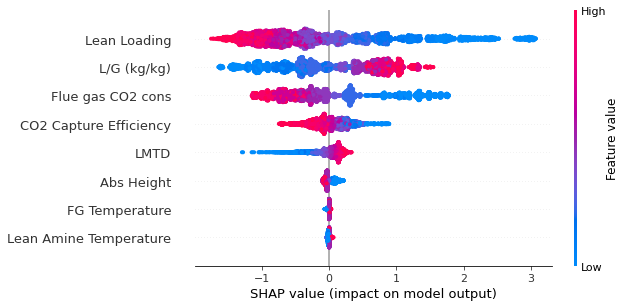

In [100]:
shap.plots.beeswarm(shap_values[:,:,0], show=False)
plt.savefig('Figures\\SHAP1 SRD.png', dpi=600, bbox_inches='tight')

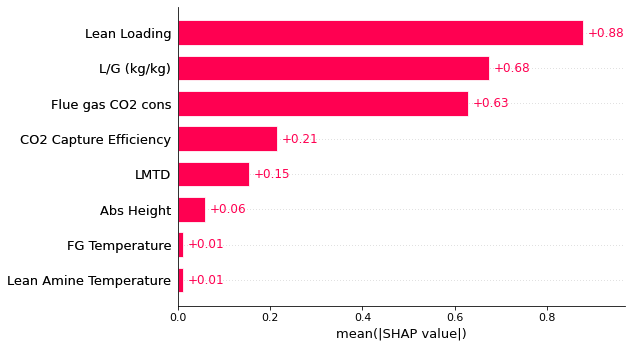

In [101]:
shap.plots.bar(shap_values[:,:,0], show=False)
plt.savefig('Figures\\SHAP2 SRD.png', dpi=600, bbox_inches='tight')

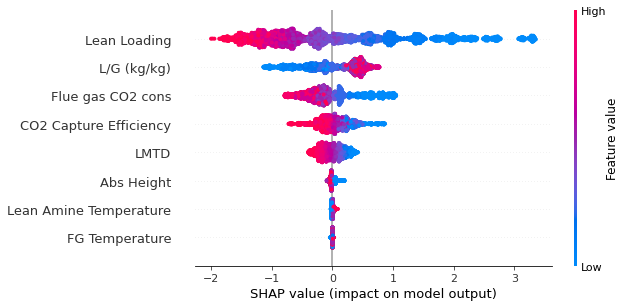

In [102]:
shap.plots.beeswarm(shap_values[:,:,1], show=False)
plt.savefig('Figures\\SHAP1 SCondenserD.png', dpi=600, bbox_inches='tight')

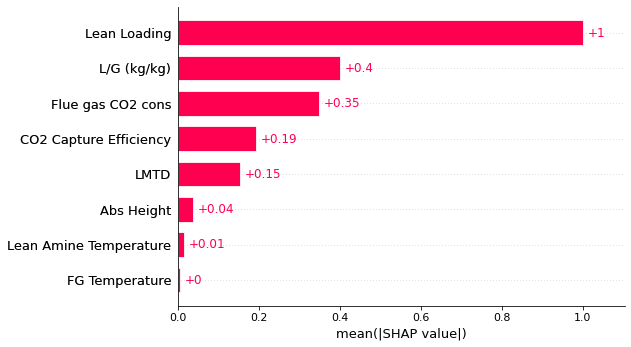

In [103]:
shap.plots.bar(shap_values[:,:,1], show=False)
plt.savefig('Figures\\SHAP2 SCondenserD.png', dpi=600, bbox_inches='tight')

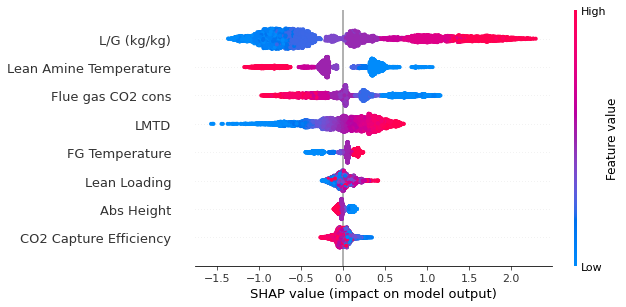

In [104]:
shap.plots.beeswarm(shap_values[:,:,2], show=False)
plt.savefig('Figures\\SHAP1 SLAcoolD.png', dpi=600, bbox_inches='tight')

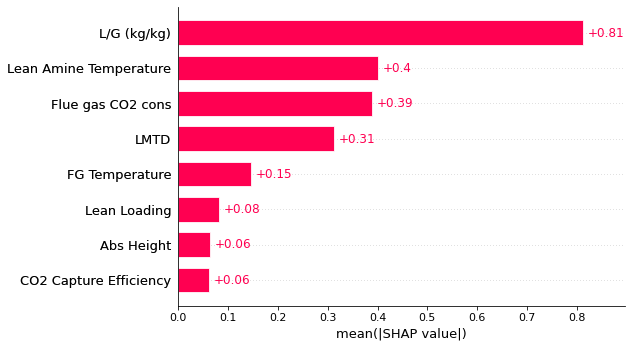

In [105]:
shap.plots.bar(shap_values[:,:,2], show=False)
plt.savefig('Figures\\SHAP2 SLAcoolD.png', dpi=600, bbox_inches='tight')